In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
sys.path.append("C:/Users/zhipe/OneDrive/Desktop/Master thesis/demostration")

from causal_ensemble_model import *
from utilities_ensemble import *
from utilities_plotting import *
import numpy as np
import pandas as pd
import seaborn as sns 
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score
from scipy import stats
import matplotlib.pyplot as plt

$${B(t+1)} = 0.25{B(t)} + 1.18{A(t-2)}{B(t-1)} - 1.72{A(t-1)}^{2}{A(t-3)} + {\epsilon}_{1}$$
$${C(t+1)} = -1.31{A(t-1)}{C(t-1)} + 0.52{A(t)}^2 + 0.79{A(t-4)}^{2}{C(t-2)} + {\epsilon}_{2}$$
$${E(t+1)} = -0.93{A(t-3)}{D(t-1)} + 1.22{D(t)}^{2}{E(t-3)} - 1.45{A(t)}^{4}{E(t-1)} + {\epsilon}_{3}$$
$${F(t+1)} = 1.54{H(t-1)}{F(t)} - 1.03{\sin}({H(t)}) + {\epsilon}_{4}$$
$${G(t+1)} = 1.33{E(t-2)}^{2}{G(t-1)} + 0.66{E(t-3)}{G(t-3)} - 0.33{\exp}({E(t-1)}) + {\epsilon}_{5}$$
$${H(t+1)} = 1.66{D(t)} - 1.45{D(t-2)} + {\epsilon}_{6}$$
A -> B, A -> C A,D -> E D -> H  H -> F  E -> G

In [2]:
np.random.seed(31)
A = np.random.rand(20005) 
np.random.seed(102)
B = np.random.rand(20005) 
np.random.seed(9)
C = np.random.rand(20005) 
np.random.seed(4)
D = np.random.rand(20005) 
np.random.seed(74)
E = np.random.rand(20005) 
np.random.seed(91)
F = np.random.rand(20005) 
np.random.seed(89)
G = np.random.rand(20005) 
np.random.seed(256)
H = np.random.rand(20005) 
np.random.seed(12)
e_1 = np.random.normal(size=(20005,)) / 100
np.random.seed(662)
e_2 = np.random.normal(size=(20005,)) / 100
np.random.seed(21)
e_3 = np.random.normal(size=(20005,)) / 100
np.random.seed(33)
e_4 = np.random.normal(size=(20005,)) / 100
np.random.seed(109)
e_5 = np.random.normal(size=(20005,)) / 100
np.random.seed(77)
e_6 = np.random.normal(size=(20005,)) / 100


list_0 = np.linspace(4,20003,20000).astype(int)
for i in list_0:
    B[i+1] = 0.25 * B[i] + 1.18 * A[i-2] * B[i-1] - 1.72 * A[i-2] ** 2 * A[i-3] + e_1[i]
    C[i+1] = -1.31 * A[i-1] * C[i-1] + 0.52 * A[i] ** 2 + 0.79 * A[i-4] ** 2 * C[i-2] + e_2[i]
    E[i+1] = -0.93 * A[i-3] * D[i-1] + 1.22 * D[i] ** 2 * E[i-3] - 1.45 * A[i] ** 4 * E[i-1] + e_3[i]
    H[i+1] = 1.66 * D[i] - 1.45 * D[i-2] + e_6[i]
for i in list_0:
    F[i+1] = 1.54 * H[i-1] * F[i] - 0.99 * np.sin(H[i]) + e_4[i]
    G[i+1] = 1.33 * E[i-2] ** 2 * G[i-1] + 0.66 * E[i-3] * G[i-3] - 0.33 * np.exp(E[i-1]) + e_5[i]

A_0 = A[5:] * 100
B_0 = B[5:] * 100
C_0 = C[5:] * 100
D_0 = D[5:] * 100
E_0 = E[5:] * 100
F_0 = F[5:] * 100
G_0 = G[5:] * 100
H_0 = H[5:] * 100

df = pd.DataFrame({'A': A_0, 'B': B_0, 'C': C_0, 'D': D_0, 'E': E_0, 'F': F_0, 'G': G_0, 'H': H_0})

In [3]:
df

,A,B,C,D,E,F,G,H
0,13.691705,-16.142217,-12.913953,21.608950,-16.440092,1.531512,-22.234467,-24.749768
1,90.837380,-67.213070,8.180471,97.627445,-46.806136,24.569065,-18.664948,-69.752172
2,6.863852,-28.118629,52.918111,0.623026,34.225480,54.075840,-27.477185,61.166428
3,7.533272,-18.680171,-18.870053,25.298236,-19.131962,-112.925438,-12.143495,-31.874560
4,54.353469,-55.048747,-4.345625,43.479153,-0.236430,-75.444184,-52.239330,-97.996327
...,...,...,...,...,...,...,...,...
19995,54.639915,-273.631098,89.213010,23.491404,-19.445922,-188.818667,-39.463067,-34.580917
19996,72.842009,-308.846864,18.519227,80.448939,-11.001355,5.150985,-30.218391,28.295544
19997,86.002106,-420.454311,-43.443556,14.897628,11.261479,-30.594639,-31.144812,119.850529
19998,51.855364,-344.469558,61.012734,24.903000,-49.494616,-105.262521,-32.317396,-9.729553


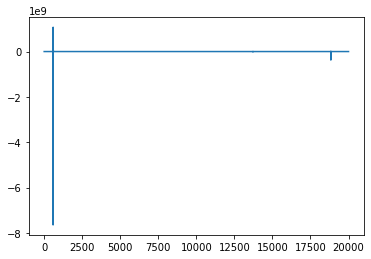

In [4]:
X = np.linspace(0,19999,20000)
y = G_0
plt.plot(X,y)

In [5]:
data_use = df
feature_names = data_use.columns.tolist()

In [6]:
df_process = df.copy()

for i in feature_names:
    q3, q1 = np.percentile(df_process[i], [90 ,10])
    iqr = q3 - q1
    upper = q3 + 2 * iqr
    lower = q1 - 2 * iqr
    df_process[i][df_process[i]>upper] = (upper + 0.01)
    df_process[i][df_process[i]<lower] = (lower - 0.01)

    n = len(df_process)
    j = 1
    while j < (n-1):
        if df_process[i][j] > upper or df_process[i][j] < lower:
            n_start = j-1
            n_end = j+1
            for k in range(n):
                if df_process[i][n_end] > upper or df_process[i][n_end] < lower:
                    n_end += 1
                    if n_end == n-1:
                        break
                else: 
                    break
            num = n_end - n_start - 1
            for l in range(num):
                df_process[i][j+l] = ((df_process[i][n_end] 
                                       - df_process[i][n_start]) 
                                      / (num+1) 
                                      * (l+1) 
                                      + df_process[i][n_start])
            j += num
        j += 1
                              
df_process          


,A,B,C,D,E,F,G,H
0,13.691705,-16.142217,-12.913953,21.608950,-16.440092,1.531512,-22.234467,-24.749768
1,90.837380,-67.213070,8.180471,97.627445,-46.806136,24.569065,-18.664948,-69.752172
2,6.863852,-28.118629,52.918111,0.623026,34.225480,54.075840,-27.477185,61.166428
3,7.533272,-18.680171,-18.870053,25.298236,-19.131962,-112.925438,-12.143495,-31.874560
4,54.353469,-55.048747,-4.345625,43.479153,-0.236430,-75.444184,-52.239330,-97.996327
...,...,...,...,...,...,...,...,...
19995,54.639915,-273.631098,89.213010,23.491404,-19.445922,-188.818667,-39.463067,-34.580917
19996,72.842009,-308.846864,18.519227,80.448939,-11.001355,5.150985,-30.218391,28.295544
19997,86.002106,-420.454311,-43.443556,14.897628,11.261479,-30.594639,-31.144812,119.850529
19998,51.855364,-344.469558,61.012734,24.903000,-49.494616,-105.262521,-32.317396,-9.729553


In [7]:
ce = causal_ensemble(df_process, feature_names, num_parts=10, threshold=0.3)

# 1. CCM 

In [8]:
causal_ccm_parts = ce.ccm(lag=1, 
                          embed=6, 
                          split_percent=0.75, 
                          num_iter=20, 
                          convergence_threshold=0.01)

In [9]:
causal_ccm_parts

array([[[0.    , 0.4621, 0.6438, 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.396 , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.5498, 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.7098, 0.4845, 0.71  , 0.    , 0.    ]],

       [[0.    , 0.    , 0.5549, 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.7179],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0. 

# 2. TE

In [10]:
causal_nte_parts = ce.nte(k=6, max_lag=6)

In [11]:
causal_nte_parts

array([[[0.    , 0.    , 0.6663, 0.    , 0.4454, 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.3461, 0.3623, 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.5391, 0.    , 0.    , 0.615 ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.3985, 0.4538, 0.    , 0.    ]],

       [[0.    , 0.    , 0.6866, 0.    , 0.4144, 0.    , 0.    , 0.    ],
        [0.3089, 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.3336, 0.    , 0.    , 0.6228],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0. 

# 3. PCMCI

In [12]:
pc_alpha = [0.01, 0.02, 0.03, 0.04, 0.05]
causal_pcmciplus_parts = ce.pcmciplus(max_lag=6, 
                                      pc_alpha=pc_alpha, 
                                      cond_ind_test='parCorr')


##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.01]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/48):
    Subset 0: () gives pval = 0.69807 / val = -0.009
    Non-significance detected.

    Link (A -2) --> A (2/48):
    Subset 0: () gives pval = 0.41588 / val = -0.018
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.32059 / val = -0.022
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.49673 / val = -0.015
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.96710 / val = -0.001
    Non-significance detected.

    Link (A -

    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.671
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> B (4/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.372
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> B (5/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.336
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> B (6/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val = -0.365
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> B (7/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.265
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -2) --> B (8/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.32988 / val =  0.022
    Non-significance detected.

    Link (B -3) --> B (9/15):
    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.226
    Still subsets 

    Subset 0: (C -2)  gives pval = 0.64640 / val =  0.010
    Non-significance detected.

    Link (B -3) --> C (14/21):
    Subset 0: (C -2)  gives pval = 0.09878 / val =  0.037
    Non-significance detected.

    Link (B -1) --> C (15/21):
    Subset 0: (C -2)  gives pval = 0.03013 / val = -0.049
    Non-significance detected.

    Link (E -6) --> C (16/21):
    Subset 0: (C -2)  gives pval = 0.00886 / val =  0.059
    No conditions of dimension 1 left.

    Link (C -6) --> C (17/21):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.246
    No conditions of dimension 1 left.

    Link (E -5) --> C (18/21):
    Subset 0: (C -2)  gives pval = 0.77906 / val =  0.006
    Non-significance detected.

    Link (G -5) --> C (19/21):
    Subset 0: (C -2)  gives pval = 0.13132 / val = -0.034
    Non-significance detected.

    Link (G -1) --> C (20/21):
    Subset 0: (C -2)  gives pval = 0.33919 / val = -0.021
    Non-significance detected.

    Link (G -3) --> C (21/21):
    Subset 0: (C

    Subset 0: () gives pval = 0.00000 / val =  0.194
    No conditions of dimension 0 left.

    Link (B -2) --> E (8/48):
    Subset 0: () gives pval = 0.17091 / val = -0.031
    Non-significance detected.

    Link (B -3) --> E (9/48):
    Subset 0: () gives pval = 0.76105 / val =  0.007
    Non-significance detected.

    Link (B -4) --> E (10/48):
    Subset 0: () gives pval = 0.08035 / val =  0.039
    Non-significance detected.

    Link (B -5) --> E (11/48):
    Subset 0: () gives pval = 0.00611 / val =  0.061
    No conditions of dimension 0 left.

    Link (B -6) --> E (12/48):
    Subset 0: () gives pval = 0.02876 / val = -0.049
    Non-significance detected.

    Link (C -1) --> E (13/48):
    Subset 0: () gives pval = 0.00000 / val =  0.165
    No conditions of dimension 0 left.

    Link (C -2) --> E (14/48):
    Subset 0: () gives pval = 0.37633 / val =  0.020
    Non-significance detected.

    Link (C -3) --> E (15/48):
    Subset 0: () gives pval = 0.00000 / val = -0.2

    Subset 0: (D -2) (A -4)  gives pval = 0.00089 / val =  0.074
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> E (20/21):
    Subset 0: (D -2) (A -4)  gives pval = 0.00000 / val = -0.120
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> E (21/21):
    Subset 0: (D -2) (A -4)  gives pval = 0.00000 / val =  0.151
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 19 link(s):
        (A -4): max_pval = 0.00000, min_val =  0.379
        (E -4): max_pval = 0.00000, min_val =  0.340
        (E -2): max_pval = 0.00000, min_val =  0.289
        (A -1): max_pval = 0.00000, min_val =  0.267
        (D -1): max_pval = 0.00000, min_val =  0.242
        (D -2): max_pval = 0.00000, min_val =  0.173
        (H -1): max_pval = 0.00000, min_val =  0.160
        (D -4): max_pval = 0.

    Subset 0: () gives pval = 0.83448 / val = -0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 18 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.300
        (F -1): max_pval = 0.00000, min_val =  0.298
        (H -1): max_pval = 0.00000, min_val =  0.271
        (D -3): max_pval = 0.00000, min_val =  0.228
        (D -4): max_pval = 0.00000, min_val =  0.211
        (D -5): max_pval = 0.00000, min_val =  0.197
        (E -1): max_pval = 0.00000, min_val =  0.178
        (D -2): max_pval = 0.00000, min_val =  0.177
        (H -3): max_pval = 0.00000, min_val =  0.158
        (H -4): max_pval = 0.00000, min_val =  0.139
        (F -2): max_pval = 0.00000, min_val =  0.116
        (E -3): max_pval = 0.00000, min_val =  0.112
        (G -1): max_pval = 0.00002, min_val =  0.096
        (F -5): max_pval = 0.00015, min_val =  0.085
        (F -3): max

    Subset 0: () gives pval = 0.00014 / val =  0.085
    No conditions of dimension 0 left.

    Link (D -4) --> G (22/48):
    Subset 0: () gives pval = 0.24787 / val =  0.026
    Non-significance detected.

    Link (D -5) --> G (23/48):
    Subset 0: () gives pval = 0.00000 / val = -0.151
    No conditions of dimension 0 left.

    Link (D -6) --> G (24/48):
    Subset 0: () gives pval = 0.00295 / val =  0.067
    No conditions of dimension 0 left.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.104
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.357
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.00000 / val =  0.168
    No conditions of dimension 0 left.

    Link (E -4) --> G (28/48):
    Subset 0: () gives pval = 0.00000 / val = -0.139
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: ()

    Subset 0: (E -2) (E -3) (E -4)  gives pval = 0.00000 / val =  0.270
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> G (3/20):
    Subset 0: (E -2) (G -2) (E -4)  gives pval = 0.00000 / val =  0.271
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> G (4/20):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00000 / val = -0.273
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> G (5/20):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00086 / val = -0.075
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> G (6/20):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.02589 / val =  0.050
    Non-significance detected.

    Link (B -6) --> G (7/20):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00002 / val =  0.095
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (8/20):
    Subset 0: (E -2) (G -2) (E -3)  gives

    Subset 0: (G -2) (E -3) (E -4) (B -6) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00000 / val = -0.485
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (G -2) --> G (2/10):
    Subset 0: (E -2) (E -3) (E -4) (B -6) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00000 / val =  0.257
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (E -3) --> G (3/10):
    Subset 0: (E -2) (G -2) (E -4) (B -6) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00000 / val =  0.212
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (E -4) --> G (4/10):
    Subset 0: (E -2) (G -2) (E -3) (B -6) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00000 / val = -0.236
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (B -6) --> G (5/10):
    Subset 0: (E -2) (G -2) (E -3) (E -4) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00036 / val =  0.080
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -5) --> G (6/10):



    Link (A  0) o-o B (1/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.32920 / val = -0.022
    Non-significance detected.

    Link (A -3) --> B (2/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.844
    No conditions of dimension 0 left.

    Link (A -4) --> B (3/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.172
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.26341 / val = -0.025
    Non-significance detected.

    Link (A -1) --> C (5/89):
    Iterate 

    Subset 0: () gives pval = 0.00000 / val =  0.258
    No conditions of dimension 0 left.

    Link (F -2) --> F (66/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -1) (H -2) (F -1) (G -1) (F -5) ]
    with conds_x = [ (H -3) (H -4) (F -3) (F -4) (G -3) (F -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.134
    No conditions of dimension 0 left.

    Link (F -5) --> F (67/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -1) (H -2) (F -1) (F -2) (G -1) ]
    with conds_x = [ (H -6) (H -7) (F -6) (F -7) (G -6) (F -10) ]
    Subset 0: () gives pval = 0.04944 / val =  0.044
    Non-significance detected.

    Link (F  0) o-o G (68/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (E -4) (D -5) (E -6) (F -2) (G -6) (B -2) ]
    with conds_x = [ (H -1) (H -2) (F -1) (F -2) (G -1) (F -5) ]
    Subset 0: () gives pval = 0.64960 / val = -0.010
    Non-significance detected.

    Link 

    Subset 0: (E 0) (B 0)  gives pval = 0.00000 / val = -0.560
    No conditions of dimension 2 left.

    Link (C -3) --> C (5/5):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (A -4) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (A -7) ]
    Subset 0: (E 0) (B 0)  gives pval = 0.00000 / val =  0.373
    No conditions of dimension 2 left.

Updated contemp. adjacencies:

    Variable A has 0 link(s):

    Variable B has 1 link(s):
        (C  0): max_pval = 0.00472, min_val =  0.063

    Variable C has 2 link(s):
        (E  0): max_pval = 0.00109, min_val =  0.073
        (B  0): max_pval = 0.00528, min_val =  0.063

    Variable D has 0 link(s):

    Variable E has 1 link(s):
        (C  0): max_pval = 0.00097, min_val =  0.074

    Variable F has 0 link(s):

    Variable G has 0 link(s):

    Variable H has 0 link(s):

Algorithm converged at p = 2.

----------------------------
Collider orientation phase
----------------------------



    Subset 0: () gives pval = 0.21440 / val =  0.028
    Non-significance detected.

    Link (D -3) --> A (21/48):
    Subset 0: () gives pval = 0.57239 / val =  0.013
    Non-significance detected.

    Link (D -4) --> A (22/48):
    Subset 0: () gives pval = 0.77229 / val = -0.006
    Non-significance detected.

    Link (D -5) --> A (23/48):
    Subset 0: () gives pval = 0.71832 / val = -0.008
    Non-significance detected.

    Link (D -6) --> A (24/48):
    Subset 0: () gives pval = 0.46790 / val =  0.016
    Non-significance detected.

    Link (E -1) --> A (25/48):
    Subset 0: () gives pval = 0.12435 / val = -0.034
    Non-significance detected.

    Link (E -2) --> A (26/48):
    Subset 0: () gives pval = 0.59757 / val = -0.012
    Non-significance detected.

    Link (E -3) --> A (27/48):
    Subset 0: () gives pval = 0.54452 / val =  0.014
    Non-significance detected.

    Link (E -4) --> A (28/48):
    Subset 0: () gives pval = 0.36917 / val = -0.020
    Non-significanc

    Subset 0: () gives pval = 0.86306 / val = -0.004
    Non-significance detected.

    Link (H -1) --> C (43/48):
    Subset 0: () gives pval = 0.14406 / val = -0.033
    Non-significance detected.

    Link (H -2) --> C (44/48):
    Subset 0: () gives pval = 0.20417 / val =  0.028
    Non-significance detected.

    Link (H -3) --> C (45/48):
    Subset 0: () gives pval = 0.41496 / val =  0.018
    Non-significance detected.

    Link (H -4) --> C (46/48):
    Subset 0: () gives pval = 0.21227 / val = -0.028
    Non-significance detected.

    Link (H -5) --> C (47/48):
    Subset 0: () gives pval = 0.84774 / val =  0.004
    Non-significance detected.

    Link (H -6) --> C (48/48):
    Subset 0: () gives pval = 0.23769 / val =  0.026
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 22 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.680
        (C -

    Subset 0: (E -4)  gives pval = 0.00017 / val =  0.084
    No conditions of dimension 1 left.

    Link (G -1) --> E (17/33):
    Subset 0: (E -4)  gives pval = 0.00259 / val =  0.068
    No conditions of dimension 1 left.

    Link (D -4) --> E (18/33):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.142
    No conditions of dimension 1 left.

    Link (H -4) --> E (19/33):
    Subset 0: (E -4)  gives pval = 0.32830 / val = -0.022
    Non-significance detected.

    Link (C -5) --> E (20/33):
    Subset 0: (E -4)  gives pval = 0.00608 / val =  0.062
    No conditions of dimension 1 left.

    Link (D -5) --> E (21/33):
    Subset 0: (E -4)  gives pval = 0.98541 / val =  0.000
    Non-significance detected.

    Link (F -1) --> E (22/33):
    Subset 0: (E -4)  gives pval = 0.00527 / val = -0.063
    No conditions of dimension 1 left.

    Link (A -3) --> E (23/33):
    Subset 0: (E -4)  gives pval = 0.00004 / val = -0.092
    No conditions of dimension 1 left.

    Link (F -3)

    Subset 0: (H -1) (H -2) (F -1) (F -2)  gives pval = 0.00644 / val =  0.061
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 8 link(s):
        (H -1): max_pval = 0.00000, min_val =  0.271
        (H -2): max_pval = 0.00000, min_val =  0.238
        (F -1): max_pval = 0.00000, min_val =  0.235
        (F -2): max_pval = 0.00000, min_val =  0.107
        (G -1): max_pval = 0.00140, min_val =  0.072
        (F -4): max_pval = 0.00501, min_val =  0.063
        (F -5): max_pval = 0.00644, min_val =  0.061
        (F -3): max_pval = 0.01224, min_val =  0.056

Testing condition sets of dimension 5:

    Link (H -1) --> F (1/8):
    Subset 0: (H -2) (F -1) (F -2) (G -1) (F -4)  gives pval = 0.00000 / val = -0.340
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -2) --> F (2/8):
    Subset 0: (H -1) (F -1) (F -2

    Subset 0: (E -2) (G -2) (E -3) (E -4)  gives pval = 0.97885 / val = -0.001
    Non-significance detected.

    Link (H -5) --> G (15/15):
    Subset 0: (E -2) (G -2) (E -3) (E -4)  gives pval = 0.01200 / val =  0.056
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 13 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.357
        (G -2): max_pval = 0.00000, min_val =  0.256
        (E -3): max_pval = 0.00000, min_val =  0.168
        (E -4): max_pval = 0.00000, min_val =  0.139
        (B -6): max_pval = 0.00002, min_val =  0.095
        (E -6): max_pval = 0.00010, min_val =  0.087
        (F -2): max_pval = 0.00025, min_val =  0.082
        (G -6): max_pval = 0.00025, min_val =  0.082
        (B -2): max_pval = 0.00064, min_val =  0.077
        (D -5): max_pval = 0.00086, min_val =  0.075
        (A -3): max_pval = 0.005

    Subset 0: () gives pval = 0.92728 / val =  0.002
    Non-significance detected.

    Link (A  0) o-o G (13/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (E -4) (D -5) (E -6) (F -2) (G -6) (B -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.38376 / val =  0.020
    Non-significance detected.

    Link (A  0) o-o H (14/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.73582 / val = -0.008
    Non-significance detected.

    Link (B  0) o-o A (15/88):
    Already removed.

    Link (B -1) --> B (16/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (A -4) ]
    with conds_x = [ (A -4) (B -3) (B -2) (A -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.300
    No conditions of dimension 0 left.

    Link (B -2) --> B (17/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = 

    Subset 2: (B 0) (H 0)  gives pval = 0.00000 / val =  0.616
    No conditions of dimension 2 left.

    Link (A -2) --> C (2/8):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) ]
    with conds_x = [ ]
    Subset 0: (E 0) (B 0)  gives pval = 0.00000 / val = -0.228
    Subset 1: (E 0) (H 0)  gives pval = 0.00000 / val = -0.228
    Subset 2: (B 0) (H 0)  gives pval = 0.00000 / val = -0.229
    No conditions of dimension 2 left.

    Link (A -4) --> C (3/8):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) ]
    with conds_x = [ ]
    Subset 0: (E 0) (B 0)  gives pval = 0.00343 / val = -0.066
    Subset 1: (E 0) (H 0)  gives pval = 0.00593 / val = -0.062
    Subset 2: (B 0) (H 0)  gives pval = 0.00012 / val = -0.086
    No conditions of dimension 2 left.

    Link (B  0) o-o C (4/8):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
  

    Subset 3: (E 0)  gives pval = 0.01490 / val = -0.055
    Subset 4: (E 0) (H 0)  gives pval = 0.01567 / val = -0.054
    Subset 5: (H 0)  gives pval = 0.06993 / val = -0.041
    Subset 6: (B 0)  gives pval = 0.06091 / val = -0.042
    Subset 7: (B 0) (H 0)  gives pval = 0.06061 / val = -0.042
    Fraction of separating subsets containing (E 0) is < 0.5 --> collider found

    Triple (D -1) --> H o-o C (14/27)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    with conds_x = [ (F -5) ]
    Subset 0: () gives pval = 0.37111 / val = -0.020
    Subset 1: (B 0) (E 0)  gives pval = 0.80669 / val = -0.006
    Subset 2: (B 0) (E 0) (H 0)  gives pval = 0.97063 / val =  0.001
    Subset 3: (E 0)  gives pval = 0.82437 / val = -0.005
    Subset 4: (E 0) (H 0)  gives pval = 0.93080 / val =  0.002
    Subset 5: (H 0)  gives pval = 0.87571 / val = -0.004
    Subset 6: (B 0)  gives pval = 0.35319 / val = -0.021
    Subset 7: (B 0) 

    Subset 0: () gives pval = 0.35902 / val =  0.021
    Non-significance detected.

    Link (A -2) --> B (2/48):
    Subset 0: () gives pval = 0.91661 / val = -0.002
    Non-significance detected.

    Link (A -3) --> B (3/48):
    Subset 0: () gives pval = 0.00000 / val = -0.493
    No conditions of dimension 0 left.

    Link (A -4) --> B (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.238
    No conditions of dimension 0 left.

    Link (A -5) --> B (5/48):
    Subset 0: () gives pval = 0.00000 / val = -0.324
    No conditions of dimension 0 left.

    Link (A -6) --> B (6/48):
    Subset 0: () gives pval = 0.00000 / val = -0.214
    No conditions of dimension 0 left.

    Link (B -1) --> B (7/48):
    Subset 0: () gives pval = 0.00000 / val =  0.753
    No conditions of dimension 0 left.

    Link (B -2) --> B (8/48):
    Subset 0: () gives pval = 0.00000 / val =  0.749
    No conditions of dimension 0 left.

    Link (B -3) --> B (9/48):
    Subset 0: () gives pval = 0.

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.444
    No conditions of dimension 1 left.

    Link (A -1) --> C (4/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.546
    No conditions of dimension 1 left.

    Link (C -4) --> C (5/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.188
    No conditions of dimension 1 left.

    Link (A -3) --> C (6/23):
    Subset 0: (C -2)  gives pval = 0.13031 / val =  0.034
    Non-significance detected.

    Link (A -6) --> C (7/23):
    Subset 0: (C -2)  gives pval = 0.00001 / val = -0.100
    No conditions of dimension 1 left.

    Link (A -5) --> C (8/23):
    Subset 0: (C -2)  gives pval = 0.88626 / val =  0.003
    Non-significance detected.

    Link (A -4) --> C (9/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.114
    No conditions of dimension 1 left.

    Link (C -1) --> C (10/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.379
    No conditions of dimension 1 left.

    Link (E -1) --> C

    Subset 0: (E -4)  gives pval = 0.27770 / val = -0.024
    Non-significance detected.

    Link (E -3) --> E (32/34):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.107
    No conditions of dimension 1 left.

    Link (B -5) --> E (33/34):
    Subset 0: (E -4)  gives pval = 0.15157 / val = -0.032
    Non-significance detected.

    Link (B -6) --> E (34/34):
    Subset 0: (E -4)  gives pval = 0.07566 / val = -0.040
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 21 link(s):
        (D -2): max_pval = 0.00000, min_val =  0.382
        (A -4): max_pval = 0.00000, min_val =  0.379
        (H -1): max_pval = 0.00000, min_val =  0.375
        (E -4): max_pval = 0.00000, min_val =  0.340
        (E -2): max_pval = 0.00000, min_val =  0.289
        (A -1): max_pval = 0.00000, min_val =  0.267
        (D -1): max_pval = 0.00000, min_val =  0.242
        (C -3)

    Subset 0: (H -1) (H -2)  gives pval = 0.19263 / val =  0.029
    Non-significance detected.

    Link (F -2) --> F (7/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.00000 / val =  0.214
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> F (8/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.00039 / val =  0.080
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -5) --> F (9/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.00004 / val =  0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -3) --> F (10/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.00000 / val =  0.127
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> F (11/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.00002 / val =  0.095
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> F (12/17):
    Subset 0: (H -1) (H -2)  gives pval = 0.98738 / val = -0.000
    Non-signifi

    Subset 0: (E -2) (G -2) (E -4)  gives pval = 0.00000 / val =  0.271
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> G (4/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00000 / val = -0.273
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> G (5/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00086 / val = -0.075
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> G (6/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.02589 / val =  0.050
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> G (7/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00002 / val =  0.095
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (8/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00064 / val =  0.077
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> G (9/21):
    Subset

    Subset 0: (E -2) (G -2) (E -3) (E -4) (B -6) (D -5) (E -6) (F -2) (G -6)  gives pval = 0.00000 / val =  0.123
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 12 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.357
        (G -2): max_pval = 0.00000, min_val =  0.249
        (E -3): max_pval = 0.00000, min_val =  0.168
        (E -4): max_pval = 0.00000, min_val =  0.139
        (D -5): max_pval = 0.00086, min_val =  0.075
        (E -6): max_pval = 0.00094, min_val =  0.074
        (F -2): max_pval = 0.00095, min_val =  0.074
        (G -6): max_pval = 0.00520, min_val =  0.063
        (B -2): max_pval = 0.00896, min_val =  0.059
        (A -3): max_pval = 0.02581, min_val =  0.050
        (C -2): max_pval = 0.02878, min_val =  0.049
        (F -1): max_pval = 0.02923, min_val =  0.049

Testing condition sets of dimens

    Subset 0: () gives pval = 0.41604 / val =  0.018
    Non-significance detected.

    Link (C  0) o-o G (33/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (E -4) (D -5) (E -6) (F -2) (G -6) (B -2) (F -1) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    Subset 0: () gives pval = 0.23637 / val =  0.027
    Non-significance detected.

    Link (C  0) o-o H (34/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    Subset 0: () gives pval = 0.00809 / val = -0.059
    No conditions of dimension 0 left.

    Link (D  0) o-o A (35/90):
    Already removed.

    Link (D  0) o-o B (36/90):
    Already removed.

    Link (D  0) o-o C (37/90):
    Already removed.

    Link (D  0) o-o E (38/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) ]
    with conds_x = [ (F -4) ]


    Subset 0: (E 0) (B 0)  gives pval = 0.00000 / val = -0.560
    Subset 1: (E 0) (H 0)  gives pval = 0.00000 / val = -0.559
    Subset 2: (B 0) (H 0)  gives pval = 0.00000 / val = -0.561
    No conditions of dimension 2 left.

    Link (C -3) --> C (6/8):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (A -4) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (A -7) ]
    Subset 0: (E 0) (B 0)  gives pval = 0.00000 / val =  0.373
    Subset 1: (E 0) (H 0)  gives pval = 0.00000 / val =  0.373
    Subset 2: (B 0) (H 0)  gives pval = 0.00000 / val =  0.372
    No conditions of dimension 2 left.

    Link (E  0) o-o C (7/8):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    with conds_x = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) ]
    Subset 0: (B 0) (H 0)  gives pval = 0.00098 / val =  0.074
    No conditions of dimension 2 left.

    Link (H  0) o-o C (8/8):
    Iterate through 1 su

    Subset 2: (B 0) (E 0) (H 0)  gives pval = 0.97397 / val =  0.001
    Subset 3: (E 0)  gives pval = 0.74723 / val =  0.007
    Subset 4: (E 0) (H 0)  gives pval = 0.93711 / val =  0.002
    Subset 5: (H 0)  gives pval = 0.85805 / val = -0.004
    Subset 6: (B 0)  gives pval = 0.59538 / val =  0.012
    Subset 7: (B 0) (H 0)  gives pval = 0.82164 / val = -0.005
    Fraction of separating subsets containing (H 0) is = 0.5 --> ambiguous triple found

    Triple (A -2) --> C o-o E (16/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.11622 / val = -0.035
    Subset 1: (C 0)  gives pval = 0.19216 / val = -0.029
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (B  0) o-o C o-o E (17/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) ]
   

    Subset 0: (B -1)  gives pval = 0.08075 / val = -0.039
    Non-significance detected.

    Link (C -6) --> B (19/23):
    Subset 0: (B -1)  gives pval = 0.00961 / val = -0.058
    No conditions of dimension 1 left.

    Link (G -1) --> B (20/23):
    Subset 0: (B -1)  gives pval = 0.00004 / val = -0.092
    No conditions of dimension 1 left.

    Link (C -3) --> B (21/23):
    Subset 0: (B -1)  gives pval = 0.00011 / val =  0.087
    No conditions of dimension 1 left.

    Link (D -5) --> B (22/23):
    Subset 0: (B -1)  gives pval = 0.00634 / val = -0.061
    No conditions of dimension 1 left.

    Link (G -6) --> B (23/23):
    Subset 0: (B -1)  gives pval = 0.11483 / val =  0.035
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 20 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.493
        (B -1): max_pval = 0.00000, min_val =  0.433
        (B -2

        (C -2): max_pval = 0.00000, min_val =  0.596
        (C -3): max_pval = 0.00000, min_val =  0.432
        (A -1): max_pval = 0.00000, min_val =  0.421
        (A -2): max_pval = 0.00000, min_val =  0.124
        (C -1): max_pval = 0.00004, min_val =  0.092
        (A -4): max_pval = 0.00038, min_val =  0.080
        (E -1): max_pval = 0.00190, min_val =  0.070

Testing condition sets of dimension 4:

    Link (C -2) --> C (1/7):
    Subset 0: (C -3) (A -1) (A -2) (C -1)  gives pval = 0.00000 / val = -0.726
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -3) --> C (2/7):
    Subset 0: (C -2) (A -1) (A -2) (C -1)  gives pval = 0.00000 / val =  0.388
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> C (3/7):
    Subset 0: (C -2) (C -3) (A -2) (C -1)  gives pval = 0.00000 / val =  0.616
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -2) --> C (4/7):
    Subset 0: (C -2) (C -3) (A -1) (C -1)  giv

    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.00000 / val =  0.320
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> E (5/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.00000 / val = -0.308
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -2) --> E (6/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.00000 / val = -0.483
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> E (7/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.00000 / val = -0.393
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -4) --> E (8/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.27464 / val =  0.025
    Non-significance detected.

    Link (C -3) --> E (9/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.37218 / val =  0.020
    Non-significance detected.

    Link (H -3) --> E (10/21):
    Subset 0: (A -4) (E -4) (E -2)  gives pval = 0.24450 / val =  0.026


Testing condition sets of dimension 5:

    Link (H -1) --> F (1/11):
    Subset 0: (H -2) (F -1) (F -2) (G -1) (F -4)  gives pval = 0.00000 / val = -0.340
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -2) --> F (2/11):
    Subset 0: (H -1) (F -1) (F -2) (G -1) (F -4)  gives pval = 0.00000 / val = -0.260
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -1) --> F (3/11):
    Subset 0: (H -1) (H -2) (F -2) (G -1) (F -4)  gives pval = 0.00000 / val =  0.242
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> F (4/11):
    Subset 0: (H -1) (H -2) (F -1) (G -1) (F -4)  gives pval = 0.00000 / val =  0.115
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (G -1) --> F (5/11):
    Subset 0: (H -1) (H -2) (F -1) (F -2) (F -4)  gives pval = 0.00292 / val =  0.067
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -4) --> F (6/11):
    Subset 0: (H -1) (H -2) (F -1)

    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00110 / val = -0.073
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -6) --> G (17/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.16799 / val = -0.031
    Non-significance detected.

    Link (H -4) --> G (18/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.05642 / val = -0.043
    Non-significance detected.

    Link (D -6) --> G (19/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00000 / val =  0.106
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -5) --> G (20/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00000 / val =  0.151
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> G (21/21):
    Subset 0: (E -2) (G -2) (E -3)  gives pval = 0.00001 / val =  0.101
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(t

    Subset 0: () gives pval = 0.44390 / val =  0.017
    Non-significance detected.

    Link (B -5) --> H (11/48):
    Subset 0: () gives pval = 0.22835 / val =  0.027
    Non-significance detected.

    Link (B -6) --> H (12/48):
    Subset 0: () gives pval = 0.81283 / val =  0.005
    Non-significance detected.

    Link (C -1) --> H (13/48):
    Subset 0: () gives pval = 0.16370 / val =  0.031
    Non-significance detected.

    Link (C -2) --> H (14/48):
    Subset 0: () gives pval = 0.45810 / val = -0.017
    Non-significance detected.

    Link (C -3) --> H (15/48):
    Subset 0: () gives pval = 0.52495 / val = -0.014
    Non-significance detected.

    Link (C -4) --> H (16/48):
    Subset 0: () gives pval = 0.16523 / val =  0.031
    Non-significance detected.

    Link (C -5) --> H (17/48):
    Subset 0: () gives pval = 0.90788 / val =  0.003
    Non-significance detected.

    Link (C -6) --> H (18/48):
    Subset 0: () gives pval = 0.06903 / val = -0.041
    Non-significanc

    Subset 0: () gives pval = 0.00809 / val = -0.059
    No conditions of dimension 0 left.

    Link (D  0) o-o A (35/94):
    Already removed.

    Link (D  0) o-o B (36/94):
    Already removed.

    Link (D -5) --> B (37/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -3) ]
    with conds_x = [ (F -9) ]
    Subset 0: () gives pval = 0.01205 / val = -0.056
    No conditions of dimension 0 left.

    Link (D  0) o-o C (38/94):
    Already removed.

    Link (D  0) o-o E (39/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) (E -1) ]
    with conds_x = [ (F -4) ]
    Subset 0: () gives pval = 0.08279 / val =  0.039
    Non-significance detected.

    Link (D -1) --> E (40/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -2) (E -1) ]
    with conds_x = [ (F -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0

    Subset 2: (H 0)  gives pval = 0.00000 / val =  0.615
    No conditions of dimension 1 left.

    Link (A -2) --> C (4/23):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) ]
    with conds_x = [ (G -3) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.229
    Subset 1: (B 0)  gives pval = 0.00000 / val = -0.230
    Subset 2: (H 0)  gives pval = 0.00000 / val = -0.230
    No conditions of dimension 1 left.

    Link (A -4) --> C (5/23):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) ]
    with conds_x = [ (G -5) ]
    Subset 0: (E 0)  gives pval = 0.00600 / val = -0.062
    Subset 1: (B 0)  gives pval = 0.00010 / val = -0.087
    Subset 2: (H 0)  gives pval = 0.00020 / val = -0.083
    No conditions of dimension 1 left.

    Link (A  0) o-o E (6/23):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) (E -1) ]
    with cond

    Subset 0: (C 0) (A 0)  gives pval = 0.00000 / val = -0.232
    No conditions of dimension 2 left.

    Link (E -4) --> E (13/14):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (A -1) (D -1) (D -2) (E -1) ]
    with conds_x = [ (A -8) (E -8) (E -6) (A -5) (D -5) (D -6) (E -5) ]
    Subset 0: (C 0) (A 0)  gives pval = 0.00000 / val =  0.220
    No conditions of dimension 2 left.

    Link (H  0) o-o C (14/14):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    with conds_x = [ (D -1) (D -3) ]
    Subset 0: (E 0) (B 0)  gives pval = 0.01131 / val = -0.057
    No conditions of dimension 2 left.

Updated contemp. adjacencies:

    Variable A has 1 link(s):
        (E  0): max_pval = 0.02183, min_val =  0.052

    Variable B has 1 link(s):
        (C  0): max_pval = 0.00409, min_val =  0.065

    Variable C has 3 link(s):
        (E  0): max_pval = 0.00132, min_val =  0.072
        (B  0): max

    Subset 7: (B 0) (H 0)  gives pval = 0.19025 / val = -0.029
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (B -2) --> B o-o C (16/36)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) ]
    with conds_x = [ (A -5) (B -4) (B -3) (A -6) (C -5) (D -7) ]
    Subset 0: () gives pval = 0.23627 / val = -0.027
    Subset 1: (B 0) (E 0)  gives pval = 0.17540 / val = -0.031
    Subset 2: (B 0) (E 0) (H 0)  gives pval = 0.17842 / val = -0.030
    Subset 3: (E 0)  gives pval = 0.23031 / val = -0.027
    Subset 4: (E 0) (H 0)  gives pval = 0.23429 / val = -0.027
    Subset 5: (H 0)  gives pval = 0.24288 / val = -0.026
    Subset 6: (B 0)  gives pval = 0.16400 / val = -0.031
    Subset 7: (B 0) (H 0)  gives pval = 0.17087 / val = -0.031
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (D -5) --> B o-o C (17/36)
    Iterate through 8

    Subset 0: () gives pval = 0.00377 / val =  0.065
    No conditions of dimension 0 left.

    Link (E -6) --> B (30/48):
    Subset 0: () gives pval = 0.17599 / val =  0.030
    Non-significance detected.

    Link (F -1) --> B (31/48):
    Subset 0: () gives pval = 0.20366 / val =  0.029
    Non-significance detected.

    Link (F -2) --> B (32/48):
    Subset 0: () gives pval = 0.09078 / val =  0.038
    Non-significance detected.

    Link (F -3) --> B (33/48):
    Subset 0: () gives pval = 0.05062 / val =  0.044
    Non-significance detected.

    Link (F -4) --> B (34/48):
    Subset 0: () gives pval = 0.27914 / val =  0.024
    Non-significance detected.

    Link (F -5) --> B (35/48):
    Subset 0: () gives pval = 0.21111 / val =  0.028
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.35164 / val =  0.021
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.02022 / val =  0.052
    No cond

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.444
    No conditions of dimension 1 left.

    Link (A -1) --> C (4/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.546
    No conditions of dimension 1 left.

    Link (C -4) --> C (5/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.188
    No conditions of dimension 1 left.

    Link (A -3) --> C (6/23):
    Subset 0: (C -2)  gives pval = 0.13031 / val =  0.034
    Non-significance detected.

    Link (A -6) --> C (7/23):
    Subset 0: (C -2)  gives pval = 0.00001 / val = -0.100
    No conditions of dimension 1 left.

    Link (A -5) --> C (8/23):
    Subset 0: (C -2)  gives pval = 0.88626 / val =  0.003
    Non-significance detected.

    Link (A -4) --> C (9/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.114
    No conditions of dimension 1 left.

    Link (C -1) --> C (10/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.379
    No conditions of dimension 1 left.

    Link (E -1) --> C

        (A -3): max_pval = 0.00001, min_val =  0.098
        (F -3): max_pval = 0.00001, min_val =  0.098
        (A -5): max_pval = 0.00001, min_val =  0.098
        (D -3): max_pval = 0.00003, min_val =  0.093
        (G -3): max_pval = 0.00004, min_val =  0.092
        (H -6): max_pval = 0.00005, min_val =  0.091
        (A -6): max_pval = 0.00011, min_val =  0.087
        (G -6): max_pval = 0.00043, min_val =  0.079
        (F -5): max_pval = 0.00104, min_val =  0.073
        (E -3): max_pval = 0.00131, min_val =  0.072
        (B -5): max_pval = 0.00611, min_val =  0.061
        (B -6): max_pval = 0.02876, min_val =  0.049
        (E -1): max_pval = 0.03549, min_val =  0.047
        (E -5): max_pval = 0.03891, min_val =  0.046
        (F -4): max_pval = 0.04322, min_val =  0.045

Testing condition sets of dimension 1:

    Link (E -4) --> E (1/37):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.340
    No conditions of dimension 1 left.

    Link (E -2) --> E (2/37):
    Su

    Subset 0: () gives pval = 0.00000 / val =  0.139
    No conditions of dimension 0 left.

    Link (H -5) --> F (47/48):
    Subset 0: () gives pval = 0.80902 / val =  0.005
    Non-significance detected.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.83448 / val = -0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 23 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.300
        (F -1): max_pval = 0.00000, min_val =  0.298
        (H -1): max_pval = 0.00000, min_val =  0.271
        (D -3): max_pval = 0.00000, min_val =  0.228
        (D -4): max_pval = 0.00000, min_val =  0.211
        (D -5): max_pval = 0.00000, min_val =  0.197
        (E -1): max_pval = 0.00000, min_val =  0.178
        (D -2): max_pval = 0.00000, min_val =  0.177
        (H -3): max_pval = 0.00000, min_val =  0.158
        (H -4): max_pval = 0.00000, min_val 

    Subset 0: () gives pval = 0.39793 / val = -0.019
    Non-significance detected.

    Link (D -2) --> G (20/48):
    Subset 0: () gives pval = 0.87007 / val =  0.004
    Non-significance detected.

    Link (D -3) --> G (21/48):
    Subset 0: () gives pval = 0.00014 / val =  0.085
    No conditions of dimension 0 left.

    Link (D -4) --> G (22/48):
    Subset 0: () gives pval = 0.24787 / val =  0.026
    Non-significance detected.

    Link (D -5) --> G (23/48):
    Subset 0: () gives pval = 0.00000 / val = -0.151
    No conditions of dimension 0 left.

    Link (D -6) --> G (24/48):
    Subset 0: () gives pval = 0.00295 / val =  0.067
    No conditions of dimension 0 left.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.104
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.357
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.

    Subset 0: (E -2) (E -3) (E -4) (B -6) (E -6) (F -2)  gives pval = 0.00000 / val =  0.273
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -3) --> G (3/15):
    Subset 0: (E -2) (G -2) (E -4) (B -6) (E -6) (F -2)  gives pval = 0.00000 / val =  0.264
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -4) --> G (4/15):
    Subset 0: (E -2) (G -2) (E -3) (B -6) (E -6) (F -2)  gives pval = 0.00000 / val = -0.223
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -6) --> G (5/15):
    Subset 0: (E -2) (G -2) (E -3) (E -4) (E -6) (F -2)  gives pval = 0.00017 / val =  0.084
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -6) --> G (6/15):
    Subset 0: (E -2) (G -2) (E -3) (E -4) (B -6) (F -2)  gives pval = 0.00001 / val =  0.101
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -2) --> G (7/15):
    Subset 0: (E -2) (G -2) (E -3) (E -4) (B -6) (E -6)  gives pval = 

    Subset 0: (D -1)  gives pval = 0.00000 / val = -0.755
    No conditions of dimension 1 left.

    Link (E -1) --> H (4/6):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.382
    No conditions of dimension 1 left.

    Link (E -2) --> H (5/6):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.244
    No conditions of dimension 1 left.

    Link (F -1) --> H (6/6):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.178
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.755
        (D -3): max_pval = 0.00000, min_val =  0.660
        (H -2): max_pval = 0.00000, min_val =  0.497
        (E -1): max_pval = 0.00000, min_val =  0.265
        (E -2): max_pval = 0.00000, min_val =  0.149
        (F -1): max_pval = 0.00000, min_val =  0.110

Testing condition sets of dimension 2:

    Link 

    Subset 0: () gives pval = 0.12552 / val =  0.035
    Non-significance detected.

    Link (E -4) --> G (63/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (D -5) (E -6) (G -6) (B -2) (F -1) (E -1) (C -2) ]
    with conds_x = [ (A -8) (E -8) (E -6) (A -5) (D -5) (D -6) (E -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0.168
    No conditions of dimension 0 left.

    Link (E -6) --> G (64/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -4) (E -3) (D -5) (G -6) (B -2) (F -1) (E -1) (C -2) ]
    with conds_x = [ (A -10) (E -10) (E -8) (A -7) (D -7) (D -8) (E -7) ]
    Subset 0: () gives pval = 0.00433 / val =  0.064
    No conditions of dimension 0 left.

    Link (E  0) o-o H (65/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (A -4) (E -4) (E -2) (A -1) (D -1) (D -2) (E -1) ]
    Subset 0: () gives pval = 0.37288 / val = -0.02

    Subset 1: (A 0)  gives pval = 0.00000 / val = -0.232
    No conditions of dimension 1 left.

    Link (E -4) --> E (22/23):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (A -1) (D -1) (D -2) (E -1) ]
    with conds_x = [ (A -8) (E -8) (E -6) (A -5) (D -5) (D -6) (E -5) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.219
    Subset 1: (A 0)  gives pval = 0.00000 / val =  0.219
    No conditions of dimension 1 left.

    Link (H  0) o-o C (23/23):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) (E -1) ]
    with conds_x = [ (D -1) (D -3) ]
    Subset 0: (E 0)  gives pval = 0.00916 / val = -0.059
    Subset 1: (B 0)  gives pval = 0.00757 / val = -0.060
    No conditions of dimension 1 left.

Updated contemp. adjacencies:

    Variable A has 1 link(s):
        (E  0): max_pval = 0.02183, min_val =  0.052

    Variable B has 1 link(s):
        (C  0): max_pval = 0.00406, min_val =  0.065


    Subset 0: () gives pval = 0.07364 / val =  0.040
    Subset 1: (C 0)  gives pval = 0.09997 / val =  0.037
    Subset 2: (A 0) (C 0)  gives pval = 0.10872 / val =  0.036
    Subset 3: (A 0)  gives pval = 0.08163 / val =  0.039
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (H  0) o-o C o-o B (13/36)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -3) (D -5) ]
    with conds_x = [ (D -1) (D -3) ]
    Subset 0: () gives pval = 0.21228 / val =  0.028
    Subset 1: (C 0)  gives pval = 0.17138 / val =  0.031
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A -3) --> B o-o C (14/36)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) (E -1) ]
    with conds_x = [ (G -4) ]
    Subset 0: () gives pval = 0.60211 / val =  0.012
    Subset 1: (B 0) (E 0)  gives pval = 0.


##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.01]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/48):
    Subset 0: () gives pval = 0.40869 / val =  0.019
    Non-significance detected.

    Link (A -2) --> A (2/48):
    Subset 0: () gives pval = 0.70324 / val = -0.009
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.42612 / val =  0.018
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.08483 / val =  0.039
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.46335 / val = -0.016
    Non-significance detected.

    Link (A -

    Subset 0: () gives pval = 0.14502 / val = -0.033
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.37591 / val = -0.020
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.109
    No conditions of dimension 0 left.

    Link (G -2) --> B (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.134
    No conditions of dimension 0 left.

    Link (G -3) --> B (39/48):
    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (G -4) --> B (40/48):
    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (G -5) --> B (41/48):
    Subset 0: () gives pval = 0.00040 / val =  0.079
    No conditions of dimension 0 left.

    Link (G -6) --> B (42/48):
    Subset 0: () gives pval = 0.00309 / val =  0.066
    No conditions of dimension 0 left.

    Link (H -1) --> B (43/48):
    Subset 0: () gives p

    Subset 0: () gives pval = 0.39732 / val = -0.019
    Non-significance detected.

    Link (D -6) --> C (24/48):
    Subset 0: () gives pval = 0.39957 / val =  0.019
    Non-significance detected.

    Link (E -1) --> C (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.158
    No conditions of dimension 0 left.

    Link (E -2) --> C (26/48):
    Subset 0: () gives pval = 0.00001 / val =  0.097
    No conditions of dimension 0 left.

    Link (E -3) --> C (27/48):
    Subset 0: () gives pval = 0.00006 / val =  0.090
    No conditions of dimension 0 left.

    Link (E -4) --> C (28/48):
    Subset 0: () gives pval = 0.00000 / val = -0.115
    No conditions of dimension 0 left.

    Link (E -5) --> C (29/48):
    Subset 0: () gives pval = 0.17390 / val = -0.031
    Non-significance detected.

    Link (E -6) --> C (30/48):
    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (F -1) --> C (31/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.91563 / val =  0.002
    Non-significance detected.

    Link (B -1) --> D (7/48):
    Subset 0: () gives pval = 0.04600 / val = -0.045
    Non-significance detected.

    Link (B -2) --> D (8/48):
    Subset 0: () gives pval = 0.42815 / val = -0.018
    Non-significance detected.

    Link (B -3) --> D (9/48):
    Subset 0: () gives pval = 0.44995 / val = -0.017
    Non-significance detected.

    Link (B -4) --> D (10/48):
    Subset 0: () gives pval = 0.58127 / val = -0.012
    Non-significance detected.

    Link (B -5) --> D (11/48):
    Subset 0: () gives pval = 0.26976 / val = -0.025
    Non-significance detected.

    Link (B -6) --> D (12/48):
    Subset 0: () gives pval = 0.48490 / val = -0.016
    Non-significance detected.

    Link (C -1) --> D (13/48):
    Subset 0: () gives pval = 0.28819 / val =  0.024
    Non-significance detected.

    Link (C -2) --> D (14/48):
    Subset 0: () gives pval = 0.29360 / val = -0.024
    Non-significance d

    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.271
    No conditions of dimension 1 left.

    Link (A -4) --> E (3/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.421
    No conditions of dimension 1 left.

    Link (E -6) --> E (4/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.141
    No conditions of dimension 1 left.

    Link (D -2) --> E (5/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.366
    No conditions of dimension 1 left.

    Link (H -1) --> E (6/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.352
    No conditions of dimension 1 left.

    Link (C -3) --> E (7/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.176
    No conditions of dimension 1 left.

    Link (D -1) --> E (8/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.281
    No conditions of dimension 1 left.

    Link (A -1) --> E (9/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.227
    No conditions of dimension 1 left.

    Li

    Subset 0: (A -4) (E -2) (D -1) (A -1)  gives pval = 0.00000 / val =  0.482
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> E (2/13):
    Subset 0: (E -4) (E -2) (D -1) (A -1)  gives pval = 0.00000 / val = -0.478
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (E -2) --> E (3/13):
    Subset 0: (E -4) (A -4) (D -1) (A -1)  gives pval = 0.00000 / val = -0.327
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> E (4/13):
    Subset 0: (E -4) (A -4) (E -2) (A -1)  gives pval = 0.00000 / val = -0.341
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> E (5/13):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00000 / val =  0.279
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -2) --> E (6/13):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00000 / val = -0.453
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.00000 / val = -0.290
    No conditions of dimension 0 left.

    Link (H -2) --> F (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.355
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.160
    No conditions of dimension 0 left.

    Link (H -4) --> F (46/48):
    Subset 0: () gives pval = 0.00000 / val =  0.167
    No conditions of dimension 0 left.

    Link (H -5) --> F (47/48):
    Subset 0: () gives pval = 0.22674 / val = -0.027
    Non-significance detected.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.76039 / val = -0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 13 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.355
        (H -1): max_pval = 0.00000, min_val =  0.290
        (D -3): max_pval = 0.00000, min_val

    Subset 0: () gives pval = 0.53349 / val = -0.014
    Non-significance detected.

    Link (G -1) --> G (37/48):
    Subset 0: () gives pval = 0.01785 / val =  0.053
    Non-significance detected.

    Link (G -2) --> G (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.301
    No conditions of dimension 0 left.

    Link (G -3) --> G (39/48):
    Subset 0: () gives pval = 0.89857 / val = -0.003
    Non-significance detected.

    Link (G -4) --> G (40/48):
    Subset 0: () gives pval = 0.00000 / val =  0.130
    No conditions of dimension 0 left.

    Link (G -5) --> G (41/48):
    Subset 0: () gives pval = 0.65263 / val = -0.010
    Non-significance detected.

    Link (G -6) --> G (42/48):
    Subset 0: () gives pval = 0.03774 / val =  0.047
    Non-significance detected.

    Link (H -1) --> G (43/48):
    Subset 0: () gives pval = 0.84330 / val = -0.004
    Non-significance detected.

    Link (H -2) --> G (44/48):
    Subset 0: () gives pval = 0.00000 / val =  0.134
   

    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.19511 / val =  0.029
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 10 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.301
        (E -2): max_pval = 0.00000, min_val =  0.277
        (E -3): max_pval = 0.00000, min_val =  0.219
        (A -3): max_pval = 0.00000, min_val =  0.166
        (B -6): max_pval = 0.00008, min_val =  0.088
        (E -6): max_pval = 0.00014, min_val =  0.086
        (F -4): max_pval = 0.00048, min_val =  0.078
        (E -4): max_pval = 0.00075, min_val =  0.076
        (A -4): max_pval = 0.00532, min_val =  0.062
        (H -5): max_pval = 0.00652, min_val =  0.061

Testing condition sets of dimension 4:

    Link (G -2) --> G (1/10):
    Subset 0: (E -2) (E -3) (A -3) (B -6)  gives pval = 0.00000 / val =  0.351
    Still subsets of dimension 4 left, but q_max = 1 reached.


    Subset 0: () gives pval = 0.40975 / val =  0.018
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.169
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0.130
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.11587 / val =  0.035
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.08272 / val =  0.039
    Non-significance detected.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.86177 / val =  0.004
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.02732 / val = -0.049
    Non-significance detected.

    Link (F -1) --> H (31/48):
    Subset 0: () gives pval = 0.00000 / val =  0.115
    No conditions of dimension 0 left.

    Link (F -2) --> H (32/48):
    Subset 0: () gives pval = 0.94451 / val = -0

    Subset 0: () gives pval = 0.01484 / val = -0.055
    Non-significance detected.

    Link (C  0) o-o G (35/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) ]
    Subset 0: () gives pval = 0.00484 / val =  0.063
    No conditions of dimension 0 left.

    Link (C  0) o-o H (36/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) ]
    Subset 0: () gives pval = 0.76704 / val =  0.007
    Non-significance detected.

    Link (D  0) o-o A (37/85):
    Already removed.

    Link (D  0) o-o B (38/85):
    Already removed.

    Link (D  0) o-o C (39/85):
    Already removed.

    Link (D  0) o-o E (40/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval 

    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.241
    No conditions of dimension 1 left.

    Link (E -4) --> E (17/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -8) (A -8) (E -6) (D -5) (A -5) (D -6) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.372
    No conditions of dimension 1 left.

    Link (E -2) --> G (18/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.323
    No conditions of dimension 1 left.

    Link (E -3) --> G (19/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (A -3) (B -6) (E -4) (A -4) ]
    with conds_x = [ (E -7) (A -7) (E -5) (D -4) (A -4) (D -5) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.128
    No conditions of dimension 1

    Subset 2: () gives pval = 0.63628 / val = -0.011
    Subset 3: (G 0)  gives pval = 0.24337 / val = -0.026
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (A -2) --> C o-o E (16/24)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.66644 / val = -0.010
    Subset 1: (C 0)  gives pval = 0.93359 / val = -0.002
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -2) --> C o-o E (17/24)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (C -6) ]
    Subset 0: () gives pval = 0.23651 / val = -0.027
    Subset 1: (C 0)  gives pval = 0.64268 / val =  0.010
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

  

    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (G -5) --> B (41/48):
    Subset 0: () gives pval = 0.00040 / val =  0.079
    No conditions of dimension 0 left.

    Link (G -6) --> B (42/48):
    Subset 0: () gives pval = 0.00309 / val =  0.066
    No conditions of dimension 0 left.

    Link (H -1) --> B (43/48):
    Subset 0: () gives pval = 0.86362 / val =  0.004
    Non-significance detected.

    Link (H -2) --> B (44/48):
    Subset 0: () gives pval = 0.66372 / val = -0.010
    Non-significance detected.

    Link (H -3) --> B (45/48):
    Subset 0: () gives pval = 0.59284 / val = -0.012
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.88426 / val = -0.003
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.73826 / val =  0.007
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.84467 / val = -0

    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.231
    No conditions of dimension 1 left.

    Link (C -1) --> C (10/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.439
    No conditions of dimension 1 left.

    Link (E -1) --> C (11/22):
    Subset 0: (C -2)  gives pval = 0.02161 / val = -0.052
    Non-significance detected.

    Link (A -5) --> C (12/22):
    Subset 0: (C -2)  gives pval = 0.91729 / val =  0.002
    Non-significance detected.

    Link (E -4) --> C (13/22):
    Subset 0: (C -2)  gives pval = 0.00410 / val = -0.064
    No conditions of dimension 1 left.

    Link (E -6) --> C (14/22):
    Subset 0: (C -2)  gives pval = 0.13682 / val =  0.033
    Non-significance detected.

    Link (A -2) --> C (15/22):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.127
    No conditions of dimension 1 left.

    Link (E -2) --> C (16/22):
    Subset 0: (C -2)  gives pval = 0.00002 / val =  0.096
    No conditions of dimension 1 left.

    Link (B -3) --> C (

    Subset 0: (E -4)  gives pval = 0.10602 / val =  0.036
    Non-significance detected.

    Link (F -3) --> E (18/35):
    Subset 0: (E -4)  gives pval = 0.10846 / val =  0.036
    Non-significance detected.

    Link (A -5) --> E (19/35):
    Subset 0: (E -4)  gives pval = 0.69872 / val =  0.009
    Non-significance detected.

    Link (G -3) --> E (20/35):
    Subset 0: (E -4)  gives pval = 0.00231 / val = -0.068
    No conditions of dimension 1 left.

    Link (H -4) --> E (21/35):
    Subset 0: (E -4)  gives pval = 0.96058 / val =  0.001
    Non-significance detected.

    Link (A -3) --> E (22/35):
    Subset 0: (E -4)  gives pval = 0.00001 / val = -0.098
    No conditions of dimension 1 left.

    Link (A -6) --> E (23/35):
    Subset 0: (E -4)  gives pval = 0.00003 / val =  0.093
    No conditions of dimension 1 left.

    Link (D -5) --> E (24/35):
    Subset 0: (E -4)  gives pval = 0.06504 / val =  0.041
    Non-significance detected.

    Link (H -2) --> E (25/35):
    Subs

    Subset 0: (H -1) (D -2)  gives pval = 0.00000 / val = -0.373
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> F (2/10):
    Subset 0: (H -2) (D -2)  gives pval = 0.00000 / val = -0.218
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -2) --> F (3/10):
    Subset 0: (H -2) (H -1)  gives pval = 0.85319 / val =  0.004
    Non-significance detected.

    Link (D -4) --> F (4/10):
    Subset 0: (H -2) (H -1)  gives pval = 0.85948 / val =  0.004
    Non-significance detected.

    Link (H -3) --> F (5/10):
    Subset 0: (H -2) (H -1)  gives pval = 0.21247 / val =  0.028
    Non-significance detected.

    Link (F -1) --> F (6/10):
    Subset 0: (H -2) (H -1)  gives pval = 0.00000 / val =  0.210
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> F (7/10):
    Subset 0: (H -2) (H -1)  gives pval = 0.52013 / val =  0.014
    Non-significance detected.

    Link (F -4) --> F (8/10):
    Subset 0: (H -

    Subset 0: (G -2) (E -2)  gives pval = 0.34748 / val =  0.021
    Non-significance detected.

    Link (E -6) --> G (12/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00003 / val =  0.093
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> G (13/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> G (14/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00004 / val = -0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> G (15/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.245
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> G (16/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00966 / val =  0.058
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> G (17/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00103 / val =  0.074
    Still su

    Subset 0: () gives pval = 0.67428 / val =  0.009
    Non-significance detected.

    Link (A -6) --> H (6/48):
    Subset 0: () gives pval = 0.14347 / val =  0.033
    Non-significance detected.

    Link (B -1) --> H (7/48):
    Subset 0: () gives pval = 0.67249 / val = -0.009
    Non-significance detected.

    Link (B -2) --> H (8/48):
    Subset 0: () gives pval = 0.95357 / val = -0.001
    Non-significance detected.

    Link (B -3) --> H (9/48):
    Subset 0: () gives pval = 0.85264 / val =  0.004
    Non-significance detected.

    Link (B -4) --> H (10/48):
    Subset 0: () gives pval = 0.45175 / val =  0.017
    Non-significance detected.

    Link (B -5) --> H (11/48):
    Subset 0: () gives pval = 0.94569 / val =  0.002
    Non-significance detected.

    Link (B -6) --> H (12/48):
    Subset 0: () gives pval = 0.73924 / val = -0.007
    Non-significance detected.

    Link (C -1) --> H (13/48):
    Subset 0: () gives pval = 0.53760 / val = -0.014
    Non-significance de

    Subset 0: () gives pval = 0.00000 / val =  0.410
    No conditions of dimension 0 left.

    Link (C -4) --> C (32/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -6) ]
    with conds_x = [ (C -6) (A -5) (C -7) (A -6) (C -8) (C -10) ]
    Subset 0: () gives pval = 0.67895 / val =  0.009
    Non-significance detected.

    Link (C -6) --> C (33/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -10) (C -12) ]
    Subset 0: () gives pval = 0.00001 / val = -0.102
    No conditions of dimension 0 left.

    Link (C  0) o-o D (34/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) (C -6) ]
    Subset 0: () gives pval = 0.06564 / val = -0.041
    Non-significance detected.

    Link (C  0) o-o E (35/90):
    Iterate through 1 subset(s) of cond

    Subset 1: (G 0)  gives pval = 0.00000 / val = -0.162
    Subset 2: (F 0)  gives pval = 0.00000 / val = -0.162
    No conditions of dimension 1 left.

    Link (A -1) --> E (5/29):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (D -2) ]
    with conds_x = [ (F -5) (F -2) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.278
    No conditions of dimension 1 left.

    Link (A -4) --> E (6/29):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (F -8) (F -5) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.513
    No conditions of dimension 1 left.

    Link (A -3) --> F (7/29):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -4) (G -2) ]
    with conds_x = [ (F -7) (F -4) ]
    Subset 0: (C 0)  gives pval = 0.00758 / val =  0.060
    No conditions of dimension 1 left.

    Link (A -3) --> G (8/29):
    It

    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val =  0.411
    Subset 2: (G 0) (F 0)  gives pval = 0.00000 / val =  0.408
    No conditions of dimension 2 left.

    Link (C -6) --> C (5/8):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -10) (C -12) ]
    Subset 0: (E 0) (G 0)  gives pval = 0.00000 / val = -0.108
    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val = -0.108
    Subset 2: (G 0) (F 0)  gives pval = 0.00001 / val = -0.102
    No conditions of dimension 2 left.

    Link (E  0) o-o C (6/8):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (C -6) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: (G 0) (F 0)  gives pval = 0.00014 / val =  0.086
    No conditions of dimension 2 left.

    Link (F  0) o-o C (7/8):
    Iterate through 1 subset(s) of conditions: 
    with conds_y

    Subset 2: (E 0) (G 0)  gives pval = 0.22701 / val = -0.027
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.19257 / val = -0.029
    Subset 4: (E 0)  gives pval = 0.55641 / val = -0.013
    Subset 5: (F 0)  gives pval = 0.38413 / val = -0.020
    Subset 6: (G 0)  gives pval = 0.17625 / val = -0.030
    Subset 7: () gives pval = 0.49210 / val = -0.015
    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

    Triple (A -3) --> G o-o C (14/40)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (C -6) ]
    with conds_x = [ (F -7) (F -4) ]
    Subset 0: (F 0) (G 0)  gives pval = 0.01355 / val = -0.056
    Subset 1: (E 0) (F 0)  gives pval = 0.01068 / val = -0.057
    Subset 2: (E 0) (G 0)  gives pval = 0.01508 / val = -0.055
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.01997 / val = -0.052
    Subset 4: (E 0)  gives pval = 0.00691 / val = -0.061
    Subset 5: (F 0)  gives pval = 0.00686 /

    Subset 1: (C 0)  gives pval = 0.07442 / val =  0.040
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -3) --> C o-o G (37/40)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (C -7) (C -9) ]
    Subset 0: () gives pval = 0.81622 / val =  0.005
    Subset 1: (C 0)  gives pval = 0.75360 / val = -0.007
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -6) --> C o-o G (38/40)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -10) (C -12) ]
    Subset 0: () gives pval = 0.30486 / val =  0.023
    Subset 1: (C 0)  gives pval = 0.24095 / val =  0.026
    Fraction of separating subsets containing (C 0) is = 0.5 --> 

    Subset 0: () gives pval = 0.94087 / val =  0.002
    Non-significance detected.

    Link (H -6) --> A (48/48):
    Subset 0: () gives pval = 0.33710 / val =  0.022
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 2 link(s):
        (F -4): max_pval = 0.01599, min_val =  0.054
        (F -1): max_pval = 0.01715, min_val =  0.053

Testing condition sets of dimension 1:

    Link (F -4) --> A (1/2):
    Subset 0: (F -1)  gives pval = 0.01673 / val = -0.054
    No conditions of dimension 1 left.

    Link (F -1) --> A (2/2):
    Subset 0: (F -4)  gives pval = 0.01795 / val =  0.053
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 2 link(s):
        (F -4): max_pval = 0.01673, min_val =  0.054
        (F -1): max_pval = 0.01795, min

    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.85102 / val = -0.004
    Non-significance detected.

    Link (E -3) --> B (7/9):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.05798 / val = -0.043
    Non-significance detected.

    Link (C -2) --> B (8/9):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.23502 / val =  0.027
    Non-significance detected.

    Link (C -3) --> B (9/9):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.43597 / val = -0.017
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 4 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.535
        (B -2): max_pval = 0.00000, min_val =  0.479
        (B -1): max_pval = 0.00000, min_val =  0.230
        (A -4): max_pval = 0.00000, min_val =  0.170

Algorithm converged for variable B

## Variable C

Iterating through pc_alpha = [0.03]:

# pc_alpha = 0

    Subset 0: (A -1) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1)  gives pval = 0.00000 / val = -0.578
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -1) --> C (2/8):
    Subset 0: (C -2) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1)  gives pval = 0.00000 / val =  0.540
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/8):
    Subset 0: (C -2) (A -1) (A -2) (C -6) (C -4) (E -1) (C -1)  gives pval = 0.00000 / val =  0.339
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -2) --> C (4/8):
    Subset 0: (C -2) (A -1) (C -3) (C -6) (C -4) (E -1) (C -1)  gives pval = 0.00042 / val = -0.079
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -6) --> C (5/8):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1)  gives pval = 0.00805 / val = -0.060
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -4) --> C (6/8):
    Subset 0: (C -2) (A -1) (C -3) (A -2

    Subset 0: (E -4)  gives pval = 0.05637 / val =  0.043
    Non-significance detected.

    Link (F -5) --> E (27/36):
    Subset 0: (E -4)  gives pval = 0.01255 / val = -0.056
    No conditions of dimension 1 left.

    Link (G -5) --> E (28/36):
    Subset 0: (E -4)  gives pval = 0.78994 / val = -0.006
    Non-significance detected.

    Link (G -6) --> E (29/36):
    Subset 0: (E -4)  gives pval = 0.71364 / val =  0.008
    Non-significance detected.

    Link (E -1) --> E (30/36):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.115
    No conditions of dimension 1 left.

    Link (D -4) --> E (31/36):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 1 left.

    Link (B -5) --> E (32/36):
    Subset 0: (E -4)  gives pval = 0.09055 / val = -0.038
    Non-significance detected.

    Link (E -3) --> E (33/36):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.114
    No conditions of dimension 1 left.

    Link (C -2) --> E (34/36):


    Subset 0: () gives pval = 0.34163 / val = -0.021
    Non-significance detected.

    Link (G -2) --> F (38/48):
    Subset 0: () gives pval = 0.01332 / val = -0.056
    No conditions of dimension 0 left.

    Link (G -3) --> F (39/48):
    Subset 0: () gives pval = 0.04823 / val = -0.044
    Non-significance detected.

    Link (G -4) --> F (40/48):
    Subset 0: () gives pval = 0.05178 / val = -0.044
    Non-significance detected.

    Link (G -5) --> F (41/48):
    Subset 0: () gives pval = 0.80367 / val = -0.006
    Non-significance detected.

    Link (G -6) --> F (42/48):
    Subset 0: () gives pval = 0.54250 / val =  0.014
    Non-significance detected.

    Link (H -1) --> F (43/48):
    Subset 0: () gives pval = 0.00000 / val = -0.290
    No conditions of dimension 0 left.

    Link (H -2) --> F (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.355
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0

    Subset 0: (G -2) (E -2)  gives pval = 0.00004 / val = -0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> G (15/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.245
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> G (16/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00966 / val =  0.058
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> G (17/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00103 / val =  0.074
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> G (18/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00001 / val =  0.099
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> G (19/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00159 / val = -0.071
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> G (20/24):
    Subset 0: (G -2) (E -2)  gives pval = 0.00

    Subset 0: () gives pval = 0.21993 / val =  0.028
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.08446 / val =  0.039
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 7 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.745
        (D -3): max_pval = 0.00000, min_val =  0.646
        (H -2): max_pval = 0.00000, min_val =  0.465
        (E -1): max_pval = 0.00000, min_val =  0.169
        (E -2): max_pval = 0.00000, min_val =  0.130
        (F -1): max_pval = 0.00000, min_val =  0.115
        (E -6): max_pval = 0.02732, min_val =  0.049

Testing condition sets of dimension 1:

    Link (D -1) --> H (1/7):
    Subset 0: (D -3)  gives pval = 0.00000 / val =  1.000
    No conditions of dimension 1 left.

    Link (D -3) --> H (2/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val = -1.000
    No conditions of

    Subset 0: () gives pval = 0.02026 / val = -0.052
    No conditions of dimension 0 left.

    Link (E -2) --> E (56/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.242
    No conditions of dimension 0 left.

    Link (E -4) --> E (57/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -8) (A -8) (E -6) (D -5) (A -5) (D -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.370
    No conditions of dimension 0 left.

    Link (E  0) o-o F (58/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -4) (A -3) (G -2) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: () gives pval = 0.45361 / val = -0.017
    Non-significance detected.

    Link (E  0) o-o G (

    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.327
    Subset 1: (G 0)  gives pval = 0.00000 / val =  0.325
    Subset 2: (F 0)  gives pval = 0.00000 / val =  0.324
    No conditions of dimension 1 left.

    Link (C -6) --> C (16/33):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -12) (C -10) (E -7) (C -7) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.112
    Subset 1: (G 0)  gives pval = 0.00000 / val = -0.104
    Subset 2: (F 0)  gives pval = 0.00000 / val = -0.104
    No conditions of dimension 1 left.

    Link (C  0) o-o E (17/33):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1) ]
    Subset 0: (D 0)  gives pval = 0.00018 / val =  0.084
    No conditions of dimension 1 left.

    Link (D  0) o-o E (18/

    Subset 0: (E 0) (G 0)  gives pval = 0.00001 / val = -0.100
    Subset 1: (E 0) (F 0)  gives pval = 0.00001 / val = -0.099
    Subset 2: (G 0) (F 0)  gives pval = 0.00001 / val = -0.098
    No conditions of dimension 2 left.

    Link (C -2) --> C (6/16):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (C -8) (C -6) (E -3) (C -3) ]
    Subset 0: (E 0) (G 0)  gives pval = 0.00000 / val = -0.498
    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val = -0.499
    Subset 2: (G 0) (F 0)  gives pval = 0.00000 / val = -0.499
    No conditions of dimension 2 left.

    Link (C -3) --> C (7/16):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (C -6) (C -4) (E -1) (C -1) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (C -9) (C -7) (E -4) (C -4) ]
    Subset 0: (E 0) (G 0)  gives pval = 0.00000 / val =  0.326
    Subset 1: (E 0) (

    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.06694 / val = -0.041
    Subset 4: (E 0)  gives pval = 0.08376 / val = -0.039
    Subset 5: (F 0)  gives pval = 0.05354 / val = -0.043
    Subset 6: (G 0)  gives pval = 0.05380 / val = -0.043
    Subset 7: () gives pval = 0.06101 / val = -0.042
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (D -1) --> E o-o C (7/54)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1) ]
    with conds_x = [ ]
    Subset 0: (F 0) (G 0)  gives pval = 0.83977 / val =  0.005
    Subset 1: (E 0) (F 0)  gives pval = 0.32148 / val =  0.022
    Subset 2: (E 0) (G 0)  gives pval = 0.36844 / val =  0.020
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.33931 / val =  0.022
    Subset 4: (E 0)  gives pval = 0.35020 / val =  0.021
    Subset 5: (F 0)  gives pval = 0.81903 / val =  0.005
    Subset 6: (G 0)  gives pval = 0.86544 / val = 

    Subset 4: (E 0)  gives pval = 0.00302 / val = -0.067
    Subset 5: (F 0)  gives pval = 0.00225 / val = -0.069
    Subset 6: (G 0)  gives pval = 0.00155 / val = -0.071
    Subset 7: () gives pval = 0.00253 / val = -0.068
    No separating subsets --> ambiguous triple found

    Triple (E -2) --> G o-o C (18/54)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -6) (C -4) (E -1) (C -1) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: (F 0) (G 0)  gives pval = 0.07281 / val =  0.040
    Subset 1: (E 0) (F 0)  gives pval = 0.06776 / val =  0.041
    Subset 2: (E 0) (G 0)  gives pval = 0.02467 / val =  0.051
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.02295 / val =  0.051
    Subset 4: (E 0)  gives pval = 0.08332 / val =  0.039
    Subset 5: (F 0)  gives pval = 0.20647 / val =  0.028
    Subset 6: (G 0)  gives pval = 0.07256 / val =  0.040
    Subset 7: () gives pval = 0.22696 / val =  0.027
 

    Subset 0: () gives pval = 0.96616 / val =  0.001
    Subset 1: (C 0)  gives pval = 0.45485 / val = -0.017
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -6) --> C o-o G (51/54)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -12) (C -10) (E -7) (C -7) ]
    Subset 0: () gives pval = 0.27009 / val =  0.025
    Subset 1: (C 0)  gives pval = 0.22049 / val =  0.028
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (E  0) o-o C o-o G (52/54)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: () gives pval = 0.90247 / val = -0.003
    Subset 1: (C 0)  gives pval = 0.87801 / val = -0.00

    Subset 0: () gives pval = 0.29922 / val = -0.023
    Non-significance detected.

    Link (D -6) --> B (24/48):
    Subset 0: () gives pval = 0.54379 / val = -0.014
    Non-significance detected.

    Link (E -1) --> B (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.154
    No conditions of dimension 0 left.

    Link (E -2) --> B (26/48):
    Subset 0: () gives pval = 0.74821 / val = -0.007
    Non-significance detected.

    Link (E -3) --> B (27/48):
    Subset 0: () gives pval = 0.00815 / val =  0.059
    No conditions of dimension 0 left.

    Link (E -4) --> B (28/48):
    Subset 0: () gives pval = 0.33887 / val =  0.021
    Non-significance detected.

    Link (E -5) --> B (29/48):
    Subset 0: () gives pval = 0.01019 / val =  0.058
    No conditions of dimension 0 left.

    Link (E -6) --> B (30/48):
    Subset 0: () gives pval = 0.50551 / val =  0.015
    Non-significance detected.

    Link (F -1) --> B (31/48):
    Subset 0: () gives pval = 0.76302 / val =  0

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.324
    No conditions of dimension 1 left.

    Link (C -3) --> C (3/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.481
    No conditions of dimension 1 left.

    Link (C -4) --> C (4/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.139
    No conditions of dimension 1 left.

    Link (A -1) --> C (5/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.443
    No conditions of dimension 1 left.

    Link (A -6) --> C (6/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.113
    No conditions of dimension 1 left.

    Link (A -3) --> C (7/23):
    Subset 0: (C -2)  gives pval = 0.11744 / val =  0.035
    Non-significance detected.

    Link (A -4) --> C (8/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.175
    No conditions of dimension 1 left.

    Link (C -6) --> C (9/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.231
    No conditions of dimension 1 left.

    Link (C -1

        (A -2): max_pval = 0.00113, min_val =  0.073
        (C -4): max_pval = 0.01140, min_val =  0.057
        (E -1): max_pval = 0.02161, min_val =  0.052
        (C -1): max_pval = 0.02327, min_val =  0.051
        (C -6): max_pval = 0.03583, min_val =  0.047
        (C -5): max_pval = 0.03985, min_val =  0.046

Algorithm converged for variable C

## Variable D

Iterating through pc_alpha = [0.04]:

# pc_alpha = 0.04 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> D (1/48):
    Subset 0: () gives pval = 0.88886 / val = -0.003
    Non-significance detected.

    Link (A -2) --> D (2/48):
    Subset 0: () gives pval = 0.11209 / val =  0.036
    Non-significance detected.

    Link (A -3) --> D (3/48):
    Subset 0: () gives pval = 0.69628 / val = -0.009
    Non-significance detected.

    Link (A -4) --> D (4/48):
    Subset 0: () gives pval = 0.05252 / val =  0.043
    Non-significance detected.

    Link (A -5) --> D (5/48):
    Subset 0: () gives pval = 0.1124

    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.387
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> E (4/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.369
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> E (5/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.297
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> E (6/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.314
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> E (7/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val =  0.259
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> E (8/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.01035 / val = -0.058
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> E (9/20):
    Subset 0: (E -4) (A -4)  gives pval = 0.05338 / 

    Subset 0: () gives pval = 0.72575 / val =  0.008
    Non-significance detected.

    Link (D -5) --> G (23/48):
    Subset 0: () gives pval = 0.00001 / val = -0.100
    No conditions of dimension 0 left.

    Link (D -6) --> G (24/48):
    Subset 0: () gives pval = 0.01755 / val =  0.053
    No conditions of dimension 0 left.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00004 / val = -0.092
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.277
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.00000 / val =  0.219
    No conditions of dimension 0 left.

    Link (E -4) --> G (28/48):
    Subset 0: () gives pval = 0.00000 / val = -0.153
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: () gives pval = 0.01569 / val = -0.054
    No conditions of dimension 0 left.

    Link (E -6) --> G (30/48):
    Subset 0: ()

    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.00086 / val = -0.075
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -4) --> G (9/13):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.00000 / val = -0.140
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -5) --> G (10/13):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.00006 / val =  0.090
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> G (11/13):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.00018 / val =  0.084
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -2) --> G (12/13):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.11553 / val =  0.035
    Non-significance detected.

    Link (D -6) --> G (13/13):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (E -6)  gives pval = 0.00020 / val =  0.084
    

    Subset 0: () gives pval = 0.00001 / val = -0.101
    No conditions of dimension 0 left.

    Link (C  0) o-o D (36/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    Subset 0: () gives pval = 0.06138 / val = -0.042
    Non-significance detected.

    Link (C  0) o-o E (37/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    Subset 0: () gives pval = 0.00009 / val =  0.088
    No conditions of dimension 0 left.

    Link (C  0) o-o F (38/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -4) (A -3) (G -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    Subset 0: () gives pval = 0.01695 / val = -0.054
    No conditions of dimensi

    Subset 2: (F 0)  gives pval = 0.00000 / val = -0.501
    No conditions of dimension 1 left.

    Link (C -3) --> C (15/34):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (C -7) (E -4) (C -4) (C -9) (C -8) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.331
    Subset 1: (G 0)  gives pval = 0.00000 / val =  0.329
    Subset 2: (F 0)  gives pval = 0.00000 / val =  0.328
    No conditions of dimension 1 left.

    Link (C -5) --> C (16/34):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) ]
    with conds_x = [ (C -7) (A -6) (C -8) (A -7) (C -9) (E -6) (C -6) (C -11) (C -10) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.143
    Subset 1: (G 0)  gives pval = 0.00000 / val =  0.131
    Subset 2: (F 0)  gives pval = 0.00000 / val =  0.131
    No conditions of dimension 

    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val = -0.500
    Subset 2: (G 0) (F 0)  gives pval = 0.00000 / val = -0.501
    No conditions of dimension 2 left.

    Link (C -3) --> C (7/17):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (C -7) (E -4) (C -4) (C -9) (C -8) ]
    Subset 0: (E 0) (G 0)  gives pval = 0.00000 / val =  0.329
    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val =  0.329
    Subset 2: (G 0) (F 0)  gives pval = 0.00000 / val =  0.327
    No conditions of dimension 2 left.

    Link (C -5) --> C (8/17):
    Iterate through 3 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) ]
    with conds_x = [ (C -7) (A -6) (C -8) (A -7) (C -9) (E -6) (C -6) (C -11) (C -10) ]
    Subset 0: (E 0) (G 0)  gives pval = 0.00000 / val =  0.141
    Subset 1: (E 0) (F 0)  gives pval = 0.00000 / val 

    Subset 4: (E 0)  gives pval = 0.48973 / val =  0.016
    Subset 5: (F 0)  gives pval = 0.44884 / val = -0.017
    Subset 6: (G 0)  gives pval = 0.70209 / val = -0.009
    Subset 7: () gives pval = 0.66606 / val = -0.010
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (E -2) --> E o-o C (9/57)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: (F 0) (G 0)  gives pval = 0.06449 / val =  0.042
    Subset 1: (E 0) (F 0)  gives pval = 0.05145 / val =  0.044
    Subset 2: (E 0) (G 0)  gives pval = 0.01662 / val =  0.054
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.01553 / val =  0.055
    Subset 4: (E 0)  gives pval = 0.06336 / val =  0.042
    Subset 5: (F 0)  gives pval = 0.19664 / val =  0.029
    Subset 6: (G 0)  gives pval = 0.06402 / val =  0.042
    Subset 7:

    Subset 1: () gives pval = 0.96632 / val = -0.001
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (A -4) --> E o-o D (23/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ ]
    with conds_x = [ (F -8) (F -5) ]
    Subset 0: (E 0)  gives pval = 0.22851 / val =  0.027
    Subset 1: () gives pval = 0.05110 / val =  0.044
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (C  0) o-o E o-o D (24/57)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    Subset 0: (E 0)  gives pval = 0.08667 / val = -0.039
    Subset 1: () gives pval = 0.06138 / val = -0.042
    Subset 2: (F 0) (G 0)  gives pval = 0.04891 / val = -0.044
    Subset 3: (E 0) (F 0)  gives pval = 0.07699 / val = -0.040
    Subset 4: (E 0) (G 0)  gives pval = 0.07744 / val = -0.040
 

    Subset 0: () gives pval = 0.43130 / val =  0.018
    Subset 1: (C 0)  gives pval = 0.37325 / val =  0.020
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -1) --> C o-o G (50/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (C -3) (A -2) (C -4) (A -3) (C -5) (E -2) (C -2) (C -7) (C -6) ]
    Subset 0: () gives pval = 0.59967 / val =  0.012
    Subset 1: (C 0)  gives pval = 0.39291 / val =  0.019
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -2) --> C o-o G (51/57)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (C -6) (E -3) (C -3) (C -8) (C -7) ]
    Subset 0: () gives pval = 0.66621 / val =  0.010
    Subset 1: (C 0)  gives pv

    No conditions of dimension 0 left.

    Link (C -5) --> B (17/48):
    Subset 0: () gives pval = 0.55662 / val = -0.013
    Non-significance detected.

    Link (C -6) --> B (18/48):
    Subset 0: () gives pval = 0.06896 / val = -0.041
    Non-significance detected.

    Link (D -1) --> B (19/48):
    Subset 0: () gives pval = 0.02486 / val = -0.050
    No conditions of dimension 0 left.

    Link (D -2) --> B (20/48):
    Subset 0: () gives pval = 0.40888 / val = -0.019
    Non-significance detected.

    Link (D -3) --> B (21/48):
    Subset 0: () gives pval = 0.14510 / val = -0.033
    Non-significance detected.

    Link (D -4) --> B (22/48):
    Subset 0: () gives pval = 0.22326 / val = -0.027
    Non-significance detected.

    Link (D -5) --> B (23/48):
    Subset 0: () gives pval = 0.29922 / val = -0.023
    Non-significance detected.

    Link (D -6) --> B (24/48):
    Subset 0: () gives pval = 0.54379 / val = -0.014
    Non-significance detected.

    Link (E -1) --> B (2

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.324
    No conditions of dimension 1 left.

    Link (C -3) --> C (3/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.481
    No conditions of dimension 1 left.

    Link (C -4) --> C (4/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.139
    No conditions of dimension 1 left.

    Link (A -1) --> C (5/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.443
    No conditions of dimension 1 left.

    Link (A -6) --> C (6/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.113
    No conditions of dimension 1 left.

    Link (A -3) --> C (7/24):
    Subset 0: (C -2)  gives pval = 0.11744 / val =  0.035
    Non-significance detected.

    Link (A -4) --> C (8/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.175
    No conditions of dimension 1 left.

    Link (C -6) --> C (9/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.231
    No conditions of dimension 1 left.

    Link (C -1

    Subset 0: (B -1)  gives pval = 0.05590 / val =  0.043
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 0 link(s):

Algorithm converged for variable D

## Variable E

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> E (1/48):
    Subset 0: () gives pval = 0.00000 / val =  0.193
    No conditions of dimension 0 left.

    Link (A -2) --> E (2/48):
    Subset 0: () gives pval = 0.61744 / val =  0.011
    Non-significance detected.

    Link (A -3) --> E (3/48):
    Subset 0: () gives pval = 0.00009 / val = -0.087
    No conditions of dimension 0 left.

    Link (A -4) --> E (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.370
    No conditions of dimension 0 left.

    Link (A -5) --> E (5/48):
    Subset 0: () gives pval = 0.00000 / val =  0.107
    No conditions of dimension 0 l

    Subset 0: (A -4) (E -2) (D -1) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val =  0.515
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -4) --> E (2/8):
    Subset 0: (E -4) (E -2) (D -1) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.513
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -2) --> E (3/8):
    Subset 0: (E -4) (A -4) (D -1) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.363
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> E (4/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.384
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> E (5/8):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val =  0.317
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -2) --> E (6/8):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1) (H -1)  gives pval = 0.000

        (C -5): max_pval = 0.00956, min_val =  0.058
        (E -5): max_pval = 0.01569, min_val =  0.054
        (D -6): max_pval = 0.01755, min_val =  0.053
        (G -1): max_pval = 0.01785, min_val =  0.053
        (A -5): max_pval = 0.01882, min_val =  0.053
        (G -6): max_pval = 0.03774, min_val =  0.047
        (C -3): max_pval = 0.03935, min_val =  0.046
        (C -2): max_pval = 0.04616, min_val =  0.045

Testing condition sets of dimension 1:

    Link (G -2) --> G (1/30):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.323
    No conditions of dimension 1 left.

    Link (E -2) --> G (2/30):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.301
    No conditions of dimension 1 left.

    Link (E -3) --> G (3/30):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.260
    No conditions of dimension 1 left.

    Link (A -3) --> G (4/30):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.215
    No conditions of dimension 1 left.

    Link (E -4) --> G (

    Subset 0: () gives pval = 0.86177 / val =  0.004
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.02732 / val = -0.049
    No conditions of dimension 0 left.

    Link (F -1) --> H (31/48):
    Subset 0: () gives pval = 0.00000 / val =  0.115
    No conditions of dimension 0 left.

    Link (F -2) --> H (32/48):
    Subset 0: () gives pval = 0.94451 / val = -0.002
    Non-significance detected.

    Link (F -3) --> H (33/48):
    Subset 0: () gives pval = 0.94495 / val =  0.002
    Non-significance detected.

    Link (F -4) --> H (34/48):
    Subset 0: () gives pval = 0.13905 / val = -0.033
    Non-significance detected.

    Link (F -5) --> H (35/48):
    Subset 0: () gives pval = 0.80263 / val = -0.006
    Non-significance detected.

    Link (F -6) --> H (36/48):
    Subset 0: () gives pval = 0.11818 / val =  0.035
    Non-significance detected.

    Link (G -1) --> H (37/48):
    Subset 0: () gives pval = 0.38485 / val =  0.020
   

    Subset 0: () gives pval = 0.47396 / val = -0.016
    Non-significance detected.

    Link (E  0) o-o G (61/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (E -6) ]
    Subset 0: () gives pval = 0.94299 / val = -0.002
    Non-significance detected.

    Link (E -2) --> G (62/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) (E -8) ]
    Subset 0: () gives pval = 0.00000 / val = -0.323
    No conditions of dimension 0 left.

    Link (E -3) --> G (63/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (E -7) (A -7) (E -5) (D -4) (A -4) (D -5) (E -9) ]
    Subset 0: () gives pval = 0.00000 / val =  0.129
    No c

    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.242
    Subset 1: (D 0)  gives pval = 0.00000 / val = -0.243
    No conditions of dimension 1 left.

    Link (E -4) --> E (25/35):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (D -1) (A -1) (D -2) (E -6) ]
    with conds_x = [ (E -8) (A -8) (E -6) (D -5) (A -5) (D -6) (E -10) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.371
    Subset 1: (D 0)  gives pval = 0.00000 / val =  0.371
    No conditions of dimension 1 left.

    Link (E -2) --> G (26/35):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -3) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) (E -8) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.323
    No conditions of dimension 1 left.

    Link (E -3) --> G (27/35):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (A -3) (B -6) (E -4) (A -4) (B -1) ]
    

    Subset 7: () gives pval = 0.04096 / val = -0.046
    Fraction of separating subsets containing (E 0) is > 0.5 --> non-collider found

    Triple (D  0) o-o E o-o C (6/57)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    with conds_x = [ ]
    Subset 0: (F 0) (G 0)  gives pval = 0.04891 / val = -0.044
    Subset 1: (E 0) (F 0)  gives pval = 0.07699 / val = -0.040
    Subset 2: (E 0) (G 0)  gives pval = 0.07744 / val = -0.040
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.06999 / val = -0.041
    Subset 4: (E 0)  gives pval = 0.08667 / val = -0.039
    Subset 5: (F 0)  gives pval = 0.05417 / val = -0.043
    Subset 6: (G 0)  gives pval = 0.05443 / val = -0.043
    Subset 7: () gives pval = 0.06138 / val = -0.042
    Fraction of separating subsets containing (E 0) is > 0.5 --> non-collider found

    Triple (D -1) --> E o-o C (7/57)
    Iterate through 8 condition subset(s) of neighbors:

    Subset 6: (G 0)  gives pval = 0.00211 / val = -0.069
    Subset 7: () gives pval = 0.00330 / val = -0.066
    No separating subsets --> ambiguous triple found

    Triple (E -2) --> G o-o C (18/57)
    Iterate through 8 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) (C -1) (C -6) (C -5) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) (E -8) ]
    Subset 0: (F 0) (G 0)  gives pval = 0.06490 / val =  0.042
    Subset 1: (E 0) (F 0)  gives pval = 0.05195 / val =  0.044
    Subset 2: (E 0) (G 0)  gives pval = 0.01688 / val =  0.054
    Subset 3: (E 0) (F 0) (G 0)  gives pval = 0.01575 / val =  0.054
    Subset 4: (E 0)  gives pval = 0.06402 / val =  0.042
    Subset 5: (F 0)  gives pval = 0.19701 / val =  0.029
    Subset 6: (G 0)  gives pval = 0.06452 / val =  0.042
    Subset 7: () gives pval = 0.21605 / val =  0.028
    Fraction of separating subsets containing (G 0) is < 0.5 --> collider found

    Triple (E -3) --

    Subset 3: (C 0) (D 0)  gives pval = 0.02786 / val = -0.050
    Fraction of separating subsets containing (C 0) is < 0.5 --> collider found

    Triple (C -5) --> C o-o E (33/57)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (E -6) ]
    with conds_x = [ (C -7) (A -6) (C -8) (A -7) (C -9) (E -6) (C -6) (C -11) (C -10) ]
    Subset 0: () gives pval = 0.17450 / val = -0.031
    Subset 1: (D 0)  gives pval = 0.15853 / val = -0.032
    Subset 2: (C 0)  gives pval = 0.71488 / val = -0.008
    Subset 3: (C 0) (D 0)  gives pval = 0.66619 / val = -0.010
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (C -6) --> C o-o E (34/57)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (E -6) ]
    with conds_x = [ (C -8) (A -7) (C -9) (A -8) (C -10) (E -7) (C -7) (C -12) (C -11) ]
    Subset 0: () gives pva


##

## Scores for individual pc_alpha values:

   pc_alpha =    0.01 yields score = 11815.58725
   pc_alpha =    0.02 yields score = 11809.11425
   pc_alpha =    0.03 yields score = 11806.40990
   pc_alpha =    0.04 yields score = 11806.15990
   pc_alpha =    0.05 yields score = 11807.00530

##
## Results for optimal pc_alpha = 0.04
##

## Significant links at alpha = 0.04:

    Variable A has 1 link(s):
        (B  0): pval = 0.00039 | val =  0.080 | unoriented link

    Variable B has 5 link(s):
        (A -3): pval = 0.00000 | val = -0.841
        (B -2): pval = 0.00000 | val =  0.422
        (B -1): pval = 0.00000 | val =  0.216
        (A -4): pval = 0.00000 | val = -0.202
        (A  0): pval = 0.00039 | val =  0.080 | unoriented link

    Variable C has 8 link(s):
        (A -1): pval = 0.00000 | val =  0.526
        (C -2): pval = 0.00000 | val = -0.500
        (C -3): pval = 0.00000 | val =  0.327
        (C -5): pval = 0.00000 | val =  0.129
        (C -6): pval = 0.00001 | 

    Subset 0: () gives pval = 0.59547 / val = -0.012
    Non-significance detected.

    Link (F -2) --> B (32/48):
    Subset 0: () gives pval = 0.36289 / val = -0.020
    Non-significance detected.

    Link (F -3) --> B (33/48):
    Subset 0: () gives pval = 0.58133 / val = -0.012
    Non-significance detected.

    Link (F -4) --> B (34/48):
    Subset 0: () gives pval = 0.97546 / val =  0.001
    Non-significance detected.

    Link (F -5) --> B (35/48):
    Subset 0: () gives pval = 0.69483 / val =  0.009
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.88500 / val =  0.003
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.133
    No conditions of dimension 0 left.

    Link (G -2) --> B (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.155
    No conditions of dimension 0 left.

    Link (G -3) --> B (39/48):
    Subset 0: () gives pval = 0.00000 / val =  0.116
   

    Subset 0: () gives pval = 0.00000 / val = -0.108
    No conditions of dimension 0 left.

    Link (D -1) --> C (19/48):
    Subset 0: () gives pval = 0.23884 / val =  0.026
    Non-significance detected.

    Link (D -2) --> C (20/48):
    Subset 0: () gives pval = 0.98285 / val =  0.000
    Non-significance detected.

    Link (D -3) --> C (21/48):
    Subset 0: () gives pval = 0.15880 / val = -0.032
    Non-significance detected.

    Link (D -4) --> C (22/48):
    Subset 0: () gives pval = 0.21995 / val =  0.028
    Non-significance detected.

    Link (D -5) --> C (23/48):
    Subset 0: () gives pval = 0.47644 / val =  0.016
    Non-significance detected.

    Link (D -6) --> C (24/48):
    Subset 0: () gives pval = 0.02744 / val = -0.049
    Non-significance detected.

    Link (E -1) --> C (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.117
    No conditions of dimension 0 left.

    Link (E -2) --> C (26/48):
    Subset 0: () gives pval = 0.08016 / val =  0.039
   

    Subset 0: () gives pval = 0.75230 / val = -0.007
    Non-significance detected.

    Link (B -5) --> D (11/48):
    Subset 0: () gives pval = 0.66011 / val =  0.010
    Non-significance detected.

    Link (B -6) --> D (12/48):
    Subset 0: () gives pval = 0.23348 / val =  0.027
    Non-significance detected.

    Link (C -1) --> D (13/48):
    Subset 0: () gives pval = 0.09778 / val = -0.037
    Non-significance detected.

    Link (C -2) --> D (14/48):
    Subset 0: () gives pval = 0.66356 / val =  0.010
    Non-significance detected.

    Link (C -3) --> D (15/48):
    Subset 0: () gives pval = 0.09861 / val =  0.037
    Non-significance detected.

    Link (C -4) --> D (16/48):
    Subset 0: () gives pval = 0.22022 / val = -0.028
    Non-significance detected.

    Link (C -5) --> D (17/48):
    Subset 0: () gives pval = 0.11535 / val = -0.035
    Non-significance detected.

    Link (C -6) --> D (18/48):
    Subset 0: () gives pval = 0.15768 / val =  0.032
    Non-significanc

    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.376
    No conditions of dimension 1 left.

    Link (A -4) --> E (5/31):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.393
    No conditions of dimension 1 left.

    Link (E -6) --> E (6/31):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.133
    No conditions of dimension 1 left.

    Link (D -1) --> E (7/31):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.264
    No conditions of dimension 1 left.

    Link (A -1) --> E (8/31):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.248
    No conditions of dimension 1 left.

    Link (H -5) --> E (9/31):
    Subset 0: (E -4)  gives pval = 0.03964 / val = -0.046
    Non-significance detected.

    Link (H -3) --> E (10/31):
    Subset 0: (E -4)  gives pval = 0.00006 / val =  0.090
    No conditions of dimension 1 left.

    Link (D -6) --> E (11/31):
    Subset 0: (E -4)  gives pval = 0.88300 / val =  0.003
    Non-significance detected.

    Link (C -3) --> 

    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -2)  gives pval = 0.00000 / val = -0.364
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> E (5/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (D -2)  gives pval = 0.00000 / val =  0.323
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -2) --> E (6/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1)  gives pval = 0.00000 / val = -0.506
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -1) --> E (7/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1)  gives pval = 0.00000 / val = -0.390
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 7 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.342
        (A -4): max_pval = 0.00000, min_val =  0.337
        (E -2): max_pval = 0.00000, min_val =  0.309
     

    Subset 0: (H -1) (D -4)  gives pval = 0.00000 / val = -0.408
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> F (3/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.10713 / val =  0.036
    Non-significance detected.

    Link (D -2) --> F (4/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.09459 / val =  0.038
    Non-significance detected.

    Link (H -3) --> F (5/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.02510 / val =  0.050
    Non-significance detected.

    Link (E -1) --> F (6/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.09226 / val =  0.038
    Non-significance detected.

    Link (F -4) --> F (7/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.00000 / val =  0.109
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -5) --> F (8/9):
    Subset 0: (H -1) (H -2)  gives pval = 0.00063 / val =  0.077
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -3) --> F (9/9):
    Subset 0: (H -1) (H -

    Non-significance detected.

    Link (H -6) --> G (24/26):
    Subset 0: (G -2)  gives pval = 0.00002 / val =  0.096
    No conditions of dimension 1 left.

    Link (A -5) --> G (25/26):
    Subset 0: (G -2)  gives pval = 0.89760 / val =  0.003
    Non-significance detected.

    Link (B -3) --> G (26/26):
    Subset 0: (G -2)  gives pval = 0.29715 / val =  0.023
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 20 link(s):

Testing condition sets of dimension 2:

    Link (G -2) --> G (1/20):
    Subset 0: (E -2) (G -1)  gives pval = 0.00000 / val =  0.337
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> G (2/20):
    Subset 0: (G -2) (G -1)  gives pval = 0.00000 / val = -0.326
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> G (3/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val 

    Subset 0: (G -2) (E -2) (E -3) (G -1) (A -3) (B -6)  gives pval = 0.00000 / val =  0.126
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -6) --> G (7/9):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (A -3) (G -6)  gives pval = 0.00028 / val =  0.082
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> G (8/9):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (A -3) (G -6)  gives pval = 0.00761 / val =  0.060
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -4) --> G (9/9):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (A -3) (G -6)  gives pval = 0.06968 / val =  0.041
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 8 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.336
        (E -2): max_pval = 0.00000, min_val =  0.295
        (E -3): max_pval = 0.00000, min_val =  0.161
        

--------------------------
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (A -4) (B -1) (B -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.40924 / val = -0.019
    Non-significance detected.

    Link (A -3) --> B (2/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -4) (B -1) (B -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.836
    No conditions of dimension 0 left.

    Link (A -4) --> B (3/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) (B -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.211
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (F

    Subset 0: () gives pval = 0.10847 / val =  0.036
    Non-significance detected.

    Link (F  0) o-o H (65/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (H -2) (H -1) (F -4) ]
    Subset 0: () gives pval = 0.43190 / val =  0.018
    Non-significance detected.

    Link (G  0) o-o A (66/84):
    Already removed.

    Link (G  0) o-o B (67/84):
    Already removed.

    Link (G  0) o-o C (68/84):
    Already removed.

    Link (G  0) o-o D (69/84):
    Already removed.

    Link (G  0) o-o E (70/84):
    Already removed.

    Link (G  0) o-o F (71/84):
    Already removed.

    Link (G -1) --> G (72/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (G -6) (B -6) ]
    with conds_x = [ (G -3) (E -3) (E -4) (G -2) (A -4) (G -7) (B -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.292
    No conditions of dimension 0 left.

    Link (G -2) --> G (73/84):
    Iterate 

    Subset 0: (B -2)  gives pval = 0.98563 / val =  0.000
    Non-significance detected.

    Link (C -4) --> B (19/20):
    Subset 0: (B -2)  gives pval = 0.05315 / val =  0.043
    Non-significance detected.

    Link (C -6) --> B (20/20):
    Subset 0: (B -2)  gives pval = 0.89039 / val = -0.003
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 10 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.502
        (A -3): max_pval = 0.00000, min_val =  0.500
        (B -1): max_pval = 0.00000, min_val =  0.375
        (A -4): max_pval = 0.00000, min_val =  0.228
        (B -3): max_pval = 0.00000, min_val =  0.149
        (C -2): max_pval = 0.00000, min_val =  0.133
        (B -5): max_pval = 0.00032, min_val =  0.081
        (G -1): max_pval = 0.00057, min_val =  0.077
        (A -6): max_pval = 0.00591, min_val =  0.062
        (A -5): max_pval = 0.01242, m

    Subset 0: () gives pval = 0.67303 / val =  0.009
    Non-significance detected.

    Link (B -3) --> D (9/48):
    Subset 0: () gives pval = 0.52156 / val =  0.014
    Non-significance detected.

    Link (B -4) --> D (10/48):
    Subset 0: () gives pval = 0.75230 / val = -0.007
    Non-significance detected.

    Link (B -5) --> D (11/48):
    Subset 0: () gives pval = 0.66011 / val =  0.010
    Non-significance detected.

    Link (B -6) --> D (12/48):
    Subset 0: () gives pval = 0.23348 / val =  0.027
    Non-significance detected.

    Link (C -1) --> D (13/48):
    Subset 0: () gives pval = 0.09778 / val = -0.037
    Non-significance detected.

    Link (C -2) --> D (14/48):
    Subset 0: () gives pval = 0.66356 / val =  0.010
    Non-significance detected.

    Link (C -3) --> D (15/48):
    Subset 0: () gives pval = 0.09861 / val =  0.037
    Non-significance detected.

    Link (C -4) --> D (16/48):
    Subset 0: () gives pval = 0.22022 / val = -0.028
    Non-significance

    Subset 0: (A -4) (E -2) (D -1)  gives pval = 0.00000 / val =  0.400
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -4) --> E (2/18):
    Subset 0: (E -4) (E -2) (D -1)  gives pval = 0.00000 / val = -0.423
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -2) --> E (3/18):
    Subset 0: (E -4) (A -4) (D -1)  gives pval = 0.00000 / val = -0.327
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> E (4/18):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val = -0.294
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> E (5/18):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val =  0.272
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -2) --> E (6/18):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val = -0.456
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> E (7/18):
    Subset

    Subset 0: () gives pval = 0.02310 / val =  0.051
    Non-significance detected.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.109
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.295
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.00000 / val =  0.161
    No conditions of dimension 0 left.

    Link (E -4) --> G (28/48):
    Subset 0: () gives pval = 0.00000 / val = -0.116
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: () gives pval = 0.00039 / val = -0.079
    No conditions of dimension 0 left.

    Link (E -6) --> G (30/48):
    Subset 0: () gives pval = 0.00020 / val = -0.083
    No conditions of dimension 0 left.

    Link (F -1) --> G (31/48):
    Subset 0: () gives pval = 0.89038 / val = -0.003
    Non-significance detected.

    Link (F -2) --> G (32/48):
    Subset 0: () gives p

    Subset 0: (G -2) (E -2) (E -3) (G -1) (A -3) (G -6) (B -6)  gives pval = 0.28473 / val =  0.024
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 7 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.336
        (E -2): max_pval = 0.00000, min_val =  0.295
        (E -3): max_pval = 0.00000, min_val =  0.161
        (G -1): max_pval = 0.00000, min_val =  0.152
        (A -3): max_pval = 0.00000, min_val =  0.131
        (G -6): max_pval = 0.00002, min_val =  0.097
        (B -6): max_pval = 0.00715, min_val =  0.060

Algorithm converged for variable G

## Variable H

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> H (1/48):
    Subset 0: () gives pval = 0.56310 / val =  0.013
    Non-significance detected.

    Link (A -2) --> H (2/48):
    Subset 0: () gives pval = 0.38243 / val

    Subset 0: () gives pval = 0.00000 / val = -1.000
    No conditions of dimension 0 left.

    Link (E  0) o-o A (47/86):
    Already removed.

    Link (E  0) o-o B (48/86):
    Already removed.

    Link (E  0) o-o C (49/86):
    Already removed.

    Link (E  0) o-o D (50/86):
    Already removed.

    Link (E -2) --> E (51/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.234
    No conditions of dimension 0 left.

    Link (E -4) --> E (52/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -8) (A -8) (E -6) (D -5) (A -5) (D -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.295
    No conditions of dimension 0 left.

    Link (E  0) o-o F (53/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2

    Subset 0: () gives pval = 0.93596 / val = -0.002
    Non-significance detected.

    Link (H -3) --> B (45/48):
    Subset 0: () gives pval = 0.76068 / val =  0.007
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.92413 / val =  0.002
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.90618 / val = -0.003
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.48413 / val = -0.016
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 21 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.748
        (B -1): max_pval = 0.00000, min_val =  0.703
        (B -3): max_pval = 0.00000, min_val =  0.596
        (B -4): max_pval = 0.00000, min_val =  0.577
        (A -3): max_pval = 0.00000, min_val =  0.500
        (B -5): max_pval = 0.000

    Subset 0: (C -2) (C -3)  gives pval = 0.76937 / val =  0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 6 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.606
        (C -3): max_pval = 0.00000, min_val =  0.342
        (A -1): max_pval = 0.00000, min_val =  0.332
        (C -1): max_pval = 0.00001, min_val =  0.102
        (A -2): max_pval = 0.00006, min_val =  0.090
        (F -5): max_pval = 0.00215, min_val =  0.069

Testing condition sets of dimension 3:

    Link (C -2) --> C (1/6):
    Subset 0: (C -3) (A -1) (C -1)  gives pval = 0.00000 / val = -0.748
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> C (2/6):
    Subset 0: (C -2) (A -1) (C -1)  gives pval = 0.00000 / val =  0.330
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (3/6):
    Subset 0: (C -2) (C -3) (C -1)

    Subset 0: (E -4) (H -1)  gives pval = 0.00000 / val = -0.181
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> E (2/20):
    Subset 0: (D -2) (H -1)  gives pval = 0.00000 / val =  0.515
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> E (3/20):
    Subset 0: (D -2) (E -4)  gives pval = 0.00000 / val = -0.133
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> E (4/20):
    Subset 0: (D -2) (E -4)  gives pval = 0.00000 / val = -0.436
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> E (5/20):
    Subset 0: (D -2) (E -4)  gives pval = 0.00000 / val = -0.331
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> E (6/20):
    Subset 0: (D -2) (E -4)  gives pval = 0.00000 / val = -0.301
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> E (7/20):
    Subset 0: (D -2) (E -4)  gives pval = 0.00000 / 

    Subset 0: () gives pval = 0.00000 / val = -0.116
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: () gives pval = 0.00039 / val = -0.079
    No conditions of dimension 0 left.

    Link (E -6) --> G (30/48):
    Subset 0: () gives pval = 0.00020 / val = -0.083
    No conditions of dimension 0 left.

    Link (F -1) --> G (31/48):
    Subset 0: () gives pval = 0.89038 / val = -0.003
    Non-significance detected.

    Link (F -2) --> G (32/48):
    Subset 0: () gives pval = 0.04549 / val =  0.045
    Non-significance detected.

    Link (F -3) --> G (33/48):
    Subset 0: () gives pval = 0.52194 / val =  0.014
    Non-significance detected.

    Link (F -4) --> G (34/48):
    Subset 0: () gives pval = 0.41151 / val = -0.018
    Non-significance detected.

    Link (F -5) --> G (35/48):
    Subset 0: () gives pval = 0.05620 / val = -0.043
    Non-significance detected.

    Link (F -6) --> G (36/48):
    Subset 0: () gives pval = 0.54455 / val =  0

    Subset 0: () gives pval = 0.38243 / val =  0.020
    Non-significance detected.

    Link (A -3) --> H (3/48):
    Subset 0: () gives pval = 0.49019 / val = -0.015
    Non-significance detected.

    Link (A -4) --> H (4/48):
    Subset 0: () gives pval = 0.34451 / val = -0.021
    Non-significance detected.

    Link (A -5) --> H (5/48):
    Subset 0: () gives pval = 0.62120 / val = -0.011
    Non-significance detected.

    Link (A -6) --> H (6/48):
    Subset 0: () gives pval = 0.93508 / val =  0.002
    Non-significance detected.

    Link (B -1) --> H (7/48):
    Subset 0: () gives pval = 0.85638 / val = -0.004
    Non-significance detected.

    Link (B -2) --> H (8/48):
    Subset 0: () gives pval = 0.88634 / val =  0.003
    Non-significance detected.

    Link (B -3) --> H (9/48):
    Subset 0: () gives pval = 0.95437 / val = -0.001
    Non-significance detected.

    Link (B -4) --> H (10/48):
    Subset 0: () gives pval = 0.72593 / val = -0.008
    Non-significance detec

    Subset 0: () gives pval = 0.03592 / val =  0.047
    Non-significance detected.

    Link (E -2) --> G (56/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -3) (G -1) (A -3) (G -6) (B -6) (H -2) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.404
    No conditions of dimension 0 left.

    Link (E -3) --> G (57/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (G -6) (B -6) (H -2) ]
    with conds_x = [ (E -7) (A -7) (E -5) (D -4) (A -4) (D -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.142
    No conditions of dimension 0 left.

    Link (E  0) o-o H (58/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: () gives pval = 0.11645 / val = -0.035
    Non-significance detected.

    Link (F  0) o-o A (59/87):


    Subset 0: () gives pval = 0.92413 / val =  0.002
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.90618 / val = -0.003
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.48413 / val = -0.016
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 21 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.748
        (B -1): max_pval = 0.00000, min_val =  0.703
        (B -3): max_pval = 0.00000, min_val =  0.596
        (B -4): max_pval = 0.00000, min_val =  0.577
        (A -3): max_pval = 0.00000, min_val =  0.500
        (B -5): max_pval = 0.00000, min_val =  0.489
        (B -6): max_pval = 0.00000, min_val =  0.452
        (A -5): max_pval = 0.00000, min_val =  0.342
        (A -4): max_pval = 0.00000, min_val =  0.228
        (A -6): max_pval = 0.00000, min_val =  0.210

    Subset 0: (C -2)  gives pval = 0.00025 / val = -0.082
    No conditions of dimension 1 left.

    Link (E -4) --> C (20/25):
    Subset 0: (C -2)  gives pval = 0.02484 / val = -0.050
    No conditions of dimension 1 left.

    Link (H -5) --> C (21/25):
    Subset 0: (C -2)  gives pval = 0.21296 / val = -0.028
    Non-significance detected.

    Link (H -3) --> C (22/25):
    Subset 0: (C -2)  gives pval = 0.01151 / val =  0.057
    No conditions of dimension 1 left.

    Link (E -6) --> C (23/25):
    Subset 0: (C -2)  gives pval = 0.68996 / val =  0.009
    Non-significance detected.

    Link (D -6) --> C (24/25):
    Subset 0: (C -2)  gives pval = 0.06489 / val = -0.041
    Non-significance detected.

    Link (B -2) --> C (25/25):
    Subset 0: (C -2)  gives pval = 0.53051 / val = -0.014
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 15 link(s):
      

    Subset 0: (E -4)  gives pval = 0.38813 / val = -0.019
    Non-significance detected.

    Link (G -1) --> E (14/33):
    Subset 0: (E -4)  gives pval = 0.00004 / val =  0.092
    No conditions of dimension 1 left.

    Link (B -1) --> E (15/33):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.147
    No conditions of dimension 1 left.

    Link (A -6) --> E (16/33):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.139
    No conditions of dimension 1 left.

    Link (C -1) --> E (17/33):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.103
    No conditions of dimension 1 left.

    Link (F -3) --> E (18/33):
    Subset 0: (E -4)  gives pval = 0.43162 / val =  0.018
    Non-significance detected.

    Link (G -3) --> E (19/33):
    Subset 0: (E -4)  gives pval = 0.00069 / val = -0.076
    No conditions of dimension 1 left.

    Link (H -4) --> E (20/33):
    Subset 0: (E -4)  gives pval = 0.54374 / val = -0.014
    Non-significance detected.

    Link (H -2) --> E (

    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.324
    No conditions of dimension 1 left.

    Link (D -5) --> F (4/17):
    Subset 0: (H -2)  gives pval = 0.50400 / val = -0.015
    Non-significance detected.

    Link (E -1) --> F (5/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 1 left.

    Link (D -4) --> F (6/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.238
    No conditions of dimension 1 left.

    Link (H -4) --> F (7/17):
    Subset 0: (H -2)  gives pval = 0.40366 / val =  0.019
    Non-significance detected.

    Link (D -2) --> F (8/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.219
    No conditions of dimension 1 left.

    Link (H -3) --> F (9/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.202
    No conditions of dimension 1 left.

    Link (E -3) --> F (10/17):
    Subset 0: (H -2)  gives pval = 0.00126 / val = -0.072
    No conditions of dimension 1 left.

    Link (F -1) --> F

    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00147 / val =  0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -6) --> G (9/21):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val =  0.150
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> G (10/21):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.03156 / val = -0.048
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -6) --> G (11/21):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val =  0.108
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -4) --> G (12/21):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.16110 / val = -0.031
    Non-significance detected.

    Link (E -5) --> G (13/21):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00134 / val = -0.072
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (14/21):
    Subset 0: (G -2) (E -2) (E -3)  

    Subset 0: () gives pval = 0.66289 / val =  0.010
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.495
    No conditions of dimension 0 left.

    Link (H -3) --> H (45/48):
    Subset 0: () gives pval = 0.56976 / val = -0.013
    Non-significance detected.

    Link (H -4) --> H (46/48):
    Subset 0: () gives pval = 0.52370 / val =  0.014
    Non-significance detected.

    Link (H -5) --> H (47/48):
    Subset 0: () gives pval = 0.50303 / val = -0.015
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.76338 / val = -0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 9 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.751
        (D -3): max_pval = 0.00000, min_val =  0.654
        (H -2): max_pval = 0.00000, min_val =  0.495
        (E -1):

    Subset 0: () gives pval = 0.00000 / val =  0.146
    No conditions of dimension 0 left.

    Link (E  0) o-o H (61/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: () gives pval = 0.11645 / val = -0.035
    Non-significance detected.

    Link (F  0) o-o A (62/90):
    Already removed.

    Link (F  0) o-o B (63/90):
    Already removed.

    Link (F  0) o-o C (64/90):
    Already removed.

    Link (F -5) --> C (65/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) ]
    with conds_x = [ (H -7) (H -6) (F -9) (E -10) ]
    Subset 0: () gives pval = 0.00395 / val = -0.065
    No conditions of dimension 0 left.

    Link (F  0) o-o D (66/90):
    Already removed.

    Link (F  0) o-o E (67/90):
    Already removed.

    Link (F -4) --> F (68/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (

    Subset 0: () gives pval = 0.04277 / val = -0.046
    Subset 1: (G 0)  gives pval = 0.07606 / val = -0.040
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -3) --> G o-o E (9/18)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -7) (A -7) (E -5) (D -4) (A -4) (D -5) ]
    Subset 0: () gives pval = 0.63259 / val =  0.011
    Subset 1: (G 0)  gives pval = 0.73204 / val =  0.008
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -6) --> G o-o E (10/18)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (E -10) (A -10) (E -8) (D -7) (A -7) (D -8) ]
    Subset 0: () gives pval = 0.69136 / val =  0.009
    Subset 1: (G 0)  gives pval = 0.71793 / val =  0.008
    Fraction of separating subsets contai

    Subset 0: () gives pval = 0.38402 / val =  0.020
    Non-significance detected.

    Link (E -6) --> B (30/48):
    Subset 0: () gives pval = 0.88792 / val =  0.003
    Non-significance detected.

    Link (F -1) --> B (31/48):
    Subset 0: () gives pval = 0.59547 / val = -0.012
    Non-significance detected.

    Link (F -2) --> B (32/48):
    Subset 0: () gives pval = 0.36289 / val = -0.020
    Non-significance detected.

    Link (F -3) --> B (33/48):
    Subset 0: () gives pval = 0.58133 / val = -0.012
    Non-significance detected.

    Link (F -4) --> B (34/48):
    Subset 0: () gives pval = 0.97546 / val =  0.001
    Non-significance detected.

    Link (F -5) --> B (35/48):
    Subset 0: () gives pval = 0.69483 / val =  0.009
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.88500 / val =  0.003
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.133
    No conditions o

    Subset 0: (C -2)  gives pval = 0.06489 / val = -0.041
    Non-significance detected.

    Link (B -2) --> C (25/25):
    Subset 0: (C -2)  gives pval = 0.53051 / val = -0.014
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 15 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.606
        (C -3): max_pval = 0.00000, min_val =  0.470
        (C -5): max_pval = 0.00000, min_val =  0.384
        (A -1): max_pval = 0.00000, min_val =  0.332
        (C -4): max_pval = 0.00000, min_val =  0.201
        (C -1): max_pval = 0.00000, min_val =  0.177
        (A -4): max_pval = 0.00000, min_val =  0.151
        (A -6): max_pval = 0.00000, min_val =  0.121
        (C -6): max_pval = 0.00000, min_val =  0.108
        (A -2): max_pval = 0.00006, min_val =  0.090
        (B -1): max_pval = 0.00011, min_val =  0.087
        (F -5): max_pval = 0.00215, min_val =  0.069

    Subset 0: (E -4)  gives pval = 0.88300 / val =  0.003
    Non-significance detected.

    Link (C -3) --> E (12/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.120
    No conditions of dimension 1 left.

    Link (G -2) --> E (13/35):
    Subset 0: (E -4)  gives pval = 0.38813 / val = -0.019
    Non-significance detected.

    Link (G -1) --> E (14/35):
    Subset 0: (E -4)  gives pval = 0.00004 / val =  0.092
    No conditions of dimension 1 left.

    Link (B -1) --> E (15/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.147
    No conditions of dimension 1 left.

    Link (A -6) --> E (16/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.139
    No conditions of dimension 1 left.

    Link (C -1) --> E (17/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.103
    No conditions of dimension 1 left.

    Link (F -3) --> E (18/35):
    Subset 0: (E -4)  gives pval = 0.43162 / val =  0.018
    Non-significance detected.

    Link (G -3) --> E (

    Subset 0: () gives pval = 0.00000 / val = -0.391
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.182
    No conditions of dimension 0 left.

    Link (H -4) --> F (46/48):
    Subset 0: () gives pval = 0.00000 / val =  0.209
    No conditions of dimension 0 left.

    Link (H -5) --> F (47/48):
    Subset 0: () gives pval = 0.39612 / val = -0.019
    Non-significance detected.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.00920 / val = -0.058
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 17 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.391
        (D -3): max_pval = 0.00000, min_val =  0.303
        (H -1): max_pval = 0.00000, min_val =  0.302
        (D -5): max_pval = 0.00000, min_val =  0.245
        (E -1): max_pval = 0.00000, min_val =  0.225


    Subset 0: (E -2) (E -3) (G -1)  gives pval = 0.00000 / val =  0.363
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -2) --> G (2/22):
    Subset 0: (G -2) (E -3) (G -1)  gives pval = 0.00000 / val = -0.355
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> G (3/22):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00000 / val =  0.314
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -1) --> G (4/22):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val =  0.238
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> G (5/22):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00165 / val =  0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -3) --> G (6/22):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val = -0.135
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> G (7/22):
    Subset

    Subset 0: () gives pval = 0.96242 / val =  0.001
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.94302 / val = -0.002
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.242
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0.177
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.44297 / val = -0.017
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.44302 / val = -0.017
    Non-significance detected.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.50028 / val =  0.015
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.91091 / val = -0.003
    Non-significance detected.

    Link (F -1) --> H (31/48):
    Subset 0: () gives pval = 0.00000 / val =  0.130
   

    Subset 0: () gives pval = 0.00000 / val =  0.288
    No conditions of dimension 0 left.

    Link (G -2) --> G (79/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (G -1) (A -3) (G -6) (B -6) (E -6) ]
    with conds_x = [ (G -4) (E -4) (E -5) (G -3) (A -5) (G -8) (B -8) (E -8) ]
    Subset 0: () gives pval = 0.00000 / val =  0.204
    No conditions of dimension 0 left.

    Link (G -6) --> G (80/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (G -1) (A -3) (B -6) (E -6) ]
    with conds_x = [ (G -8) (E -8) (E -9) (G -7) (A -9) (G -12) (B -12) (E -12) ]
    Subset 0: () gives pval = 0.00213 / val =  0.069
    No conditions of dimension 0 left.

    Link (G  0) o-o H (81/90):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (G -2) (E -2) (E -3) (G -1) (A -3) (G -6) (B -6) (E -6) ]
    Subset 0: () gives pval = 0.53718 / val =  0.014
    Non-si

    Subset 0: () gives pval = 0.97912 / val =  0.001
    Non-significance detected.

    Link (F -2) --> A (32/48):
    Subset 0: () gives pval = 0.00097 / val = -0.074
    No conditions of dimension 0 left.

    Link (F -3) --> A (33/48):
    Subset 0: () gives pval = 0.20986 / val = -0.028
    Non-significance detected.

    Link (F -4) --> A (34/48):
    Subset 0: () gives pval = 0.08498 / val = -0.039
    Non-significance detected.

    Link (F -5) --> A (35/48):
    Subset 0: () gives pval = 0.28501 / val = -0.024
    Non-significance detected.

    Link (F -6) --> A (36/48):
    Subset 0: () gives pval = 0.43165 / val =  0.018
    Non-significance detected.

    Link (G -1) --> A (37/48):
    Subset 0: () gives pval = 0.72231 / val =  0.008
    Non-significance detected.

    Link (G -2) --> A (38/48):
    Subset 0: () gives pval = 0.70820 / val =  0.008
    Non-significance detected.

    Link (G -3) --> A (39/48):
    Subset 0: () gives pval = 0.52886 / val = -0.014
    Non-sig

    Subset 0: (A -3) (B -1) (A -4)  gives pval = 0.00000 / val =  0.690
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> B (3/8):
    Subset 0: (A -3) (B -2) (A -4)  gives pval = 0.00000 / val =  0.333
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -4) --> B (4/8):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00000 / val = -0.226
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -3) --> B (5/8):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00000 / val = -0.147
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> B (6/8):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.02650 / val =  0.050
    Non-significance detected.

    Link (C -1) --> B (7/8):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00238 / val =  0.068
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -1) --> B (8/8):
    Subset 0: (A -3) (B -2) (B -1)  gives pval 

    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.212
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> C (11/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.35759 / val =  0.021
    Non-significance detected.

    Link (E -4) --> C (12/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.73700 / val = -0.008
    Non-significance detected.

    Link (E -1) --> C (13/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.127
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -6) --> C (14/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.14256 / val =  0.033
    Non-significance detected.

    Link (B -3) --> C (15/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.12808 / val =  0.034
    Non-significance detected.

    Link (E -6) --> C (16/16):
    Subset 0: (C -2) (C -3)  gives pval = 0.45239 / val =  0.017
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_

    Subset 0: () gives pval = 0.00036 / val = -0.080
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/48):
    Subset 0: () gives pval = 0.73914 / val =  0.007
    Non-significance detected.

    Link (G -1) --> E (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.175
    No conditions of dimension 0 left.

    Link (G -2) --> E (38/48):
    Subset 0: () gives pval = 0.00000 / val = -0.140
    No conditions of dimension 0 left.

    Link (G -3) --> E (39/48):
    Subset 0: () gives pval = 0.14560 / val = -0.033
    Non-significance detected.

    Link (G -4) --> E (40/48):
    Subset 0: () gives pval = 0.13409 / val =  0.034
    Non-significance detected.

    Link (G -5) --> E (41/48):
    Subset 0: () gives pval = 0.00000 / val =  0.109
    No conditions of dimension 0 left.

    Link (G -6) --> E (42/48):
    Subset 0: () gives pval = 0.00693 / val = -0.061
    No conditions of dimension 0 left.

    Link (H -1) --> E (43/48):
    Subset 0: () gives pval = 0.

    Subset 0: (E -4) (D -2) (D -1) (E -2)  gives pval = 0.00000 / val = -0.482
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> E (4/15):
    Subset 0: (E -4) (D -2) (A -4) (E -2)  gives pval = 0.00000 / val = -0.381
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (E -2) --> E (5/15):
    Subset 0: (E -4) (D -2) (A -4) (D -1)  gives pval = 0.00000 / val = -0.343
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> E (6/15):
    Subset 0: (E -4) (D -2) (A -4) (D -1)  gives pval = 0.00000 / val =  0.317
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (E -6) --> E (7/15):
    Subset 0: (E -4) (D -2) (A -4) (D -1)  gives pval = 0.00000 / val = -0.180
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -1) --> E (8/15):
    Subset 0: (E -4) (D -2) (A -4) (D -1)  gives pval = 0.00000 / val = -0.132
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Subset 0: (H -2)  gives pval = 0.05684 / val =  0.043
    Non-significance detected.

    Link (E -1) --> F (8/17):
    Subset 0: (H -2)  gives pval = 0.00001 / val =  0.098
    No conditions of dimension 1 left.

    Link (D -4) --> F (9/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.204
    No conditions of dimension 1 left.

    Link (H -3) --> F (10/17):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.194
    No conditions of dimension 1 left.

    Link (E -3) --> F (11/17):
    Subset 0: (H -2)  gives pval = 0.01752 / val = -0.053
    Non-significance detected.

    Link (F -4) --> F (12/17):
    Subset 0: (H -2)  gives pval = 0.00026 / val =  0.082
    No conditions of dimension 1 left.

    Link (H -6) --> F (13/17):
    Subset 0: (H -2)  gives pval = 0.00179 / val = -0.070
    No conditions of dimension 1 left.

    Link (B -5) --> F (14/17):
    Subset 0: (H -2)  gives pval = 0.00141 / val = -0.072
    No conditions of dimension 1 left.

    Link (B -2) -

    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.323
    No conditions of dimension 1 left.

    Link (G -2) --> G (3/26):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.309
    No conditions of dimension 1 left.

    Link (B -4) --> G (4/26):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.179
    No conditions of dimension 1 left.

    Link (A -3) --> G (5/26):
    Subset 0: (E -2)  gives pval = 0.00000 / val = -0.124
    No conditions of dimension 1 left.

    Link (A -6) --> G (6/26):
    Subset 0: (E -2)  gives pval = 0.00033 / val =  0.080
    No conditions of dimension 1 left.

    Link (H -2) --> G (7/26):
    Subset 0: (E -2)  gives pval = 0.00039 / val =  0.079
    No conditions of dimension 1 left.

    Link (D -5) --> G (8/26):
    Subset 0: (E -2)  gives pval = 0.00000 / val = -0.121
    No conditions of dimension 1 left.

    Link (E -4) --> G (9/26):
    Subset 0: (E -2)  gives pval = 0.00000 / val = -0.296
    No conditions of dimension 1 left.

    Li

    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (B -4)  gives pval = 0.46911 / val =  0.016
    Non-significance detected.

    Link (B -4) --> G (7/10):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (B -6)  gives pval = 0.00084 / val =  0.075
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -3) --> G (8/10):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (B -6)  gives pval = 0.00000 / val = -0.116
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -5) --> G (9/10):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (B -6)  gives pval = 0.00159 / val =  0.071
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -2) --> G (10/10):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (B -6)  gives pval = 0.22265 / val =  0.027
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 8 link(s):
        


--------------------------
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) ]
    with conds_x = [ (F -2) ]
    Subset 0: () gives pval = 0.55659 / val =  0.013
    Non-significance detected.

    Link (A -3) --> B (2/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (B -1) (A -4) ]
    with conds_x = [ (F -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0.835
    No conditions of dimension 0 left.

    Link (A -4) --> B (3/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) ]
    with conds_x = [ (F -6) ]
    Subset 0: () gives pval = 0.00000 / val = -0.225
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (

    Subset 0: () gives pval = 0.61447 / val = -0.011
    Non-significance detected.

    Link (F  0) o-o A (58/85):
    Already removed.

    Link (F -2) --> A (59/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (H -4) (H -3) (F -3) (F -6) ]
    Subset 0: () gives pval = 0.00077 / val = -0.075
    No conditions of dimension 0 left.

    Link (F  0) o-o B (60/85):
    Already removed.

    Link (F  0) o-o C (61/85):
    Already removed.

    Link (F  0) o-o D (62/85):
    Already removed.

    Link (F  0) o-o E (63/85):
    Already removed.

    Link (F -1) --> F (64/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -4) ]
    with conds_x = [ (H -3) (H -2) (F -2) (F -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.226
    No conditions of dimension 0 left.

    Link (F -4) --> F (65/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) ]
    with conds

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/48):
    Subset 0: () gives pval = 0.08716 / val = -0.038
    Non-significance detected.

    Link (A -2) --> A (2/48):
    Subset 0: () gives pval = 0.50952 / val = -0.015
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.46725 / val =  0.016
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.27896 / val = -0.024
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.91438 / val = -0.002
    Non-significance detected.

    Link (A -6) --> A (6/48):
    Subset 0: () gives pval = 0.56492 / val =  0.013
    Non-significance detected.

    Link (B -1) --> A (7/48):
    Subset 0: () gives pval = 0.44781 / val =  0.017
    Non-significance detected.

    Link (B -2) --> A (8/48):
    Subset 0: () gives pval = 0.54863 / val =  0.013
    Non-significance detected.

    Link (B -3) --> A (9/48):
    Subset

    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.11240 / val = -0.036
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 4 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.518
        (B -2): max_pval = 0.00000, min_val =  0.481
        (B -1): max_pval = 0.00000, min_val =  0.256
        (A -4): max_pval = 0.00000, min_val =  0.174

Algorithm converged for variable B

## Variable C

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> C (1/48):
    Subset 0: () gives pval = 0.00000 / val =  0.372
    No conditions of dimension 0 left.

    Link (A -2) --> C (2/48):
    Subset 0: () gives pval = 0.00000 / val = -0.115
    No conditions of dimension 0 left.

    Link (A -3) --> C (3/48):
    Subset 0: () gives pval = 0.00000 / val = -0.261
    No conditions of dimension 0 left.


    Subset 0: () gives pval = 0.13796 / val =  0.033
    Non-significance detected.

    Link (F -3) --> E (33/48):
    Subset 0: () gives pval = 0.00000 / val =  0.124
    No conditions of dimension 0 left.

    Link (F -4) --> E (34/48):
    Subset 0: () gives pval = 0.07672 / val =  0.040
    Non-significance detected.

    Link (F -5) --> E (35/48):
    Subset 0: () gives pval = 0.00036 / val = -0.080
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/48):
    Subset 0: () gives pval = 0.73914 / val =  0.007
    Non-significance detected.

    Link (G -1) --> E (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.175
    No conditions of dimension 0 left.

    Link (G -2) --> E (38/48):
    Subset 0: () gives pval = 0.00000 / val = -0.140
    No conditions of dimension 0 left.

    Link (G -3) --> E (39/48):
    Subset 0: () gives pval = 0.14560 / val = -0.033
    Non-significance detected.

    Link (G -4) --> E (40/48):
    Subset 0: () gives pval = 0.13409 / 

    Subset 0: () gives pval = 0.48658 / val =  0.016
    Non-significance detected.

    Link (F -1) --> F (31/48):
    Subset 0: () gives pval = 0.00000 / val =  0.240
    No conditions of dimension 0 left.

    Link (F -2) --> F (32/48):
    Subset 0: () gives pval = 0.40380 / val =  0.019
    Non-significance detected.

    Link (F -3) --> F (33/48):
    Subset 0: () gives pval = 0.59615 / val = -0.012
    Non-significance detected.

    Link (F -4) --> F (34/48):
    Subset 0: () gives pval = 0.00030 / val =  0.081
    No conditions of dimension 0 left.

    Link (F -5) --> F (35/48):
    Subset 0: () gives pval = 0.05923 / val =  0.042
    Non-significance detected.

    Link (F -6) --> F (36/48):
    Subset 0: () gives pval = 0.24188 / val = -0.026
    Non-significance detected.

    Link (G -1) --> F (37/48):
    Subset 0: () gives pval = 0.04422 / val =  0.045
    Non-significance detected.

    Link (G -2) --> F (38/48):
    Subset 0: () gives pval = 0.12722 / val =  0.034
   

        (C -2): max_pval = 0.00085, min_val =  0.075
        (C -5): max_pval = 0.00479, min_val =  0.063
        (H -6): max_pval = 0.00883, min_val =  0.059
        (F -4): max_pval = 0.01702, min_val =  0.054

Testing condition sets of dimension 1:

    Link (E -2) --> G (1/27):
    Subset 0: (E -3)  gives pval = 0.00000 / val = -0.344
    No conditions of dimension 1 left.

    Link (E -3) --> G (2/27):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.323
    No conditions of dimension 1 left.

    Link (G -2) --> G (3/27):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.309
    No conditions of dimension 1 left.

    Link (B -4) --> G (4/27):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.179
    No conditions of dimension 1 left.

    Link (A -3) --> G (5/27):
    Subset 0: (E -2)  gives pval = 0.00000 / val = -0.124
    No conditions of dimension 1 left.

    Link (A -6) --> G (6/27):
    Subset 0: (E -2)  gives pval = 0.00033 / val =  0.080
    No conditions o

    Subset 0: () gives pval = 0.57472 / val = -0.013
    Non-significance detected.

    Link (H -1) --> H (43/48):
    Subset 0: () gives pval = 0.63973 / val =  0.011
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.512
    No conditions of dimension 0 left.

    Link (H -3) --> H (45/48):
    Subset 0: () gives pval = 0.09466 / val = -0.037
    Non-significance detected.

    Link (H -4) --> H (46/48):
    Subset 0: () gives pval = 0.33844 / val =  0.021
    Non-significance detected.

    Link (H -5) --> H (47/48):
    Subset 0: () gives pval = 0.06951 / val =  0.041
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.96465 / val =  0.001
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.758
     

    Subset 0: () gives pval = 0.83998 / val =  0.005
    Non-significance detected.

    Link (G  0) o-o A (69/86):
    Already removed.

    Link (G  0) o-o B (70/86):
    Already removed.

    Link (G  0) o-o C (71/86):
    Already removed.

    Link (G  0) o-o D (72/86):
    Already removed.

    Link (G  0) o-o E (73/86):
    Already removed.

    Link (G  0) o-o F (74/86):
    Already removed.

    Link (G -2) --> G (75/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (E -4) (A -3) (H -3) (B -4) ]
    with conds_x = [ (E -4) (E -5) (G -4) (E -6) (A -5) (H -5) (B -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.267
    No conditions of dimension 0 left.

    Link (G  0) o-o H (76/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -2) (E -3) (G -2) (E -4) (A -3) (H -3) (B -4) ]
    Subset 0: () gives pval = 0.36284 / val = -0.020
    Non-significance detected.

    Link (H  0)

    Subset 0: () gives pval = 0.23298 / val = -0.027
    Non-significance detected.

    Link (E -5) --> B (29/48):
    Subset 0: () gives pval = 0.76508 / val =  0.007
    Non-significance detected.

    Link (E -6) --> B (30/48):
    Subset 0: () gives pval = 0.08621 / val = -0.038
    Non-significance detected.

    Link (F -1) --> B (31/48):
    Subset 0: () gives pval = 0.04255 / val = -0.045
    Non-significance detected.

    Link (F -2) --> B (32/48):
    Subset 0: () gives pval = 0.20011 / val = -0.029
    Non-significance detected.

    Link (F -3) --> B (33/48):
    Subset 0: () gives pval = 0.11381 / val = -0.035
    Non-significance detected.

    Link (F -4) --> B (34/48):
    Subset 0: () gives pval = 0.21652 / val = -0.028
    Non-significance detected.

    Link (F -5) --> B (35/48):
    Subset 0: () gives pval = 0.63336 / val =  0.011
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.63823 / val =  0.011
    Non-significanc

    Subset 0: (C -5)  gives pval = 0.00000 / val = -0.609
    No conditions of dimension 1 left.

    Link (C -5) --> C (2/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.336
    No conditions of dimension 1 left.

    Link (C -3) --> C (3/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.459
    No conditions of dimension 1 left.

    Link (C -4) --> C (4/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.149
    No conditions of dimension 1 left.

    Link (A -1) --> C (5/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.532
    No conditions of dimension 1 left.

    Link (A -3) --> C (6/24):
    Subset 0: (C -2)  gives pval = 0.93976 / val = -0.002
    Non-significance detected.

    Link (A -6) --> C (7/24):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.120
    No conditions of dimension 1 left.

    Link (E -1) --> C (8/24):
    Subset 0: (C -2)  gives pval = 0.00141 / val = -0.072
    No conditions of dimension 1 left.

    Link (A -5

    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.373
    No conditions of dimension 1 left.

    Link (E -6) --> E (6/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.130
    No conditions of dimension 1 left.

    Link (C -3) --> E (7/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.215
    No conditions of dimension 1 left.

    Link (D -1) --> E (8/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.287
    No conditions of dimension 1 left.

    Link (C -1) --> E (9/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.178
    No conditions of dimension 1 left.

    Link (A -1) --> E (10/35):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.222
    No conditions of dimension 1 left.

    Link (H -5) --> E (11/35):
    Subset 0: (E -4)  gives pval = 0.18169 / val = -0.030
    Non-significance detected.

    Link (H -3) --> E (12/35):
    Subset 0: (E -4)  gives pval = 0.00093 / val =  0.074
    No conditions of dimension 1 left.

    Link (G

    Subset 0: () gives pval = 0.64025 / val = -0.010
    Non-significance detected.

    Link (A -2) --> F (2/48):
    Subset 0: () gives pval = 0.85590 / val = -0.004
    Non-significance detected.

    Link (A -3) --> F (3/48):
    Subset 0: () gives pval = 0.19467 / val = -0.029
    Non-significance detected.

    Link (A -4) --> F (4/48):
    Subset 0: () gives pval = 0.16369 / val =  0.031
    Non-significance detected.

    Link (A -5) --> F (5/48):
    Subset 0: () gives pval = 0.26370 / val =  0.025
    Non-significance detected.

    Link (A -6) --> F (6/48):
    Subset 0: () gives pval = 0.68432 / val = -0.009
    Non-significance detected.

    Link (B -1) --> F (7/48):
    Subset 0: () gives pval = 0.00462 / val = -0.064
    No conditions of dimension 0 left.

    Link (B -2) --> F (8/48):
    Subset 0: () gives pval = 0.00257 / val = -0.068
    No conditions of dimension 0 left.

    Link (B -3) --> F (9/48):
    Subset 0: () gives pval = 0.01834 / val = -0.053
    No cond

    Subset 0: () gives pval = 0.00001 / val = -0.102
    No conditions of dimension 0 left.

    Link (D -1) --> G (19/48):
    Subset 0: () gives pval = 0.83217 / val =  0.005
    Non-significance detected.

    Link (D -2) --> G (20/48):
    Subset 0: () gives pval = 0.99279 / val =  0.000
    Non-significance detected.

    Link (D -3) --> G (21/48):
    Subset 0: () gives pval = 0.00064 / val =  0.077
    No conditions of dimension 0 left.

    Link (D -4) --> G (22/48):
    Subset 0: () gives pval = 0.32442 / val = -0.022
    Non-significance detected.

    Link (D -5) --> G (23/48):
    Subset 0: () gives pval = 0.00000 / val = -0.138
    No conditions of dimension 0 left.

    Link (D -6) --> G (24/48):
    Subset 0: () gives pval = 0.00000 / val =  0.106
    No conditions of dimension 0 left.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00008 / val = -0.088
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.58214 / val = -0.012
    Non-significance detected.

    Link (D -1) --> H (19/48):
    Subset 0: () gives pval = 0.00000 / val =  0.758
    No conditions of dimension 0 left.

    Link (D -2) --> H (20/48):
    Subset 0: () gives pval = 0.95527 / val = -0.001
    Non-significance detected.

    Link (D -3) --> H (21/48):
    Subset 0: () gives pval = 0.00000 / val = -0.665
    No conditions of dimension 0 left.

    Link (D -4) --> H (22/48):
    Subset 0: () gives pval = 0.42588 / val = -0.018
    Non-significance detected.

    Link (D -5) --> H (23/48):
    Subset 0: () gives pval = 0.29160 / val =  0.024
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.09859 / val =  0.037
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.226
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0

    Subset 0: () gives pval = 0.25590 / val =  0.026
    Non-significance detected.

    Link (D  0) o-o H (45/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.78966 / val = -0.006
    Non-significance detected.

    Link (D -1) --> H (46/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val =  1.000
    No conditions of dimension 0 left.

    Link (D -3) --> H (47/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -1.000
    No conditions of dimension 0 left.

    Link (E  0) o-o A (48/89):
    Already removed.

    Link (E  0) o-o B (49/89):
    Already removed.

    Link (E  0) o-o C (50/89):
    Already removed.

    Link (E -1) --> C (51/89):
    Iterate through 1 subset(s) of conditions: 
   

    Subset 0: () gives pval = 0.13078 / val = -0.034
    Subset 1: (B 0)  gives pval = 0.80023 / val = -0.006
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (A -4) --> B o-o C (7/16)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (E -1) ]
    with conds_x = [ (F -6) (B -10) ]
    Subset 0: () gives pval = 0.00022 / val = -0.083
    Subset 1: (B 0)  gives pval = 0.00117 / val = -0.073
    No separating subsets --> ambiguous triple found

    Triple (B -1) --> B o-o C (8/16)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (E -1) ]
    with conds_x = [ (A -4) (B -3) (B -2) (A -5) ]
    Subset 0: () gives pval = 0.00120 / val = -0.073
    Subset 1: (B 0)  gives pval = 0.00014 / val = -0.086
    No separating subsets --> ambiguous triple found

    Triple (B -2) --> B o-o C (9/16)
    Iterate through 2 condition subset(s) o

    Link (G -5) --> B (41/48):
    Subset 0: () gives pval = 0.04024 / val =  0.046
    Non-significance detected.

    Link (G -6) --> B (42/48):
    Subset 0: () gives pval = 0.00389 / val =  0.065
    No conditions of dimension 0 left.

    Link (H -1) --> B (43/48):
    Subset 0: () gives pval = 0.84981 / val =  0.004
    Non-significance detected.

    Link (H -2) --> B (44/48):
    Subset 0: () gives pval = 0.51574 / val = -0.015
    Non-significance detected.

    Link (H -3) --> B (45/48):
    Subset 0: () gives pval = 0.63507 / val = -0.011
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.88309 / val = -0.003
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.89365 / val =  0.003
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.67965 / val =  0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->

    Subset 0: (C -3) (A -1)  gives pval = 0.00000 / val = -0.780
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (2/17):
    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.540
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (3/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.598
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.35880 / val = -0.021
    Non-significance detected.

    Link (C -1) --> C (5/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.122
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (6/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.02057 / val =  0.052
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (7/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.06786 / val = -0.041
    Non-significan

    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.279
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> E (7/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.231
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> E (8/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val =  0.245
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> E (9/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val =  0.191
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> E (10/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val =  0.160
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -6) --> E (11/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.148
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> E (12/20):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000

    Subset 0: (H -2) (H -1)  gives pval = 0.83080 / val =  0.005
    Non-significance detected.

    Link (D -4) --> F (4/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.83062 / val =  0.005
    Non-significance detected.

    Link (H -3) --> F (5/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.02822 / val =  0.049
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -1) --> F (6/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.00000 / val =  0.224
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> F (7/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.26578 / val =  0.025
    Non-significance detected.

    Link (F -4) --> F (8/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.00047 / val =  0.078
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -6) --> F (9/17):
    Subset 0: (H -2) (H -1)  gives pval = 0.00684 / val = -0.061
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -5) -

    Subset 0: (E -2) (E -3)  gives pval = 0.85122 / val = -0.004
    Non-significance detected.

    Link (F -2) --> G (23/23):
    Subset 0: (E -2) (E -3)  gives pval = 0.77242 / val =  0.006
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 16 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.308
        (E -3): max_pval = 0.00000, min_val =  0.285
        (G -2): max_pval = 0.00000, min_val =  0.283
        (B -4): max_pval = 0.00000, min_val =  0.142
        (E -4): max_pval = 0.00000, min_val =  0.137
        (B -2): max_pval = 0.00000, min_val =  0.130
        (B -6): max_pval = 0.00000, min_val =  0.129
        (A -3): max_pval = 0.00000, min_val =  0.122
        (D -6): max_pval = 0.00000, min_val =  0.106
        (A -5): max_pval = 0.00008, min_val =  0.088
        (H -5): max_pval = 0.00009, min_val =  0.088
        (H -3): max_pval = 0.00013, mi

    Subset 0: () gives pval = 0.00000 / val = -0.224
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (E -1) (B -6) ]
    with conds_x = [ (F -2) (B -6) ]
    Subset 0: () gives pval = 0.20045 / val = -0.029
    Non-significance detected.

    Link (A -1) --> C (5/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -3) (A -2) (E -1) (B -6) ]
    with conds_x = [ (F -3) (B -7) ]
    Subset 0: () gives pval = 0.00000 / val =  0.606
    No conditions of dimension 0 left.

    Link (A -2) --> C (6/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (E -1) (B -6) ]
    with conds_x = [ (F -4) (B -8) ]
    Subset 0: () gives pval = 0.00000 / val = -0.210
    No conditions of dimension 0 left.

    Link (A  0) o-o D (7/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with 

    Subset 0: () gives pval = 0.00000 / val = -0.214
    No conditions of dimension 0 left.

    Link (E  0) o-o H (62/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (D -2) (A -4) (D -1) (E -2) (A -1) (C -1) (E -6) ]
    Subset 0: () gives pval = 0.52920 / val = -0.014
    Non-significance detected.

    Link (F  0) o-o A (63/91):
    Already removed.

    Link (F -2) --> A (64/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -6) ]
    with conds_x = [ (H -4) (H -3) (F -3) (F -6) (B -7) (H -5) ]
    Subset 0: () gives pval = 0.00134 / val = -0.072
    No conditions of dimension 0 left.

    Link (F  0) o-o B (65/91):
    Already removed.

    Link (F  0) o-o C (66/91):
    Already removed.

    Link (F  0) o-o D (67/91):
    Already removed.

    Link (F  0) o-o E (68/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (D -1) (E -2) (A -1) (C -1)

    Subset 1: () gives pval = 0.75548 / val =  0.007
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

    Triple (E -6) --> E o-o F (17/17)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -4) (B -5) (H -3) ]
    with conds_x = [ (E -10) (D -8) (A -10) (D -7) (E -8) (A -7) (C -7) (E -12) ]
    Subset 0: (E 0)  gives pval = 0.98520 / val = -0.000
    Subset 1: () gives pval = 0.89342 / val = -0.003
    Fraction of separating subsets containing (E 0) is = 0.5 --> ambiguous triple found

Updated adjacencies:

    Variable A has 1 link(s):
        (F -2)

    Variable B has 5 link(s):
        (A -3)
        (A -4)
        (B -1)
        (B -2)
        (C  0)

    Variable C has 6 link(s):
        (A -1)
        (A -2)
        (B  0)
        (C -2)
        (C -3)
        (E -1)

    Variable D has 0 link(s):

    Variable E has 8 link(s):
        (A -1)
        (A -4)
        (D -1)
        (D -2)
 

    Subset 0: (A -3) (B -2)  gives pval = 0.00423 / val =  0.064
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 12 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.518
        (B -2): max_pval = 0.00000, min_val =  0.481
        (B -1): max_pval = 0.00000, min_val =  0.370
        (A -4): max_pval = 0.00000, min_val =  0.211
        (B -3): max_pval = 0.00000, min_val =  0.123
        (A -6): max_pval = 0.00001, min_val =  0.099
        (C -1): max_pval = 0.00019, min_val =  0.084
        (G -1): max_pval = 0.00036, min_val =  0.080
        (B -5): max_pval = 0.01813, min_val =  0.053
        (B -6): max_pval = 0.02348, min_val =  0.051
        (A -5): max_pval = 0.04479, min_val =  0.045
        (C -2): max_pval = 0.04657, min_val =  0.045

Testing condition sets of dimension 3:

    Link (A -3) --> B (1/12):
    Subset 

    Subset 0: () gives pval = 0.88936 / val = -0.003
    Non-significance detected.

    Link (H -1) --> D (43/48):
    Subset 0: () gives pval = 0.28260 / val = -0.024
    Non-significance detected.

    Link (H -2) --> D (44/48):
    Subset 0: () gives pval = 0.07761 / val = -0.040
    Non-significance detected.

    Link (H -3) --> D (45/48):
    Subset 0: () gives pval = 0.70590 / val =  0.008
    Non-significance detected.

    Link (H -4) --> D (46/48):
    Subset 0: () gives pval = 0.33027 / val =  0.022
    Non-significance detected.

    Link (H -5) --> D (47/48):
    Subset 0: () gives pval = 0.71372 / val =  0.008
    Non-significance detected.

    Link (H -6) --> D (48/48):
    Subset 0: () gives pval = 0.62298 / val = -0.011
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 0 link(s):

Algorithm converged for variable D

## Variable E

Iterating thro

    Subset 0: (E -4) (D -2) (A -4) (D -1) (E -2) (A -1)  gives pval = 0.03512 / val = -0.047
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 9 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.405
        (D -2): max_pval = 0.00000, min_val =  0.358
        (A -4): max_pval = 0.00000, min_val =  0.331
        (D -1): max_pval = 0.00000, min_val =  0.252
        (E -2): max_pval = 0.00000, min_val =  0.249
        (A -1): max_pval = 0.00000, min_val =  0.207
        (C -1): max_pval = 0.02980, min_val =  0.049
        (E -6): max_pval = 0.03442, min_val =  0.048
        (C -3): max_pval = 0.04271, min_val =  0.046

Testing condition sets of dimension 7:

    Link (E -4) --> E (1/9):
    Subset 0: (D -2) (A -4) (D -1) (E -2) (A -1) (C -1) (E -6)  gives pval = 0.00000 / val =  0.492
    Still subsets of dimension 7 left, but q

    Subset 0: () gives pval = 0.00085 / val = -0.075
    No conditions of dimension 0 left.

    Link (C -3) --> G (15/48):
    Subset 0: () gives pval = 0.03641 / val = -0.047
    No conditions of dimension 0 left.

    Link (C -4) --> G (16/48):
    Subset 0: () gives pval = 0.32902 / val =  0.022
    Non-significance detected.

    Link (C -5) --> G (17/48):
    Subset 0: () gives pval = 0.00479 / val =  0.063
    No conditions of dimension 0 left.

    Link (C -6) --> G (18/48):
    Subset 0: () gives pval = 0.00001 / val = -0.102
    No conditions of dimension 0 left.

    Link (D -1) --> G (19/48):
    Subset 0: () gives pval = 0.83217 / val =  0.005
    Non-significance detected.

    Link (D -2) --> G (20/48):
    Subset 0: () gives pval = 0.99279 / val =  0.000
    Non-significance detected.

    Link (D -3) --> G (21/48):
    Subset 0: () gives pval = 0.00064 / val =  0.077
    No conditions of dimension 0 left.

    Link (D -4) --> G (22/48):
    Subset 0: () gives pval = 0.

    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (H -3) (B -4)  gives pval = 0.08608 / val =  0.039
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 7 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.308
        (E -3): max_pval = 0.00000, min_val =  0.285
        (G -2): max_pval = 0.00000, min_val =  0.258
        (E -4): max_pval = 0.00000, min_val =  0.137
        (A -3): max_pval = 0.00002, min_val =  0.095
        (H -3): max_pval = 0.00013, min_val =  0.086
        (B -4): max_pval = 0.00084, min_val =  0.075

Algorithm converged for variable G

## Variable H

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> H (1/48):
    Subset 0: () gives pval = 0.05589 / val =  0.043
    Non-significance detected.

    Link (A -2) --> H (2/48):
    Subset 0: () gives pval = 0.98101 / val

    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.389
    No conditions of dimension 1 left.

    Link (D -1) --> E (11/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (A -1) (C -1) (E -6) ]
    with conds_x = [ ]
    Subset 0: (F 0)  gives pval = 0.00000 / val = -0.418
    No conditions of dimension 1 left.

    Link (D -2) --> E (12/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (D -1) (E -2) (A -1) (C -1) (E -6) ]
    with conds_x = [ ]
    Subset 0: (F 0)  gives pval = 0.00000 / val = -0.519
    No conditions of dimension 1 left.

    Link (E -1) --> C (13/17):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (B -6) ]
    with conds_x = [ (E -5) (D -3) (A -5) (D -2) (E -3) (A -2) (C -2) (E -7) ]
    Subset 0: (B 0)  gives pval = 0.00009 / val = -0.088
    No conditions of dimension 1 left.

    Link (E -2) --> E (14/17):
    Iterate throu

    Subset 0: () gives pval = 0.62622 / val =  0.011
    Non-significance detected.

    Link (A -3) --> B (3/48):
    Subset 0: () gives pval = 0.00000 / val = -0.533
    No conditions of dimension 0 left.

    Link (A -4) --> B (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.251
    No conditions of dimension 0 left.

    Link (A -5) --> B (5/48):
    Subset 0: () gives pval = 0.00000 / val = -0.364
    No conditions of dimension 0 left.

    Link (A -6) --> B (6/48):
    Subset 0: () gives pval = 0.00000 / val = -0.231
    No conditions of dimension 0 left.

    Link (B -1) --> B (7/48):
    Subset 0: () gives pval = 0.00000 / val =  0.684
    No conditions of dimension 0 left.

    Link (B -2) --> B (8/48):
    Subset 0: () gives pval = 0.00000 / val =  0.690
    No conditions of dimension 0 left.

    Link (B -3) --> B (9/48):
    Subset 0: () gives pval = 0.00000 / val =  0.523
    No conditions of dimension 0 left.

    Link (B -4) --> B (10/48):
    Subset 0: () gives 

    Subset 0: (A -3) (B -2) (A -4) (B -3)  gives pval = 0.00000 / val =  0.273
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> B (4/7):
    Subset 0: (A -3) (B -2) (B -1) (B -3)  gives pval = 0.00000 / val = -0.158
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -3) --> B (5/7):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.51757 / val = -0.015
    Non-significance detected.

    Link (C -2) --> B (6/7):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.01591 / val =  0.054
    Non-significance detected.

    Link (A -6) --> B (7/7):
    Subset 0: (A -3) (B -2) (B -1) (A -4)  gives pval = 0.77202 / val =  0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 4 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.533
        (B -2): max_pval = 0.00000, min_val =  0.418
        

    Subset 0: (C -2) (A -1) (C -5) (C -3)  gives pval = 0.00003 / val =  0.094
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 7 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.540
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -5): max_pval = 0.00000, min_val =  0.249
        (C -3): max_pval = 0.00000, min_val =  0.153
        (B -3): max_pval = 0.00000, min_val =  0.112
        (A -2): max_pval = 0.00009, min_val =  0.088
        (B -4): max_pval = 0.00650, min_val =  0.061

Testing condition sets of dimension 5:

    Link (C -2) --> C (1/7):
    Subset 0: (A -1) (C -5) (C -3) (B -3) (A -2)  gives pval = 0.00000 / val = -0.604
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -1) --> C (2/7):
    Subset 0: (C -2) (C -5) (C -3) (B -3) (A -2)  gives pval = 0.00000 / val =  0.444


    Subset 0: () gives pval = 0.00096 / val =  0.074
    No conditions of dimension 0 left.

    Link (G -5) --> E (41/48):
    Subset 0: () gives pval = 0.00013 / val =  0.086
    No conditions of dimension 0 left.

    Link (G -6) --> E (42/48):
    Subset 0: () gives pval = 0.00000 / val = -0.104
    No conditions of dimension 0 left.

    Link (H -1) --> E (43/48):
    Subset 0: () gives pval = 0.00000 / val = -0.342
    No conditions of dimension 0 left.

    Link (H -2) --> E (44/48):
    Subset 0: () gives pval = 0.00000 / val =  0.127
    No conditions of dimension 0 left.

    Link (H -3) --> E (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.204
    No conditions of dimension 0 left.

    Link (H -4) --> E (46/48):
    Subset 0: () gives pval = 0.00000 / val = -0.138
    No conditions of dimension 0 left.

    Link (H -5) --> E (47/48):
    Subset 0: () gives pval = 0.00000 / val = -0.210
    No conditions of dimension 0 left.

    Link (H -6) --> E (48/48):
    Subs

    Subset 0: (E -4) (A -4) (E -2) (A -1)  gives pval = 0.00000 / val = -0.336
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> E (5/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00000 / val =  0.283
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -2) --> E (6/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00000 / val = -0.474
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -1) --> E (7/7):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00000 / val = -0.374
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 7 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.420
        (A -4): max_pval = 0.00000, min_val =  0.329
        (E -2): max_pval = 0.00000, min_val =  0.279
        (D -1): max_pval = 0.0000

    Subset 0: (H -2) (H -1)  gives pval = 0.47070 / val =  0.016
    Non-significance detected.

    Link (F -1) --> F (5/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.00000 / val =  0.252
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> F (6/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.09062 / val =  0.038
    Non-significance detected.

    Link (F -2) --> F (7/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.00000 / val =  0.207
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (F -4) --> F (8/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.00004 / val =  0.092
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> F (9/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.00347 / val =  0.066
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -1) --> F (10/11):
    Subset 0: (H -2) (H -1)  gives pval = 0.97781 / val = -0.001
    Non-significance detected.

    Link (F -6) 

    Subset 0: (E -2)  gives pval = 0.46087 / val =  0.017
    Non-significance detected.

    Link (C -2) --> G (18/20):
    Subset 0: (E -2)  gives pval = 0.00221 / val = -0.069
    No conditions of dimension 1 left.

    Link (H -6) --> G (19/20):
    Subset 0: (E -2)  gives pval = 0.21677 / val =  0.028
    Non-significance detected.

    Link (F -3) --> G (20/20):
    Subset 0: (E -2)  gives pval = 0.12698 / val =  0.034
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 16 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.277
        (E -3): max_pval = 0.00000, min_val =  0.266
        (G -2): max_pval = 0.00000, min_val =  0.242
        (A -3): max_pval = 0.00000, min_val =  0.141
        (D -5): max_pval = 0.00000, min_val =  0.124
        (G -4): max_pval = 0.00000, min_val =  0.121
        (E -4): max_pval = 0.00001, min_val =  0.099
        (A -5)

    Subset 0: () gives pval = 0.42050 / val =  0.018
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.501
    No conditions of dimension 0 left.

    Link (H -3) --> H (45/48):
    Subset 0: () gives pval = 0.35011 / val = -0.021
    Non-significance detected.

    Link (H -4) --> H (46/48):
    Subset 0: () gives pval = 0.48518 / val =  0.016
    Non-significance detected.

    Link (H -5) --> H (47/48):
    Subset 0: () gives pval = 0.79224 / val = -0.006
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.85610 / val = -0.004
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.748
        (D -3): max_pval = 0.00000, min_val =  0.650
        (H -2): max_pval = 0.00000, min_val =  0.501
        (E -1):

    Subset 0: () gives pval = 0.00000 / val =  0.259
    No conditions of dimension 0 left.

    Link (E -4) --> G (56/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (G -2) (A -3) (E -6) ]
    with conds_x = [ (E -8) (A -8) (E -6) (D -5) (A -5) (D -6) ]
    Subset 0: () gives pval = 0.00000 / val = -0.144
    No conditions of dimension 0 left.

    Link (E -6) --> G (57/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (G -2) (E -4) (A -3) ]
    with conds_x = [ (E -10) (A -10) (E -8) (D -7) (A -7) (D -8) ]
    Subset 0: () gives pval = 0.00001 / val =  0.101
    No conditions of dimension 0 left.

    Link (E  0) o-o H (58/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    Subset 0: () gives pval = 0.23521 / val = -0.027
    Non-significance detected.

    Link (F  0) o-o A (59/86):
    Already remove

    Subset 0: () gives pval = 0.00000 / val =  0.115
    No conditions of dimension 0 left.

    Link (G -5) --> B (41/48):
    Subset 0: () gives pval = 0.16420 / val =  0.031
    Non-significance detected.

    Link (G -6) --> B (42/48):
    Subset 0: () gives pval = 0.00851 / val =  0.059
    No conditions of dimension 0 left.

    Link (H -1) --> B (43/48):
    Subset 0: () gives pval = 0.98937 / val = -0.000
    Non-significance detected.

    Link (H -2) --> B (44/48):
    Subset 0: () gives pval = 0.81274 / val = -0.005
    Non-significance detected.

    Link (H -3) --> B (45/48):
    Subset 0: () gives pval = 0.68265 / val =  0.009
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.53931 / val = -0.014
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.90670 / val = -0.003
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.73808 / val =  0.008
   

    Subset 0: (C -2) (A -1) (C -5) (C -3)  gives pval = 0.01270 / val =  0.056
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (B -4) --> C (8/9):
    Subset 0: (C -2) (A -1) (C -5) (C -3)  gives pval = 0.00003 / val =  0.094
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -5) --> C (9/9):
    Subset 0: (C -2) (A -1) (C -5) (C -3)  gives pval = 0.00001 / val =  0.100
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 9 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.540
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -5): max_pval = 0.00000, min_val =  0.249
        (C -3): max_pval = 0.00000, min_val =  0.153
        (B -3): max_pval = 0.00000, min_val =  0.112
        (A -2): max_pval = 0.00009, min_val =  0.088
        (B -4): max_pval = 0.00650, min_val =

    Subset 0: (E -4)  gives pval = 0.36904 / val = -0.020
    Non-significance detected.

    Link (G -5) --> E (29/36):
    Subset 0: (E -4)  gives pval = 0.84688 / val =  0.004
    Non-significance detected.

    Link (B -5) --> E (30/36):
    Subset 0: (E -4)  gives pval = 0.43023 / val = -0.018
    Non-significance detected.

    Link (F -5) --> E (31/36):
    Subset 0: (E -4)  gives pval = 0.22570 / val = -0.027
    Non-significance detected.

    Link (B -4) --> E (32/36):
    Subset 0: (E -4)  gives pval = 0.42859 / val =  0.018
    Non-significance detected.

    Link (G -4) --> E (33/36):
    Subset 0: (E -4)  gives pval = 0.03237 / val =  0.048
    Non-significance detected.

    Link (C -2) --> E (34/36):
    Subset 0: (E -4)  gives pval = 0.01566 / val =  0.054
    No conditions of dimension 1 left.

    Link (D -3) --> E (35/36):
    Subset 0: (E -4)  gives pval = 0.00064 / val =  0.077
    No conditions of dimension 1 left.

    Link (E -1) --> E (36/36):
    Subset 0: (E

    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.10258 / val =  0.037
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 7 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.299
        (H -1): max_pval = 0.00000, min_val =  0.208
        (F -1): max_pval = 0.00000, min_val =  0.188
        (F -2): max_pval = 0.00003, min_val =  0.094
        (F -4): max_pval = 0.00032, min_val =  0.081
        (G -1): max_pval = 0.00347, min_val =  0.066
        (F -6): max_pval = 0.01861, min_val =  0.053

Testing condition sets of dimension 4:

    Link (H -2) --> F (1/7):
    Subset 0: (H -1) (F -1) (F -2) (F -4)  gives pval = 0.00000 / val = -0.299
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (H -1) --> F (2/7):
    Subset 0: (H -2) (F -1) (F -2) (F -4)  gives pval = 0.00000 / val = -0.344
    Still subsets of dimension 4 left, but q_max = 1

    Subset 0: () gives pval = 0.84856 / val =  0.004
    Non-significance detected.

    Link (B -3) --> H (9/48):
    Subset 0: () gives pval = 0.67846 / val = -0.009
    Non-significance detected.

    Link (B -4) --> H (10/48):
    Subset 0: () gives pval = 0.58525 / val = -0.012
    Non-significance detected.

    Link (B -5) --> H (11/48):
    Subset 0: () gives pval = 0.63695 / val =  0.011
    Non-significance detected.

    Link (B -6) --> H (12/48):
    Subset 0: () gives pval = 0.37335 / val =  0.020
    Non-significance detected.

    Link (C -1) --> H (13/48):
    Subset 0: () gives pval = 0.05672 / val = -0.043
    Non-significance detected.

    Link (C -2) --> H (14/48):
    Subset 0: () gives pval = 0.63258 / val =  0.011
    Non-significance detected.

    Link (C -3) --> H (15/48):
    Subset 0: () gives pval = 0.07529 / val =  0.040
    Non-significance detected.

    Link (C -4) --> H (16/48):
    Subset 0: () gives pval = 0.30471 / val = -0.023
    Non-significance

    Subset 0: () gives pval = 0.20784 / val = -0.028
    Non-significance detected.

    Link (C  0) o-o E (34/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (C -2) (A -1) (C -5) (C -3) (B -3) (A -2) (A -5) ]
    Subset 0: () gives pval = 0.81087 / val =  0.005
    Non-significance detected.

    Link (C  0) o-o F (35/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (G -1) ]
    with conds_x = [ (C -2) (A -1) (C -5) (C -3) (B -3) (A -2) (A -5) ]
    Subset 0: () gives pval = 0.34549 / val = -0.021
    Non-significance detected.

    Link (C  0) o-o G (36/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (G -2) (E -4) (A -3) (E -6) ]
    with conds_x = [ (C -2) (A -1) (C -5) (C -3) (B -3) (A -2) (A -5) ]
    Subset 0: () gives pval = 0.72258 / val = -0.008
    Non-significance detected.

    Link (C 

    Subset 0: () gives pval = 0.05627 / val = -0.043
    Non-significance detected.

    Link (H -4) --> A (46/48):
    Subset 0: () gives pval = 0.71137 / val =  0.008
    Non-significance detected.

    Link (H -5) --> A (47/48):
    Subset 0: () gives pval = 0.69161 / val =  0.009
    Non-significance detected.

    Link (H -6) --> A (48/48):
    Subset 0: () gives pval = 0.51484 / val =  0.015
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 2 link(s):
        (B -3): max_pval = 0.00049, min_val =  0.078
        (B -4): max_pval = 0.00365, min_val =  0.065

Testing condition sets of dimension 1:

    Link (B -3) --> A (1/2):
    Subset 0: (B -4)  gives pval = 0.04005 / val =  0.046
    Non-significance detected.

    Link (B -4) --> A (2/2):
    Subset 0: (B -3)  gives pval = 0.47112 / val =  0.016
    Non-significance detected.

    Sorting parents in decrea

    Subset 0: () gives pval = 0.64930 / val =  0.010
    Non-significance detected.

    Link (H -5) --> C (47/48):
    Subset 0: () gives pval = 0.91303 / val =  0.002
    Non-significance detected.

    Link (H -6) --> C (48/48):
    Subset 0: () gives pval = 0.68146 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 17 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.599
        (C -5): max_pval = 0.00000, min_val =  0.468
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -3): max_pval = 0.00000, min_val =  0.310
        (C -4): max_pval = 0.00000, min_val =  0.299
        (A -3): max_pval = 0.00000, min_val =  0.196
        (A -6): max_pval = 0.00000, min_val =  0.181
        (A -5): max_pval = 0.00000, min_val =  0.162
        (B -3): max_pval = 0.00000, min_val =  0.124
        (A -4): max_pval = 0.00000, min_val =  0.121

    Subset 0: () gives pval = 0.00000 / val =  0.542
    No conditions of dimension 0 left.

    Link (E -5) --> E (29/48):
    Subset 0: () gives pval = 0.05784 / val =  0.043
    Non-significance detected.

    Link (E -6) --> E (30/48):
    Subset 0: () gives pval = 0.00000 / val = -0.350
    No conditions of dimension 0 left.

    Link (F -1) --> E (31/48):
    Subset 0: () gives pval = 0.00001 / val = -0.101
    No conditions of dimension 0 left.

    Link (F -2) --> E (32/48):
    Subset 0: () gives pval = 0.46591 / val = -0.016
    Non-significance detected.

    Link (F -3) --> E (33/48):
    Subset 0: () gives pval = 0.00000 / val =  0.108
    No conditions of dimension 0 left.

    Link (F -4) --> E (34/48):
    Subset 0: () gives pval = 0.69954 / val =  0.009
    Non-significance detected.

    Link (F -5) --> E (35/48):
    Subset 0: () gives pval = 0.00053 / val = -0.078
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.40822 / val =  0.019
    Non-significance detected.

    Link (B -3) --> F (9/48):
    Subset 0: () gives pval = 0.25808 / val =  0.025
    Non-significance detected.

    Link (B -4) --> F (10/48):
    Subset 0: () gives pval = 0.17094 / val =  0.031
    Non-significance detected.

    Link (B -5) --> F (11/48):
    Subset 0: () gives pval = 0.42117 / val =  0.018
    Non-significance detected.

    Link (B -6) --> F (12/48):
    Subset 0: () gives pval = 0.47270 / val =  0.016
    Non-significance detected.

    Link (C -1) --> F (13/48):
    Subset 0: () gives pval = 0.60238 / val = -0.012
    Non-significance detected.

    Link (C -2) --> F (14/48):
    Subset 0: () gives pval = 0.71824 / val = -0.008
    Non-significance detected.

    Link (C -3) --> F (15/48):
    Subset 0: () gives pval = 0.89292 / val =  0.003
    Non-significance detected.

    Link (C -4) --> F (16/48):
    Subset 0: () gives pval = 0.65277 / val =  0.010
    Non-significance

    Subset 0: (E -2)  gives pval = 0.00000 / val = -0.160
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 20 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.277
        (E -3): max_pval = 0.00000, min_val =  0.266
        (G -2): max_pval = 0.00000, min_val =  0.242
        (A -3): max_pval = 0.00000, min_val =  0.141
        (D -5): max_pval = 0.00000, min_val =  0.124
        (G -4): max_pval = 0.00000, min_val =  0.121
        (E -4): max_pval = 0.00001, min_val =  0.099
        (A -5): max_pval = 0.00002, min_val =  0.095
        (H -4): max_pval = 0.00017, min_val =  0.084
        (B -2): max_pval = 0.00021, min_val =  0.083
        (E -1): max_pval = 0.00041, min_val =  0.079
        (H -2): max_pval = 0.00070, min_val =  0.076
        (B -4): max_pval = 0.00109, min_val =  0.073
        (E -6): max_pval = 0.00117, min_val =  0.073
      

    Subset 0: (D -1) (D -3)  gives pval = 0.17127 / val = -0.031
    Non-significance detected.

    Link (F -1) --> H (6/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.70383 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 2 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.748
        (D -3): max_pval = 0.00000, min_val =  0.650

Algorithm converged for variable H

## Resulting lagged parent (super)sets:

    Variable A has 0 link(s):

    Variable B has 5 link(s):
        (A -3): max_pval = 0.00000, min_val = -0.533
        (B -2): max_pval = 0.00000, min_val =  0.418
        (B -1): max_pval = 0.00000, min_val =  0.273
        (A -4): max_pval = 0.00000, min_val = -0.158
        (C -2): max_pval = 0.01591, min_val =  0.054

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val = -0.540
        (A -1): max_pval = 0.0

    Subset 0: () gives pval = 0.10558 / val = -0.036
    Non-significance detected.

    Link (G  0) o-o F (79/92):
    Already removed.

    Link (G -1) --> F (80/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) ]
    with conds_x = [ (E -3) (E -4) (G -3) (E -5) (A -4) (E -7) (H -4) ]
    Subset 0: () gives pval = 0.00521 / val =  0.063
    No conditions of dimension 0 left.

    Link (G -2) --> G (81/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (E -4) (A -3) (E -6) (H -3) ]
    with conds_x = [ (E -4) (E -5) (G -4) (E -6) (A -5) (E -8) (H -5) ]
    Subset 0: () gives pval = 0.00000 / val =  0.210
    No conditions of dimension 0 left.

    Link (G  0) o-o H (82/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -2) (E -3) (G -2) (E -4) (A -3) (E -6) (H -3) ]
    Subset 0: () gives pval = 0.73903 / val =  0.007
    Non-si

    Subset 0: (A -3) (B -1)  gives pval = 0.00000 / val =  0.672
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> B (3/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00000 / val =  0.605
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> B (4/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00000 / val = -0.556
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -3) --> B (5/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00000 / val =  0.160
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> B (6/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00000 / val =  0.112
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> B (7/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00000 / val = -0.113
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -2) --> B (8/12):
    Subset 0: (A -3) (B -2)  gives pval = 0.00010 / 

    Subset 0: (C -2) (A -1) (C -5) (C -3) (B -3)  gives pval = 0.15278 / val =  0.032
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.540
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -5): max_pval = 0.00000, min_val =  0.249
        (C -3): max_pval = 0.00000, min_val =  0.153
        (B -3): max_pval = 0.00000, min_val =  0.112
        (A -2): max_pval = 0.00009, min_val =  0.088
        (A -5): max_pval = 0.01092, min_val =  0.057
        (A -4): max_pval = 0.01781, min_val =  0.053

Testing condition sets of dimension 6:

    Link (C -2) --> C (1/8):
    Subset 0: (A -1) (C -5) (C -3) (B -3) (A -2) (A -5)  gives pval = 0.00000 / val = -0.589
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> C (2/8):
    Subset 0: (C -2) (C -5) (C -3) (B -3) (A -2) (

    Subset 0: (E -4)  gives pval = 0.01566 / val =  0.054
    No conditions of dimension 1 left.

    Link (D -3) --> E (35/37):
    Subset 0: (E -4)  gives pval = 0.00064 / val =  0.077
    No conditions of dimension 1 left.

    Link (E -1) --> E (36/37):
    Subset 0: (E -4)  gives pval = 0.00001 / val =  0.102
    No conditions of dimension 1 left.

    Link (A -3) --> E (37/37):
    Subset 0: (E -4)  gives pval = 0.00798 / val = -0.060
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 24 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.420
        (D -2): max_pval = 0.00000, min_val =  0.356
        (H -1): max_pval = 0.00000, min_val =  0.342
        (A -4): max_pval = 0.00000, min_val =  0.329
        (E -2): max_pval = 0.00000, min_val =  0.279
        (D -1): max_pval = 0.00000, min_val =  0.238
        (A -1): max_pval = 0.00000, min_val

    Subset 0: (H -2)  gives pval = 0.00321 / val =  0.066
    No conditions of dimension 1 left.

    Link (H -3) --> F (10/18):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.177
    No conditions of dimension 1 left.

    Link (E -3) --> F (11/18):
    Subset 0: (H -2)  gives pval = 0.21345 / val = -0.028
    Non-significance detected.

    Link (F -2) --> F (12/18):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.157
    No conditions of dimension 1 left.

    Link (F -4) --> F (13/18):
    Subset 0: (H -2)  gives pval = 0.00010 / val =  0.087
    No conditions of dimension 1 left.

    Link (G -1) --> F (14/18):
    Subset 0: (H -2)  gives pval = 0.00193 / val =  0.070
    No conditions of dimension 1 left.

    Link (F -6) --> F (15/18):
    Subset 0: (H -2)  gives pval = 0.00367 / val =  0.065
    No conditions of dimension 1 left.

    Link (F -5) --> F (16/18):
    Subset 0: (H -2)  gives pval = 0.01008 / val =  0.058
    No conditions of dimension 1 left.

    Lin

    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.66131 / val = -0.010
    Non-significance detected.

    Link (E -6) --> G (9/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00000 / val =  0.195
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> G (10/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.14207 / val =  0.033
    Non-significance detected.

    Link (D -6) --> G (11/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00012 / val =  0.086
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> G (12/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00102 / val =  0.074
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> G (13/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00000 / val = -0.106
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> G (14/15):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00058 / val =  0

        (C -2): max_pval = 0.01591, min_val =  0.054

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val = -0.540
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -5): max_pval = 0.00000, min_val = -0.249
        (C -3): max_pval = 0.00000, min_val =  0.141
        (B -3): max_pval = 0.00000, min_val =  0.112
        (A -2): max_pval = 0.00009, min_val = -0.088
        (A -5): max_pval = 0.01092, min_val =  0.057
        (A -4): max_pval = 0.02276, min_val =  0.051

    Variable D has 1 link(s):
        (A -6): max_pval = 0.01981, min_val =  0.052

    Variable E has 7 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.420
        (A -4): max_pval = 0.00000, min_val = -0.329
        (E -2): max_pval = 0.00000, min_val = -0.279
        (D -1): max_pval = 0.00000, min_val = -0.238
        (A -1): max_pval = 0.00000, min_val =  0.199
        (D -2): max_pval = 0.00000, min_val = -0.189
        (G -3): max_pval = 0.02294, min_val = -0.051

    V

    Subset 0: () gives pval = 0.47196 / val =  0.016
    Non-significance detected.

    Link (H -2) --> F (91/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -1) (F -1) (F -2) (F -4) (G -1) ]
    with conds_x = [ (D -3) (D -5) ]
    Subset 0: () gives pval = 0.57686 / val = -0.013
    Non-significance detected.

    Link (H  0) o-o G (92/93):
    Already removed.

    Link (H -3) --> G (93/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (G -2) (E -4) (A -3) (E -6) (F -1) ]
    with conds_x = [ (D -4) (D -6) ]
    Subset 0: () gives pval = 0.41872 / val = -0.018
    Non-significance detected.

Updated contemp. adjacencies:

    Variable A has 0 link(s):

    Variable B has 0 link(s):

    Variable C has 0 link(s):

    Variable D has 0 link(s):

    Variable E has 0 link(s):

    Variable F has 0 link(s):

    Variable G has 0 link(s):

    Variable H has 0 link(s):

Algorithm converged at p = 0.

--------------------

    Subset 0: (B -2)  gives pval = 0.01690 / val =  0.054
    No conditions of dimension 1 left.

    Link (C -2) --> B (16/22):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.186
    No conditions of dimension 1 left.

    Link (G -1) --> B (17/22):
    Subset 0: (B -2)  gives pval = 0.00346 / val =  0.066
    No conditions of dimension 1 left.

    Link (E -3) --> B (18/22):
    Subset 0: (B -2)  gives pval = 0.20254 / val = -0.029
    Non-significance detected.

    Link (G -6) --> B (19/22):
    Subset 0: (B -2)  gives pval = 0.20280 / val = -0.029
    Non-significance detected.

    Link (C -4) --> B (20/22):
    Subset 0: (B -2)  gives pval = 0.78228 / val = -0.006
    Non-significance detected.

    Link (F -1) --> B (21/22):
    Subset 0: (B -2)  gives pval = 0.05283 / val =  0.043
    Non-significance detected.

    Link (F -3) --> B (22/22):
    Subset 0: (B -2)  gives pval = 0.39492 / val =  0.019
    Non-significance detected.

    Sorting parents in decreasing order

    Subset 0: (C -2) (A -1) (C -5) (C -3) (B -3)  gives pval = 0.15278 / val =  0.032
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.540
        (A -1): max_pval = 0.00000, min_val =  0.310
        (C -5): max_pval = 0.00000, min_val =  0.249
        (C -3): max_pval = 0.00000, min_val =  0.153
        (B -3): max_pval = 0.00000, min_val =  0.112
        (A -2): max_pval = 0.00009, min_val =  0.088
        (A -5): max_pval = 0.01092, min_val =  0.057
        (A -4): max_pval = 0.01781, min_val =  0.053

Testing condition sets of dimension 6:

    Link (C -2) --> C (1/8):
    Subset 0: (A -1) (C -5) (C -3) (B -3) (A -2) (A -5)  gives pval = 0.00000 / val = -0.589
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> C (2/8):
    Subset 0: (C -2) (C -5) (C -3) (B -3) (A -2) (

    Subset 0: (E -4)  gives pval = 0.22570 / val = -0.027
    Non-significance detected.

    Link (B -4) --> E (32/37):
    Subset 0: (E -4)  gives pval = 0.42859 / val =  0.018
    Non-significance detected.

    Link (G -4) --> E (33/37):
    Subset 0: (E -4)  gives pval = 0.03237 / val =  0.048
    No conditions of dimension 1 left.

    Link (C -2) --> E (34/37):
    Subset 0: (E -4)  gives pval = 0.01566 / val =  0.054
    No conditions of dimension 1 left.

    Link (D -3) --> E (35/37):
    Subset 0: (E -4)  gives pval = 0.00064 / val =  0.077
    No conditions of dimension 1 left.

    Link (E -1) --> E (36/37):
    Subset 0: (E -4)  gives pval = 0.00001 / val =  0.102
    No conditions of dimension 1 left.

    Link (A -3) --> E (37/37):
    Subset 0: (E -4)  gives pval = 0.00798 / val = -0.060
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 24

    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -4) --> F (5/8):
    Subset 0: (H -2) (H -1) (F -1) (F -2)  gives pval = 0.00182 / val =  0.070
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (G -1) --> F (6/8):
    Subset 0: (H -2) (H -1) (F -1) (F -2)  gives pval = 0.00490 / val =  0.063
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (F -6) --> F (7/8):
    Subset 0: (H -2) (H -1) (F -1) (F -2)  gives pval = 0.05433 / val =  0.043
    Non-significance detected.

    Link (F -3) --> F (8/8):
    Subset 0: (H -2) (H -1) (F -1) (F -2)  gives pval = 0.03482 / val =  0.047
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 7 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.299
        (H -1): max_pval = 0.00000, min_val =  0.208
        (F -1): max_pval 

    Subset 0: (E -3) (G -2) (A -3)  gives pval = 0.00000 / val = -0.312
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> G (2/16):
    Subset 0: (E -2) (G -2) (A -3)  gives pval = 0.00000 / val =  0.334
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -2) --> G (3/16):
    Subset 0: (E -2) (E -3) (A -3)  gives pval = 0.00000 / val =  0.314
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -3) --> G (4/16):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00000 / val = -0.131
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -4) --> G (5/16):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00000 / val = -0.247
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -5) --> G (6/16):
    Subset 0: (E -2) (E -3) (G -2)  gives pval = 0.00165 / val = -0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (7/16):
    Subset

    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (F -1) --> G (8/9):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (E -6) (H -3)  gives pval = 0.03043 / val =  0.049
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (F -2) --> G (9/9):
    Subset 0: (E -2) (E -3) (G -2) (E -4) (A -3) (E -6) (H -3)  gives pval = 0.03915 / val =  0.046
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 9 link(s):
        (E -2): max_pval = 0.00000, min_val =  0.277
        (E -3): max_pval = 0.00000, min_val =  0.266
        (G -2): max_pval = 0.00000, min_val =  0.242
        (E -4): max_pval = 0.00001, min_val =  0.099
        (A -3): max_pval = 0.00012, min_val =  0.086
        (E -6): max_pval = 0.00117, min_val =  0.073
        (H -3): max_pval = 0.02809, min_val =  0.049
        (F -1): max_pval = 0.

    Subset 0: (D -3) (H -2)  gives pval = 0.00000 / val =  1.000
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> H (2/6):
    Subset 0: (D -1) (H -2)  gives pval = 0.00000 / val = -0.999
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> H (3/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.49389 / val =  0.015
    Non-significance detected.

    Link (E -1) --> H (4/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.21126 / val = -0.028
    Non-significance detected.

    Link (E -2) --> H (5/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.17127 / val = -0.031
    Non-significance detected.

    Link (F -1) --> H (6/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.70383 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 2 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.748
     

    Subset 0: () gives pval = 0.00000 / val =  0.174
    No conditions of dimension 0 left.

    Link (C -5) --> C (34/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (B -3) (A -2) (A -5) (A -4) ]
    with conds_x = [ (C -7) (A -6) (C -10) (C -8) (B -8) (A -7) (A -10) (A -9) ]
    Subset 0: () gives pval = 0.00000 / val = -0.222
    No conditions of dimension 0 left.

    Link (C  0) o-o D (35/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -6) ]
    with conds_x = [ (C -2) (A -1) (C -5) (C -3) (B -3) (A -2) (A -5) (A -4) ]
    Subset 0: () gives pval = 0.20713 / val = -0.028
    Non-significance detected.

    Link (C  0) o-o E (36/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (G -3) ]
    with conds_x = [ (C -2) (A -1) (C -5) (C -3) (B -3) (A -2) (A -5) (A -4) ]
    Subset 0: () gives pval = 0.72994 / val =  0.008
    Non-significance detec

    Subset 0: () gives pval = 0.60401 / val = -0.012
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.80678 / val = -0.005
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.85575 / val = -0.004
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.87178 / val =  0.004
    Non-significance detected.

    Link (A -6) --> A (6/48):
    Subset 0: () gives pval = 0.64667 / val = -0.010
    Non-significance detected.

    Link (B -1) --> A (7/48):
    Subset 0: () gives pval = 0.05797 / val =  0.043
    Non-significance detected.

    Link (B -2) --> A (8/48):
    Subset 0: () gives pval = 0.13383 / val =  0.034
    Non-significance detected.

    Link (B -3) --> A (9/48):
    Subset 0: () gives pval = 0.03369 / val =  0.048
    Non-significance detected.

    Link (B -4) --> A (10/48):
    Subset 0: () gives pval = 0.04674 / val =  0.045
    Non-significance detec

    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00000 / val = -0.200
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -1) --> B (5/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00083 / val =  0.075
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -3) --> B (6/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00000 / val = -0.134
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -3) --> B (7/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.40818 / val =  0.019
    Non-significance detected.

    Link (A -6) --> B (8/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.16347 / val =  0.031
    Non-significance detected.

    Link (G -2) --> B (9/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00001 / val =  0.098
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -5) --> B (10/11):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.58298 / val =  0.012

    Subset 0: () gives pval = 0.76357 / val = -0.007
    Non-significance detected.

    Link (G -1) --> C (37/48):
    Subset 0: () gives pval = 0.00003 / val = -0.094
    No conditions of dimension 0 left.

    Link (G -2) --> C (38/48):
    Subset 0: () gives pval = 0.12127 / val =  0.035
    Non-significance detected.

    Link (G -3) --> C (39/48):
    Subset 0: () gives pval = 0.10347 / val =  0.037
    Non-significance detected.

    Link (G -4) --> C (40/48):
    Subset 0: () gives pval = 0.22260 / val = -0.027
    Non-significance detected.

    Link (G -5) --> C (41/48):
    Subset 0: () gives pval = 0.09495 / val = -0.037
    Non-significance detected.

    Link (G -6) --> C (42/48):
    Subset 0: () gives pval = 0.10840 / val =  0.036
    Non-significance detected.

    Link (H -1) --> C (43/48):
    Subset 0: () gives pval = 0.51369 / val =  0.015
    Non-significance detected.

    Link (H -2) --> C (44/48):
    Subset 0: () gives pval = 0.44961 / val = -0.017
    Non-sig

    Subset 0: (C -2) (C -3) (A -1)  gives pval = 0.00000 / val = -0.162
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 8 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.611
        (A -1): max_pval = 0.00000, min_val =  0.386
        (C -3): max_pval = 0.00000, min_val =  0.332
        (C -1): max_pval = 0.00000, min_val =  0.141
        (A -2): max_pval = 0.00000, min_val =  0.115
        (A -4): max_pval = 0.00003, min_val =  0.093
        (C -4): max_pval = 0.00308, min_val =  0.066
        (E -1): max_pval = 0.00325, min_val =  0.066

Testing condition sets of dimension 4:

    Link (C -2) --> C (1/8):
    Subset 0: (A -1) (C -3) (C -1) (A -2)  gives pval = 0.00000 / val = -0.760
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> C (2/8):
    Subset 0: (C -2) (C -3) (C -1) (A -2)  give

    Subset 0: () gives pval = 0.68309 / val = -0.009
    Non-significance detected.

    Link (G -1) --> D (37/48):
    Subset 0: () gives pval = 0.83138 / val = -0.005
    Non-significance detected.

    Link (G -2) --> D (38/48):
    Subset 0: () gives pval = 0.18417 / val = -0.030
    Non-significance detected.

    Link (G -3) --> D (39/48):
    Subset 0: () gives pval = 0.46684 / val = -0.016
    Non-significance detected.

    Link (G -4) --> D (40/48):
    Subset 0: () gives pval = 0.43021 / val = -0.018
    Non-significance detected.

    Link (G -5) --> D (41/48):
    Subset 0: () gives pval = 0.94058 / val =  0.002
    Non-significance detected.

    Link (G -6) --> D (42/48):
    Subset 0: () gives pval = 0.98915 / val = -0.000
    Non-significance detected.

    Link (H -1) --> D (43/48):
    Subset 0: () gives pval = 0.15804 / val =  0.032
    Non-significance detected.

    Link (H -2) --> D (44/48):
    Subset 0: () gives pval = 0.07625 / val =  0.040
    Non-significanc

    No conditions of dimension 1 left.

    Link (C -3) --> E (7/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.189
    No conditions of dimension 1 left.

    Link (A -1) --> E (8/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.241
    No conditions of dimension 1 left.

    Link (D -1) --> E (9/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.251
    No conditions of dimension 1 left.

    Link (H -3) --> E (10/32):
    Subset 0: (E -4)  gives pval = 0.03301 / val =  0.048
    Non-significance detected.

    Link (H -5) --> E (11/32):
    Subset 0: (E -4)  gives pval = 0.45114 / val =  0.017
    Non-significance detected.

    Link (B -1) --> E (12/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.174
    No conditions of dimension 1 left.

    Link (G -1) --> E (13/32):
    Subset 0: (E -4)  gives pval = 0.00190 / val =  0.070
    No conditions of dimension 1 left.

    Link (D -6) --> E (14/32):
    Subset 0: (E -4)  gives pval = 0.01796 / 

    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val =  0.276
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -1) --> E (6/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val = -0.300
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> E (7/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.63985 / val = -0.011
    Non-significance detected.

    Link (B -1) --> E (8/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.44597 / val =  0.017
    Non-significance detected.

    Link (E -6) --> E (9/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.06067 / val = -0.042
    Non-significance detected.

    Link (C -1) --> E (10/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.68259 / val = -0.009
    Non-significance detected.

    Link (H -1) --> E (11/15):
    Subset 0: (E -4) (A -4) (E -2)  gives pval = 0.00000 / val = -0.398
    Still subsets of dimension 3 left, but q_max = 1 reached

    Subset 0: (H -1) (D -4)  gives pval = 0.00000 / val = -0.357
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -2) --> F (5/8):
    Subset 0: (H -1) (D -4)  gives pval = 0.23873 / val = -0.026
    Non-significance detected.

    Link (E -1) --> F (6/8):
    Subset 0: (H -1) (D -4)  gives pval = 0.00000 / val =  0.181
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -6) --> F (7/8):
    Subset 0: (H -1) (D -4)  gives pval = 0.00085 / val = -0.075
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> F (8/8):
    Subset 0: (H -1) (D -4)  gives pval = 0.00010 / val = -0.087
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 6 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.216
        (H -1): max_pval = 0.00000, min_val =  0.164
        (E -1): 

    Subset 0: () gives pval = 0.07294 / val =  0.040
    Non-significance detected.

    Link (H -6) --> G (48/48):
    Subset 0: () gives pval = 0.23827 / val =  0.026
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 23 link(s):

Testing condition sets of dimension 1:

    Link (G -2) --> G (1/23):
    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.343
    No conditions of dimension 1 left.

    Link (E -2) --> G (2/23):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.325
    No conditions of dimension 1 left.

    Link (A -3) --> G (3/23):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.220
    No conditions of dimension 1 left.

    Link (E -3) --> G (4/23):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.211
    No conditions of dimension 1 left.

    Link (H -2) --> G (5/23):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.205
    

    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val = -0.277
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -2) --> G (11/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.05057 / val = -0.044
    Non-significance detected.

    Link (B -5) --> G (12/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.02367 / val = -0.051
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 10 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.314
        (E -2): max_pval = 0.00000, min_val =  0.293
        (E -3): max_pval = 0.00000, min_val =  0.186
        (A -3): max_pval = 0.00000, min_val =  0.166
        (H -2): max_pval = 0.00001, min_val =  0.098
        (D -5): max_pval = 0.00001, min_val =  0.098
        (F -2): max_pval = 0.00005, min_val =  0.091
        (E -4): max_pval = 0.00169, min_val =  0.070
        (C -1): m

    Subset 0: () gives pval = 0.00000 / val = -0.651
    No conditions of dimension 0 left.

    Link (D -4) --> H (22/48):
    Subset 0: () gives pval = 0.84003 / val =  0.005
    Non-significance detected.

    Link (D -5) --> H (23/48):
    Subset 0: () gives pval = 0.14517 / val = -0.033
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.03625 / val = -0.047
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.278
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00001 / val =  0.100
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.23399 / val = -0.027
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.00633 / val =  0.061
    No conditions of dimension 0 left.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.46768 / 

    Subset 0: () gives pval = 0.12183 / val = -0.035
    Non-significance detected.

    Link (A -1) --> E (10/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -2) (D -1) ]
    with conds_x = [ (G -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.365
    No conditions of dimension 0 left.

    Link (A -4) --> E (11/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (E -2) (D -2) (A -1) (D -1) ]
    with conds_x = [ (G -9) ]
    Subset 0: () gives pval = 0.00000 / val = -0.525
    No conditions of dimension 0 left.

    Link (A  0) o-o F (12/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (H -3) ]
    with conds_x = [ (G -5) ]
    Subset 0: () gives pval = 0.55306 / val = -0.013
    Non-significance detected.

    Link (A  0) o-o G (13/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (H -2) ]
    wi

    Subset 0: () gives pval = 0.00000 / val = -0.182
    No conditions of dimension 0 left.

    Link (E  0) o-o H (59/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -2) (A -1) (D -1) ]
    Subset 0: () gives pval = 0.53072 / val = -0.014
    Non-significance detected.

    Link (F  0) o-o A (60/88):
    Already removed.

    Link (F  0) o-o B (61/88):
    Already removed.

    Link (F  0) o-o C (62/88):
    Already removed.

    Link (F  0) o-o D (63/88):
    Already removed.

    Link (F  0) o-o E (64/88):
    Already removed.

    Link (F  0) o-o G (65/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (H -2) ]
    with conds_x = [ (H -2) (H -1) (H -3) ]
    Subset 0: () gives pval = 0.21481 / val = -0.028
    Non-significance detected.

    Link (F -2) --> G (66/88):
    Iterate through 1 subset(s) of conditions: 
    with conds_y 

    Subset 0: () gives pval = 0.78004 / val = -0.006
    Subset 1: (C 0)  gives pval = 0.34401 / val = -0.021
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (E -1) --> C o-o E (8/8)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -2) (A -1) (D -1) ]
    with conds_x = [ (E -5) (A -5) (E -3) (D -3) (A -2) (D -2) ]
    Subset 0: () gives pval = 0.37974 / val = -0.020
    Subset 1: (C 0)  gives pval = 0.39558 / val = -0.019
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

Updated adjacencies:

    Variable A has 0 link(s):

    Variable B has 5 link(s):
        (A -3)
        (A -4)
        (B -1)
        (B -2)
        (G -2)

    Variable C has 7 link(s):
        (A -1)
        (A -2)
        (A -4)
        (C -2)
        (C -3)
        (E  0)
        (E -1)

    Variable D has 1 link(s):
        (D -5)

    Variable E has 7 link(s):
        

    Subset 0: (B -1)  gives pval = 0.00000 / val =  0.457
    No conditions of dimension 1 left.

    Link (B -1) --> B (2/21):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.381
    No conditions of dimension 1 left.

    Link (B -3) --> B (3/21):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.117
    No conditions of dimension 1 left.

    Link (A -3) --> B (4/21):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.767
    No conditions of dimension 1 left.

    Link (B -4) --> B (5/21):
    Subset 0: (B -2)  gives pval = 0.48746 / val = -0.016
    Non-significance detected.

    Link (B -5) --> B (6/21):
    Subset 0: (B -2)  gives pval = 0.49677 / val =  0.015
    Non-significance detected.

    Link (A -5) --> B (7/21):
    Subset 0: (B -2)  gives pval = 0.25408 / val =  0.026
    Non-significance detected.

    Link (B -6) --> B (8/21):
    Subset 0: (B -2)  gives pval = 0.17326 / val = -0.031
    Non-significance detected.

    Link (A -6) --> B (9/21):
    Subs

    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.141
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (6/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.00308 / val =  0.066
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (7/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.18780 / val = -0.030
    Non-significance detected.

    Link (A -2) --> C (8/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.214
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (9/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.00003 / val = -0.093
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> C (10/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.68316 / val =  0.009
    Non-significance detected.

    Link (E -4) --> C (11/15):
    Subset 0: (C -2) (C -3)  gives pval = 0.61472 / val = -0.011
    Non-significance detected.

    Link (B -1)

    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.135
    No conditions of dimension 1 left.

    Link (C -3) --> E (7/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.189
    No conditions of dimension 1 left.

    Link (A -1) --> E (8/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.241
    No conditions of dimension 1 left.

    Link (D -1) --> E (9/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.251
    No conditions of dimension 1 left.

    Link (H -3) --> E (10/32):
    Subset 0: (E -4)  gives pval = 0.03301 / val =  0.048
    Non-significance detected.

    Link (H -5) --> E (11/32):
    Subset 0: (E -4)  gives pval = 0.45114 / val =  0.017
    Non-significance detected.

    Link (B -1) --> E (12/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.174
    No conditions of dimension 1 left.

    Link (G -1) --> E (13/32):
    Subset 0: (E -4)  gives pval = 0.00190 / val =  0.070
    No conditions of dimension 1 left.

    Link (D -6) --

    Subset 0: (H -1) (E -1) (H -3)  gives pval = 0.00000 / val = -0.321
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -1) --> F (2/7):
    Subset 0: (H -2) (E -1) (H -3)  gives pval = 0.00000 / val = -0.199
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> F (3/7):
    Subset 0: (H -2) (H -1) (H -3)  gives pval = 0.03084 / val =  0.048
    Non-significance detected.

    Link (H -3) --> F (4/7):
    Subset 0: (H -2) (H -1) (E -1)  gives pval = 0.00000 / val =  0.112
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -6) --> F (5/7):
    Subset 0: (H -2) (H -1) (E -1)  gives pval = 0.00082 / val = -0.075
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -5) --> F (6/7):
    Subset 0: (H -2) (H -1) (E -1)  gives pval = 0.00088 / val = -0.075
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> F (7/7):
    Subset 0: (H -2) (H -1) (E -1)  gives pval 

    Subset 0: (G -2) (E -2) (A -3) (H -2) (D -5)  gives pval = 0.00000 / val =  0.180
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -3) --> G (4/11):
    Subset 0: (G -2) (E -2) (E -3) (H -2) (D -5)  gives pval = 0.00000 / val = -0.175
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -2) --> G (5/11):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (D -5)  gives pval = 0.00340 / val =  0.066
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> G (6/11):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (H -2)  gives pval = 0.06288 / val = -0.042
    Non-significance detected.

    Link (F -2) --> G (7/11):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (H -2)  gives pval = 0.00030 / val =  0.081
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -4) --> G (8/11):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (H -2)  gives pval = 0.00000 / val = -0.265
    Still subsets of dimension 5 left, but q_max =

    Subset 0: () gives pval = 0.44699 / val = -0.017
    Non-significance detected.

    Link (B  0) o-o D (20/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -5) ]
    with conds_x = [ (A -3) (B -2) (B -1) (A -4) (G -2) (G -1) ]
    Subset 0: () gives pval = 0.19928 / val =  0.029
    Non-significance detected.

    Link (B  0) o-o E (21/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -2) (A -1) (D -1) ]
    with conds_x = [ (A -3) (B -2) (B -1) (A -4) (G -2) (G -1) ]
    Subset 0: () gives pval = 0.25509 / val =  0.026
    Non-significance detected.

    Link (B  0) o-o F (22/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (H -3) (F -1) ]
    with conds_x = [ (A -3) (B -2) (B -1) (A -4) (G -2) (G -1) ]
    Subset 0: () gives pval = 0.07770 / val = -0.040
    Non-significance detected.

    Link (B  0) o-o G (23/91):
    Iterate through 1 subset(s) of conditions: 
   

    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.647
    No conditions of dimension 1 left.

    Link (A -2) --> C (2/12):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -4) (C -4) (E -1) ]
    with conds_x = [ (G -7) (D -8) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.237
    No conditions of dimension 1 left.

    Link (A -4) --> C (3/12):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -4) (E -1) ]
    with conds_x = [ (G -9) (D -10) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.121
    No conditions of dimension 1 left.

    Link (A -1) --> E (4/12):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -2) (D -1) ]
    with conds_x = [ (G -6) (D -7) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.331
    No conditions of dimension 1 left.

    Link (A -4) --> E (5/12):
    Iterate through 1 subset(s) of conditions: 


    Subset 0: () gives pval = 0.25081 / val = -0.026
    Non-significance detected.

    Link (H -4) --> A (46/48):
    Subset 0: () gives pval = 0.28133 / val =  0.024
    Non-significance detected.

    Link (H -5) --> A (47/48):
    Subset 0: () gives pval = 0.08160 / val =  0.039
    Non-significance detected.

    Link (H -6) --> A (48/48):
    Subset 0: () gives pval = 0.13028 / val = -0.034
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 2 link(s):
        (G -5): max_pval = 0.00208, min_val =  0.069
        (D -6): max_pval = 0.01180, min_val =  0.056

Testing condition sets of dimension 1:

    Link (G -5) --> A (1/2):
    Subset 0: (D -6)  gives pval = 0.00240 / val =  0.068
    No conditions of dimension 1 left.

    Link (D -6) --> A (2/2):
    Subset 0: (G -5)  gives pval = 0.01366 / val =  0.055
    No conditions of dimension 1 left.

    Sorting p


    Link (D -3) --> C (21/48):
    Subset 0: () gives pval = 0.92211 / val =  0.002
    Non-significance detected.

    Link (D -4) --> C (22/48):
    Subset 0: () gives pval = 0.97100 / val = -0.001
    Non-significance detected.

    Link (D -5) --> C (23/48):
    Subset 0: () gives pval = 0.19460 / val =  0.029
    Non-significance detected.

    Link (D -6) --> C (24/48):
    Subset 0: () gives pval = 0.56614 / val =  0.013
    Non-significance detected.

    Link (E -1) --> C (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.147
    No conditions of dimension 0 left.

    Link (E -2) --> C (26/48):
    Subset 0: () gives pval = 0.00853 / val =  0.059
    No conditions of dimension 0 left.

    Link (E -3) --> C (27/48):
    Subset 0: () gives pval = 0.00630 / val =  0.061
    No conditions of dimension 0 left.

    Link (E -4) --> C (28/48):
    Subset 0: () gives pval = 0.00002 / val = -0.096
    No conditions of dimension 0 left.

    Link (E -5) --> C (29/48):
    Subs

    Subset 0: () gives pval = 0.18417 / val = -0.030
    Non-significance detected.

    Link (G -3) --> D (39/48):
    Subset 0: () gives pval = 0.46684 / val = -0.016
    Non-significance detected.

    Link (G -4) --> D (40/48):
    Subset 0: () gives pval = 0.43021 / val = -0.018
    Non-significance detected.

    Link (G -5) --> D (41/48):
    Subset 0: () gives pval = 0.94058 / val =  0.002
    Non-significance detected.

    Link (G -6) --> D (42/48):
    Subset 0: () gives pval = 0.98915 / val = -0.000
    Non-significance detected.

    Link (H -1) --> D (43/48):
    Subset 0: () gives pval = 0.15804 / val =  0.032
    Non-significance detected.

    Link (H -2) --> D (44/48):
    Subset 0: () gives pval = 0.07625 / val =  0.040
    Non-significance detected.

    Link (H -3) --> D (45/48):
    Subset 0: () gives pval = 0.10622 / val = -0.036
    Non-significance detected.

    Link (H -4) --> D (46/48):
    Subset 0: () gives pval = 0.10607 / val = -0.036
    Non-significanc

    Subset 0: (E -4) (A -4) (E -2) (D -2) (D -1)  gives pval = 0.00000 / val =  0.366
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -1) --> E (6/6):
    Subset 0: (E -4) (A -4) (E -2) (D -2) (A -1)  gives pval = 0.00000 / val = -0.391
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 6 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.380
        (A -4): max_pval = 0.00000, min_val =  0.343
        (E -2): max_pval = 0.00000, min_val =  0.289
        (D -2): max_pval = 0.00000, min_val =  0.228
        (A -1): max_pval = 0.00000, min_val =  0.199
        (D -1): max_pval = 0.00000, min_val =  0.194

Algorithm converged for variable E

## Variable F

Iterating through pc_alpha = [0.03]:

# pc_alpha = 0.03 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> F (1/48):
    Subset 0: ()

    Subset 0: () gives pval = 0.07294 / val =  0.040
    Non-significance detected.

    Link (H -6) --> G (48/48):
    Subset 0: () gives pval = 0.23827 / val =  0.026
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 26 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.314
        (E -2): max_pval = 0.00000, min_val =  0.293
        (A -3): max_pval = 0.00000, min_val =  0.220
        (E -3): max_pval = 0.00000, min_val =  0.186
        (H -2): max_pval = 0.00000, min_val =  0.175
        (E -4): max_pval = 0.00000, min_val =  0.156
        (A -6): max_pval = 0.00000, min_val =  0.136
        (D -5): max_pval = 0.00000, min_val =  0.135
        (A -5): max_pval = 0.00000, min_val =  0.116
        (D -3): max_pval = 0.00000, min_val =  0.112
        (F -2): max_pval = 0.00005, min_val =  0.091
        (H -4): max_pval = 0.00005, min_val =  0.091
        (

    Subset 0: (G -2) (E -2) (A -3) (F -2) (E -4) (H -2) (D -6)  gives pval = 0.00000 / val =  0.203
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -3) --> G (4/8):
    Subset 0: (G -2) (E -2) (E -3) (F -2) (E -4) (H -2) (D -6)  gives pval = 0.00000 / val = -0.150
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (F -2) --> G (5/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (E -4) (H -2) (D -6)  gives pval = 0.00005 / val =  0.091
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (E -4) --> G (6/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (H -2) (D -6)  gives pval = 0.00000 / val = -0.261
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (H -2) --> G (7/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (D -6)  gives pval = 0.00000 / val =  0.103
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -6) --> G (8/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3

    Subset 0: () gives pval = 0.67035 / val =  0.010
    Non-significance detected.

    Link (D -1) --> H (46/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -3) ]
    with conds_x = [ (D -6) ]
    Subset 0: () gives pval = 0.00000 / val =  1.000
    No conditions of dimension 0 left.

    Link (D -3) --> H (47/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) ]
    with conds_x = [ (D -8) ]
    Subset 0: () gives pval = 0.00000 / val = -1.000
    No conditions of dimension 0 left.

    Link (E  0) o-o A (48/91):
    Already removed.

    Link (E  0) o-o B (49/91):
    Already removed.

    Link (E  0) o-o C (50/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) (C -4) (E -1) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -2) (A -1) (D -1) ]
    Subset 0: () gives pval = 0.00957 / val =  0.058
    No conditions of dimension 0 left.

    Link (E -1) --> C (51/91):
    I

    Subset 0: () gives pval = 0.60298 / val =  0.012
    Non-significance detected.

    Link (E -2) --> A (26/48):
    Subset 0: () gives pval = 0.34106 / val = -0.021
    Non-significance detected.

    Link (E -3) --> A (27/48):
    Subset 0: () gives pval = 0.40227 / val = -0.019
    Non-significance detected.

    Link (E -4) --> A (28/48):
    Subset 0: () gives pval = 0.52413 / val =  0.014
    Non-significance detected.

    Link (E -5) --> A (29/48):
    Subset 0: () gives pval = 0.35397 / val =  0.021
    Non-significance detected.

    Link (E -6) --> A (30/48):
    Subset 0: () gives pval = 0.18188 / val = -0.030
    Non-significance detected.

    Link (F -1) --> A (31/48):
    Subset 0: () gives pval = 0.19570 / val = -0.029
    Non-significance detected.

    Link (F -2) --> A (32/48):
    Subset 0: () gives pval = 0.24722 / val = -0.026
    Non-significance detected.

    Link (F -3) --> A (33/48):
    Subset 0: () gives pval = 0.06107 / val = -0.042
    Non-significanc

    Subset 0: (B -2) (B -1) (A -4) (G -2) (G -1)  gives pval = 0.00000 / val = -0.840
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -2) --> B (2/6):
    Subset 0: (A -3) (B -1) (A -4) (G -2) (G -1)  gives pval = 0.00000 / val =  0.662
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -1) --> B (3/6):
    Subset 0: (A -3) (B -2) (A -4) (G -2) (G -1)  gives pval = 0.00000 / val =  0.353
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -4) --> B (4/6):
    Subset 0: (A -3) (B -2) (B -1) (G -2) (G -1)  gives pval = 0.00000 / val = -0.193
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (G -2) --> B (5/6):
    Subset 0: (A -3) (B -2) (B -1) (A -4) (G -1)  gives pval = 0.00009 / val =  0.088
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (G -1) --> B (6/6):
    Subset 0: (A -3) (B -2) (B -1) (A -4) (G -2)  gives pval = 0.01837 / val =  0.053
    Still subsets of dim

    Subset 0: (C -2) (A -1) (C -3) (A -2) (A -4) (C -4)  gives pval = 0.00000 / val = -0.109
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 7 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.611
        (A -1): max_pval = 0.00000, min_val =  0.386
        (C -3): max_pval = 0.00000, min_val =  0.332
        (A -2): max_pval = 0.00000, min_val =  0.115
        (A -4): max_pval = 0.00003, min_val =  0.093
        (C -4): max_pval = 0.00308, min_val =  0.066
        (E -1): max_pval = 0.00325, min_val =  0.066

Algorithm converged for variable C

## Variable D

Iterating through pc_alpha = [0.04]:

# pc_alpha = 0.04 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> D (1/48):
    Subset 0: () gives pval = 0.79354 / val = -0.006
    Non-significance detected.

    Link (A -2) --> D (2/48):
    Subset 0: () gi

    Subset 0: (E -4)  gives pval = 0.06228 / val = -0.042
    Non-significance detected.

    Link (H -2) --> E (27/34):
    Subset 0: (E -4)  gives pval = 0.08454 / val =  0.039
    Non-significance detected.

    Link (G -5) --> E (28/34):
    Subset 0: (E -4)  gives pval = 0.85659 / val =  0.004
    Non-significance detected.

    Link (D -5) --> E (29/34):
    Subset 0: (E -4)  gives pval = 0.29881 / val =  0.023
    Non-significance detected.

    Link (C -2) --> E (30/34):
    Subset 0: (E -4)  gives pval = 0.02146 / val =  0.052
    No conditions of dimension 1 left.

    Link (B -4) --> E (31/34):
    Subset 0: (E -4)  gives pval = 0.12739 / val =  0.034
    Non-significance detected.

    Link (B -5) --> E (32/34):
    Subset 0: (E -4)  gives pval = 0.33935 / val = -0.021
    Non-significance detected.

    Link (C -6) --> E (33/34):
    Subset 0: (E -4)  gives pval = 0.62013 / val =  0.011
    Non-significance detected.

    Link (B -6) --> E (34/34):
    Subset 0: (E -4)  gi

    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.165
    No conditions of dimension 1 left.

    Link (F -1) --> F (10/14):
    Subset 0: (H -2)  gives pval = 0.01366 / val =  0.055
    No conditions of dimension 1 left.

    Link (E -3) --> F (11/14):
    Subset 0: (H -2)  gives pval = 0.02580 / val = -0.050
    No conditions of dimension 1 left.

    Link (H -5) --> F (12/14):
    Subset 0: (H -2)  gives pval = 0.00563 / val = -0.062
    No conditions of dimension 1 left.

    Link (D -6) --> F (13/14):
    Subset 0: (H -2)  gives pval = 0.00314 / val = -0.066
    No conditions of dimension 1 left.

    Link (B -2) --> F (14/14):
    Subset 0: (H -2)  gives pval = 0.01335 / val =  0.056
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 11 link(s):
        (H -1): max_pval = 0.00000, min_val =  0.269
        (D -4): max_pval = 0.00000, min_val =  0.2

    Subset 0: (G -2)  gives pval = 0.95661 / val =  0.001
    Non-significance detected.

    Link (B -4) --> G (28/29):
    Subset 0: (G -2)  gives pval = 0.15379 / val =  0.032
    Non-significance detected.

    Link (C -3) --> G (29/29):
    Subset 0: (G -2)  gives pval = 0.00049 / val = -0.078
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 22 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.314
        (E -2): max_pval = 0.00000, min_val =  0.293
        (A -3): max_pval = 0.00000, min_val =  0.220
        (E -3): max_pval = 0.00000, min_val =  0.186
        (H -2): max_pval = 0.00000, min_val =  0.175
        (A -6): max_pval = 0.00000, min_val =  0.136
        (D -5): max_pval = 0.00000, min_val =  0.135
        (D -3): max_pval = 0.00000, min_val =  0.112
        (F -2): max_pval = 0.00005, min_val =  0.091
        (H -4): max_pval = 0.

    Subset 0: (G -2) (E -2) (E -3) (A -3) (E -4) (H -2) (C -1) (D -6)  gives pval = 0.00006 / val =  0.090
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (E -4) --> G (6/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (H -2) (C -1) (D -6)  gives pval = 0.00000 / val = -0.261
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (H -2) --> G (7/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (C -1) (D -6)  gives pval = 0.00000 / val =  0.105
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (C -1) --> G (8/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (H -2) (D -6)  gives pval = 0.01802 / val =  0.053
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (D -6) --> G (9/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (E -4) (H -2) (C -1)  gives pval = 0.03003 / val = -0.049
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Sorting parents in decreasing 

    Subset 0: () gives pval = 0.34332 / val =  0.021
    Non-significance detected.

    Link (C  0) o-o A (27/95):
    Already removed.

    Link (C  0) o-o B (28/95):
    Already removed.

    Link (C -2) --> C (29/95):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -3) (A -2) (A -4) (C -4) (E -1) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (A -6) (C -6) (E -3) ]
    Subset 0: () gives pval = 0.00000 / val = -0.558
    No conditions of dimension 0 left.

    Link (C -3) --> C (30/95):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (A -4) (C -4) (E -1) ]
    with conds_x = [ (C -5) (A -4) (C -6) (A -5) (A -7) (C -7) (E -4) ]
    Subset 0: () gives pval = 0.00000 / val =  0.513
    No conditions of dimension 0 left.

    Link (C -4) --> C (31/95):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (A -4) (E -1) ]
    with conds_x = [ (C -6) (A -5) (C -7) (A -6

    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.331
    No conditions of dimension 1 left.

    Link (A -4) --> E (5/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (E -2) (D -2) (A -1) (D -1) ]
    with conds_x = [ (G -9) (D -10) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.520
    No conditions of dimension 1 left.

    Link (B -2) --> D (6/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -5) ]
    with conds_x = [ (A -5) (B -4) (B -3) (A -6) (G -4) (G -3) ]
    Subset 0: (A 0)  gives pval = 0.02060 / val = -0.052
    No conditions of dimension 1 left.

    Link (C -2) --> C (7/15):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -3) (A -2) (A -4) (C -4) (E -1) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (A -6) (C -6) (E -3) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.558
    No conditions of dimension 1 left.

    Link (C -3) --> C (8/15):
    Iterate through 

    Subset 0: () gives pval = 0.00000 / val =  0.674
    No conditions of dimension 0 left.

    Link (B -2) --> B (8/48):
    Subset 0: () gives pval = 0.00000 / val =  0.703
    No conditions of dimension 0 left.

    Link (B -3) --> B (9/48):
    Subset 0: () gives pval = 0.00000 / val =  0.535
    No conditions of dimension 0 left.

    Link (B -4) --> B (10/48):
    Subset 0: () gives pval = 0.00000 / val =  0.487
    No conditions of dimension 0 left.

    Link (B -5) --> B (11/48):
    Subset 0: () gives pval = 0.00000 / val =  0.385
    No conditions of dimension 0 left.

    Link (B -6) --> B (12/48):
    Subset 0: () gives pval = 0.00000 / val =  0.323
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/48):
    Subset 0: () gives pval = 0.00754 / val =  0.060
    No conditions of dimension 0 left.

    Link (C -2) --> B (14/48):
    Subset 0: () gives pval = 0.00000 / val = -0.150
    No conditions of dimension 0 left.

    Link (C -3) --> B (15/48):
    Subset

    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.446
    No conditions of dimension 1 left.

    Link (A -6) --> C (9/23):
    Subset 0: (C -2)  gives pval = 0.00001 / val = -0.099
    No conditions of dimension 1 left.

    Link (A -4) --> C (10/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.104
    No conditions of dimension 1 left.

    Link (E -1) --> C (11/23):
    Subset 0: (C -2)  gives pval = 0.00325 / val = -0.066
    No conditions of dimension 1 left.

    Link (C -6) --> C (12/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.269
    No conditions of dimension 1 left.

    Link (A -2) --> C (13/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.183
    No conditions of dimension 1 left.

    Link (B -1) --> C (14/23):
    Subset 0: (C -2)  gives pval = 0.00064 / val = -0.077
    No conditions of dimension 1 left.

    Link (E -4) --> C (15/23):
    Subset 0: (C -2)  gives pval = 0.00064 / val = -0.077
    No conditions of dimension 1 left.



    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.251
    No conditions of dimension 1 left.

    Link (H -3) --> E (10/34):
    Subset 0: (E -4)  gives pval = 0.03301 / val =  0.048
    No conditions of dimension 1 left.

    Link (H -5) --> E (11/34):
    Subset 0: (E -4)  gives pval = 0.45114 / val =  0.017
    Non-significance detected.

    Link (B -1) --> E (12/34):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.174
    No conditions of dimension 1 left.

    Link (G -1) --> E (13/34):
    Subset 0: (E -4)  gives pval = 0.00190 / val =  0.070
    No conditions of dimension 1 left.

    Link (D -6) --> E (14/34):
    Subset 0: (E -4)  gives pval = 0.01796 / val =  0.053
    No conditions of dimension 1 left.

    Link (C -1) --> E (15/34):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.130
    No conditions of dimension 1 left.

    Link (C -5) --> E (16/34):
    Subset 0: (E -4)  gives pval = 0.01123 / val =  0.057
    No conditions of dimension 1 left.

    Lin

    Subset 0: (H -2) (H -1) (H -3) (F -1) (B -2)  gives pval = 0.04185 / val =  0.046
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -2) --> F (6/6):
    Subset 0: (H -2) (H -1) (H -3) (F -1) (E -1)  gives pval = 0.03590 / val =  0.047
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 6 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.216
        (H -1): max_pval = 0.00000, min_val =  0.164
        (H -3): max_pval = 0.00082, min_val =  0.075
        (F -1): max_pval = 0.01366, min_val =  0.055
        (B -2): max_pval = 0.03590, min_val =  0.047
        (E -1): max_pval = 0.04185, min_val =  0.046

Algorithm converged for variable F

## Variable G

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> G (1/48):
    Subset 0: ()

    Link (D -3) --> G (16/16):
    Subset 0: (G -2) (E -2) (E -3) (A -3)  gives pval = 0.00660 / val =  0.061
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 16 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.314
        (E -2): max_pval = 0.00000, min_val =  0.284
        (E -3): max_pval = 0.00000, min_val =  0.186
        (A -3): max_pval = 0.00000, min_val =  0.166
        (H -2): max_pval = 0.00001, min_val =  0.098
        (D -5): max_pval = 0.00001, min_val =  0.098
        (F -2): max_pval = 0.00005, min_val =  0.091
        (E -4): max_pval = 0.00169, min_val =  0.070
        (H -4): max_pval = 0.00893, min_val =  0.059
        (C -1): max_pval = 0.01261, min_val =  0.056
        (D -6): max_pval = 0.01771, min_val =  0.053
        (A -5): max_pval = 0.02444, min_val =  0.050
        (A -6): max_pval = 0.02623, m

--------------------------
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (G -2) (G -1) ]
    with conds_x = [ (G -5) (D -6) ]
    Subset 0: () gives pval = 0.26631 / val = -0.025
    Non-significance detected.

    Link (A -3) --> B (2/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (B -1) (A -4) (G -2) (G -1) ]
    with conds_x = [ (G -8) (D -9) ]
    Subset 0: () gives pval = 0.00000 / val = -0.839
    No conditions of dimension 0 left.

    Link (A -4) --> B (3/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (B -1) (G -2) (G -1) ]
    with conds_x = [ (G -9) (D -10) ]
    Subset 0: () gives pval = 0.00000 / val = -0.187
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/96):
    Iterate through 1 subset(s) of 

    No conditions of dimension 0 left.

    Link (E  0) o-o H (64/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -2) (A -1) (D -1) ]
    Subset 0: () gives pval = 0.53072 / val = -0.014
    Non-significance detected.

    Link (F  0) o-o A (65/96):
    Already removed.

    Link (F  0) o-o B (66/96):
    Already removed.

    Link (F  0) o-o C (67/96):
    Already removed.

    Link (F  0) o-o D (68/96):
    Already removed.

    Link (F  0) o-o E (69/96):
    Already removed.

    Link (F -1) --> F (70/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (H -3) (B -2) (E -1) ]
    with conds_x = [ (H -3) (H -2) (H -4) (F -2) (B -3) (E -2) ]
    Subset 0: () gives pval = 0.00000 / val =  0.142
    No conditions of dimension 0 left.

    Link (F  0) o-o G (71/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (G -2) (E -3) (A -3) (F -2)

    Subset 0: () gives pval = 0.43032 / val =  0.018
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.52604 / val = -0.014
    Non-significance detected.

    Link (A -6) --> A (6/48):
    Subset 0: () gives pval = 0.94054 / val = -0.002
    Non-significance detected.

    Link (B -1) --> A (7/48):
    Subset 0: () gives pval = 0.63964 / val = -0.011
    Non-significance detected.

    Link (B -2) --> A (8/48):
    Subset 0: () gives pval = 0.70150 / val =  0.009
    Non-significance detected.

    Link (B -3) --> A (9/48):
    Subset 0: () gives pval = 0.84794 / val =  0.004
    Non-significance detected.

    Link (B -4) --> A (10/48):
    Subset 0: () gives pval = 0.82210 / val = -0.005
    Non-significance detected.

    Link (B -5) --> A (11/48):
    Subset 0: () gives pval = 0.69842 / val =  0.009
    Non-significance detected.

    Link (B -6) --> A (12/48):
    Subset 0: () gives pval = 0.99359 / val = -0.000
    Non-significance det


    Link (A -6) --> B (10/21):
    Subset 0: (B -2)  gives pval = 0.00093 / val = -0.074
    No conditions of dimension 1 left.

    Link (G -2) --> B (11/21):
    Subset 0: (B -2)  gives pval = 0.36200 / val = -0.020
    Non-significance detected.

    Link (G -4) --> B (12/21):
    Subset 0: (B -2)  gives pval = 0.05348 / val =  0.043
    Non-significance detected.

    Link (G -3) --> B (13/21):
    Subset 0: (B -2)  gives pval = 0.02762 / val =  0.049
    Non-significance detected.

    Link (G -1) --> B (14/21):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.107
    No conditions of dimension 1 left.

    Link (C -2) --> B (15/21):
    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.263
    No conditions of dimension 1 left.

    Link (G -5) --> B (16/21):
    Subset 0: (B -2)  gives pval = 0.12183 / val =  0.035
    Non-significance detected.

    Link (E -1) --> B (17/21):
    Subset 0: (B -2)  gives pval = 0.24641 / val = -0.026
    Non-significance detected.

    Lin

    Subset 0: (C -2)  gives pval = 0.00267 / val = -0.067
    No conditions of dimension 1 left.

    Link (C -3) --> C (4/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.429
    No conditions of dimension 1 left.

    Link (A -1) --> C (5/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.457
    No conditions of dimension 1 left.

    Link (A -3) --> C (6/23):
    Subset 0: (C -2)  gives pval = 0.14080 / val =  0.033
    Non-significance detected.

    Link (A -6) --> C (7/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.117
    No conditions of dimension 1 left.

    Link (C -6) --> C (8/23):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.211
    No conditions of dimension 1 left.

    Link (A -5) --> C (9/23):
    Subset 0: (C -2)  gives pval = 0.14094 / val =  0.033
    Non-significance detected.

    Link (E -6) --> C (10/23):
    Subset 0: (C -2)  gives pval = 0.00030 / val =  0.081
    No conditions of dimension 1 left.

    Link (E -1) --> C

    Subset 0: () gives pval = 0.11542 / val =  0.035
    Non-significance detected.

    Link (E -2) --> D (26/48):
    Subset 0: () gives pval = 0.12307 / val =  0.035
    Non-significance detected.

    Link (E -3) --> D (27/48):
    Subset 0: () gives pval = 0.49929 / val = -0.015
    Non-significance detected.

    Link (E -4) --> D (28/48):
    Subset 0: () gives pval = 0.80042 / val = -0.006
    Non-significance detected.

    Link (E -5) --> D (29/48):
    Subset 0: () gives pval = 0.23745 / val =  0.027
    Non-significance detected.

    Link (E -6) --> D (30/48):
    Subset 0: () gives pval = 0.10557 / val =  0.036
    Non-significance detected.

    Link (F -1) --> D (31/48):
    Subset 0: () gives pval = 0.35362 / val =  0.021
    Non-significance detected.

    Link (F -2) --> D (32/48):
    Subset 0: () gives pval = 0.90785 / val =  0.003
    Non-significance detected.

    Link (F -3) --> D (33/48):
    Subset 0: () gives pval = 0.88119 / val = -0.003
    Non-significanc

    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.113
    No conditions of dimension 1 left.

    Link (F -3) --> E (25/33):
    Subset 0: (E -4)  gives pval = 0.62629 / val =  0.011
    Non-significance detected.

    Link (E -3) --> E (26/33):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.145
    No conditions of dimension 1 left.

    Link (H -6) --> E (27/33):
    Subset 0: (E -4)  gives pval = 0.18159 / val =  0.030
    Non-significance detected.

    Link (F -5) --> E (28/33):
    Subset 0: (E -4)  gives pval = 0.17258 / val = -0.031
    Non-significance detected.

    Link (C -2) --> E (29/33):
    Subset 0: (E -4)  gives pval = 0.75958 / val =  0.007
    Non-significance detected.

    Link (D -3) --> E (30/33):
    Subset 0: (E -4)  gives pval = 0.00062 / val =  0.077
    No conditions of dimension 1 left.

    Link (G -6) --> E (31/33):
    Subset 0: (E -4)  gives pval = 0.44378 / val = -0.017
    Non-significance detected.

    Link (B -5) --> E (32/33):
    Subs

    Subset 0: () gives pval = 0.85463 / val =  0.004
    Non-significance detected.

    Link (A -2) --> F (2/48):
    Subset 0: () gives pval = 0.47160 / val = -0.016
    Non-significance detected.

    Link (A -3) --> F (3/48):
    Subset 0: () gives pval = 0.62500 / val = -0.011
    Non-significance detected.

    Link (A -4) --> F (4/48):
    Subset 0: () gives pval = 0.51871 / val = -0.014
    Non-significance detected.

    Link (A -5) --> F (5/48):
    Subset 0: () gives pval = 0.94188 / val =  0.002
    Non-significance detected.

    Link (A -6) --> F (6/48):
    Subset 0: () gives pval = 0.13675 / val =  0.033
    Non-significance detected.

    Link (B -1) --> F (7/48):
    Subset 0: () gives pval = 0.66743 / val =  0.010
    Non-significance detected.

    Link (B -2) --> F (8/48):
    Subset 0: () gives pval = 0.93540 / val = -0.002
    Non-significance detected.

    Link (B -3) --> F (9/48):
    Subset 0: () gives pval = 0.83146 / val = -0.005
    Non-significance detect

    Subset 0: () gives pval = 0.00000 / val =  0.109
    No conditions of dimension 0 left.

    Link (C -1) --> G (13/48):
    Subset 0: () gives pval = 0.00009 / val =  0.088
    No conditions of dimension 0 left.

    Link (C -2) --> G (14/48):
    Subset 0: () gives pval = 0.00164 / val = -0.071
    No conditions of dimension 0 left.

    Link (C -3) --> G (15/48):
    Subset 0: () gives pval = 0.00043 / val = -0.079
    No conditions of dimension 0 left.

    Link (C -4) --> G (16/48):
    Subset 0: () gives pval = 0.33426 / val =  0.022
    Non-significance detected.

    Link (C -5) --> G (17/48):
    Subset 0: () gives pval = 0.00448 / val =  0.064
    No conditions of dimension 0 left.

    Link (C -6) --> G (18/48):
    Subset 0: () gives pval = 0.00101 / val = -0.074
    No conditions of dimension 0 left.

    Link (D -1) --> G (19/48):
    Subset 0: () gives pval = 0.47762 / val = -0.016
    Non-significance detected.

    Link (D -2) --> G (20/48):
    Subset 0: () gives p

    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00017 / val =  0.084
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> G (8/15):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00002 / val =  0.096
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> G (9/15):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00007 / val =  0.089
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> G (10/15):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00000 / val = -0.104
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> G (11/15):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00480 / val = -0.063
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -4) --> G (12/15):
    Subset 0: (G -2) (E -2) (G -1)  gives pval = 0.00764 / val =  0.060
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -6) --> G (13/15):
    Su

    Subset 0: () gives pval = 0.16622 / val =  0.031
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.25235 / val =  0.026
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 7 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.765
        (D -3): max_pval = 0.00000, min_val =  0.675
        (H -2): max_pval = 0.00000, min_val =  0.510
        (E -1): max_pval = 0.00000, min_val =  0.222
        (E -2): max_pval = 0.00000, min_val =  0.175
        (F -1): max_pval = 0.00000, min_val =  0.130
        (C -5): max_pval = 0.00519, min_val =  0.063

Testing condition sets of dimension 1:

    Link (D -1) --> H (1/7):
    Subset 0: (D -3)  gives pval = 0.00000 / val =  1.000
    No conditions of dimension 1 left.

    Link (D -3) --> H (2/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val = -1.000
    No conditions of

    Subset 0: () gives pval = 0.00000 / val =  0.145
    No conditions of dimension 0 left.

    Link (F  0) o-o G (63/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (E -3) (B -4) ]
    with conds_x = [ (H -2) (H -1) (F -1) (H -3) ]
    Subset 0: () gives pval = 0.12279 / val =  0.035
    Non-significance detected.

    Link (F  0) o-o H (64/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (H -2) (H -1) (F -1) (H -3) ]
    Subset 0: () gives pval = 0.45871 / val = -0.017
    Non-significance detected.

    Link (G  0) o-o A (65/84):
    Already removed.

    Link (G  0) o-o B (66/84):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) (A -4) ]
    with conds_x = [ (G -2) (E -2) (G -1) (A -3) (E -3) (B -4) ]
    Subset 0: () gives pval = 0.00014 / val =  0.085
    No conditions of dimension 0 left.

    Link (G  0) o-o C (67/84):
   

    Subset 0: () gives pval = 0.34354 / val =  0.021
    Non-significance detected.

    Link (G -4) --> A (40/48):
    Subset 0: () gives pval = 0.85321 / val =  0.004
    Non-significance detected.

    Link (G -5) --> A (41/48):
    Subset 0: () gives pval = 0.29164 / val = -0.024
    Non-significance detected.

    Link (G -6) --> A (42/48):
    Subset 0: () gives pval = 0.91130 / val = -0.003
    Non-significance detected.

    Link (H -1) --> A (43/48):
    Subset 0: () gives pval = 0.18179 / val =  0.030
    Non-significance detected.

    Link (H -2) --> A (44/48):
    Subset 0: () gives pval = 0.60243 / val = -0.012
    Non-significance detected.

    Link (H -3) --> A (45/48):
    Subset 0: () gives pval = 0.27643 / val = -0.024
    Non-significance detected.

    Link (H -4) --> A (46/48):
    Subset 0: () gives pval = 0.19900 / val =  0.029
    Non-significance detected.

    Link (H -5) --> A (47/48):
    Subset 0: () gives pval = 0.41569 / val =  0.018
    Non-significanc

    Subset 0: () gives pval = 0.00000 / val =  0.112
    No conditions of dimension 0 left.

    Link (G -4) --> C (40/48):
    Subset 0: () gives pval = 0.24893 / val = -0.026
    Non-significance detected.

    Link (G -5) --> C (41/48):
    Subset 0: () gives pval = 0.03015 / val = -0.049
    Non-significance detected.

    Link (G -6) --> C (42/48):
    Subset 0: () gives pval = 0.01270 / val =  0.056
    No conditions of dimension 0 left.

    Link (H -1) --> C (43/48):
    Subset 0: () gives pval = 0.44500 / val =  0.017
    Non-significance detected.

    Link (H -2) --> C (44/48):
    Subset 0: () gives pval = 0.71354 / val =  0.008
    Non-significance detected.

    Link (H -3) --> C (45/48):
    Subset 0: () gives pval = 0.11346 / val = -0.036
    Non-significance detected.

    Link (H -4) --> C (46/48):
    Subset 0: () gives pval = 0.23950 / val = -0.026
    Non-significance detected.

    Link (H -5) --> C (47/48):
    Subset 0: () gives pval = 0.00856 / val =  0.059
   

    Subset 0: () gives pval = 0.20578 / val = -0.028
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 0 link(s):

Algorithm converged for variable D

## Variable E

Iterating through pc_alpha = [0.02]:

# pc_alpha = 0.02 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> E (1/48):
    Subset 0: () gives pval = 0.00000 / val =  0.236
    No conditions of dimension 0 left.

    Link (A -2) --> E (2/48):
    Subset 0: () gives pval = 0.29535 / val =  0.023
    Non-significance detected.

    Link (A -3) --> E (3/48):
    Subset 0: () gives pval = 0.00408 / val = -0.064
    No conditions of dimension 0 left.

    Link (A -4) --> E (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.358
    No conditions of dimension 0 left.

    Link (A -5) --> E (5/48):
    Subset 0: () gives pval = 0.00000 / val =  0.125
    No conditions of dimension 0 left.


    Subset 0: (A -4) (D -2) (E -2) (A -1)  gives pval = 0.00000 / val =  0.503
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -4) --> E (2/17):
    Subset 0: (E -4) (D -2) (E -2) (A -1)  gives pval = 0.00000 / val = -0.482
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -2) --> E (3/17):
    Subset 0: (E -4) (A -4) (E -2) (A -1)  gives pval = 0.00000 / val = -0.464
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (E -2) --> E (4/17):
    Subset 0: (E -4) (A -4) (D -2) (A -1)  gives pval = 0.00000 / val = -0.365
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -1) --> E (5/17):
    Subset 0: (E -4) (A -4) (D -2) (E -2)  gives pval = 0.00000 / val =  0.342
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -1) --> E (6/17):
    Subset 0: (E -4) (A -4) (D -2) (E -2)  gives pval = 0.00000 / val = -0.324
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Subset 0: () gives pval = 0.00000 / val = -0.186
    No conditions of dimension 0 left.

    Link (A -4) --> G (4/48):
    Subset 0: () gives pval = 0.57230 / val = -0.013
    Non-significance detected.

    Link (A -5) --> G (5/48):
    Subset 0: () gives pval = 0.00225 / val = -0.068
    No conditions of dimension 0 left.

    Link (A -6) --> G (6/48):
    Subset 0: () gives pval = 0.00028 / val =  0.081
    No conditions of dimension 0 left.

    Link (B -1) --> G (7/48):
    Subset 0: () gives pval = 0.00009 / val =  0.088
    No conditions of dimension 0 left.

    Link (B -2) --> G (8/48):
    Subset 0: () gives pval = 0.00000 / val =  0.126
    No conditions of dimension 0 left.

    Link (B -3) --> G (9/48):
    Subset 0: () gives pval = 0.00777 / val =  0.060
    No conditions of dimension 0 left.

    Link (B -4) --> G (10/48):
    Subset 0: () gives pval = 0.00000 / val =  0.154
    No conditions of dimension 0 left.

    Link (B -5) --> G (11/48):
    Subset 0: () gives

    Subset 0: (G -2) (E -2) (A -3) (E -3) (B -4)  gives pval = 0.00000 / val =  0.221
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -3) --> G (4/16):
    Subset 0: (G -2) (E -2) (G -1) (E -3) (B -4)  gives pval = 0.00000 / val = -0.150
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -3) --> G (5/16):
    Subset 0: (G -2) (E -2) (G -1) (A -3) (B -4)  gives pval = 0.00000 / val =  0.235
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -4) --> G (6/16):
    Subset 0: (G -2) (E -2) (G -1) (A -3) (E -3)  gives pval = 0.00380 / val =  0.065
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (H -2) --> G (7/16):
    Subset 0: (G -2) (E -2) (G -1) (A -3) (E -3)  gives pval = 0.07370 / val =  0.040
    Non-significance detected.

    Link (C -1) --> G (8/16):
    Subset 0: (G -2) (E -2) (G -1) (A -3) (E -3)  gives pval = 0.03201 / val =  0.048
    Non-significance detected.

    Link (D -5) --

    Subset 0: () gives pval = 0.01074 / val = -0.057
    No conditions of dimension 0 left.

    Link (B  0) o-o E (20/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (D -2) (E -2) (A -1) (D -1) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (C -5) ]
    Subset 0: () gives pval = 0.35966 / val = -0.021
    Non-significance detected.

    Link (B  0) o-o F (21/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (H -3) (F -6) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (C -5) ]
    Subset 0: () gives pval = 0.20323 / val = -0.029
    Non-significance detected.

    Link (B  0) o-o G (22/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (E -3) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (C -5) ]
    Subset 0: () gives pval = 0.00009 / val =  0.088
    No conditions of dimension 0 left.

    Link (B  0) o-o H (23/85):
    Iterate through 1

    Subset 0: () gives pval = 0.79462 / val =  0.006
    Non-significance detected.

    Link (H  0) o-o A (76/85):
    Already removed.

    Link (H  0) o-o B (77/85):
    Already removed.

    Link (H  0) o-o C (78/85):
    Already removed.

    Link (H  0) o-o D (79/85):
    Already removed.

    Link (H  0) o-o E (80/85):
    Already removed.

    Link (H  0) o-o F (81/85):
    Already removed.

    Link (H -1) --> F (82/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (F -1) (H -3) (F -6) ]
    with conds_x = [ (D -2) (D -4) ]
    Subset 0: () gives pval = 0.87027 / val =  0.004
    Non-significance detected.

    Link (H -2) --> F (83/85):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -1) (F -1) (H -3) (F -6) ]
    with conds_x = [ (D -3) (D -5) ]
    Subset 0: () gives pval = 0.43015 / val =  0.018
    Non-significance detected.

    Link (H -3) --> F (84/85):
    Iterate through 1 subset(s) of conditions: 
    with conds

    Subset 0: () gives pval = 0.08975 / val = -0.038
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 0 link(s):

Algorithm converged for variable A

## Variable B

Iterating through pc_alpha = [0.03]:

# pc_alpha = 0.03 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> B (1/48):
    Subset 0: () gives pval = 0.84108 / val = -0.004
    Non-significance detected.

    Link (A -2) --> B (2/48):
    Subset 0: () gives pval = 0.58937 / val = -0.012
    Non-significance detected.

    Link (A -3) --> B (3/48):
    Subset 0: () gives pval = 0.00000 / val = -0.484
    No conditions of dimension 0 left.

    Link (A -4) --> B (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.221
    No conditions of dimension 0 left.

    Link (A -5) --> B (5/48):
    Subset 0: () gives pval = 0.00000 / val = -0.351
    No conditions of dimension 0 left.

    Lin

    Subset 0: () gives pval = 0.00001 / val = -0.098
    No conditions of dimension 0 left.

    Link (G -2) --> C (38/48):
    Subset 0: () gives pval = 0.87415 / val =  0.004
    Non-significance detected.

    Link (G -3) --> C (39/48):
    Subset 0: () gives pval = 0.00000 / val =  0.112
    No conditions of dimension 0 left.

    Link (G -4) --> C (40/48):
    Subset 0: () gives pval = 0.24893 / val = -0.026
    Non-significance detected.

    Link (G -5) --> C (41/48):
    Subset 0: () gives pval = 0.03015 / val = -0.049
    Non-significance detected.

    Link (G -6) --> C (42/48):
    Subset 0: () gives pval = 0.01270 / val =  0.056
    No conditions of dimension 0 left.

    Link (H -1) --> C (43/48):
    Subset 0: () gives pval = 0.44500 / val =  0.017
    Non-significance detected.

    Link (H -2) --> C (44/48):
    Subset 0: () gives pval = 0.71354 / val =  0.008
    Non-significance detected.

    Link (H -3) --> C (45/48):
    Subset 0: () gives pval = 0.11346 / val = -0

    Non-significance detected.

    Link (G -5) --> D (41/48):
    Subset 0: () gives pval = 0.10095 / val =  0.037
    Non-significance detected.

    Link (G -6) --> D (42/48):
    Subset 0: () gives pval = 0.17040 / val =  0.031
    Non-significance detected.

    Link (H -1) --> D (43/48):
    Subset 0: () gives pval = 0.31152 / val = -0.023
    Non-significance detected.

    Link (H -2) --> D (44/48):
    Subset 0: () gives pval = 0.88442 / val = -0.003
    Non-significance detected.

    Link (H -3) --> D (45/48):
    Subset 0: () gives pval = 0.29836 / val = -0.023
    Non-significance detected.

    Link (H -4) --> D (46/48):
    Subset 0: () gives pval = 0.06527 / val =  0.041
    Non-significance detected.

    Link (H -5) --> D (47/48):
    Subset 0: () gives pval = 0.55345 / val =  0.013
    Non-significance detected.

    Link (H -6) --> D (48/48):
    Subset 0: () gives pval = 0.20578 / val = -0.028
    Non-significance detected.

    Sorting parents in decreasing order 


    Link (B -1) --> E (16/18):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00776 / val = -0.060
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -3) --> E (17/18):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00007 / val = -0.089
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> E (18/18):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.05931 / val = -0.042
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 17 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.399
        (A -4): max_pval = 0.00000, min_val =  0.358
        (D -2): max_pval = 0.00000, min_val =  0.314
        (E -2): max_pval = 0.00000, min_val =  0.303
        (A -1): max_pval = 0.00000, min_val =  0.236
        (D -1): max_pval = 0.00000, min_val =  0.231
        (A -6): max_pval = 0.00000, min_val =  0.132
       

    Subset 0: () gives pval = 0.00738 / val = -0.060
    No conditions of dimension 0 left.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.08383 / val = -0.039
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 15 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.336
        (H -1): max_pval = 0.00000, min_val =  0.275
        (D -3): max_pval = 0.00000, min_val =  0.249
        (D -5): max_pval = 0.00000, min_val =  0.237
        (D -4): max_pval = 0.00000, min_val =  0.221
        (H -3): max_pval = 0.00000, min_val =  0.195
        (H -4): max_pval = 0.00000, min_val =  0.184
        (E -1): max_pval = 0.00000, min_val =  0.182
        (D -2): max_pval = 0.00000, min_val =  0.180
        (E -3): max_pval = 0.00000, min_val =  0.170
        (F -1): max_pval = 0.00000, min_val =  0.163
        (H -5): max_pval = 0.00738, min_val =  0.060
 

    Subset 0: (G -2) (A -3)  gives pval = 0.00000 / val = -0.243
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> G (3/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.149
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> G (4/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.164
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -3) --> G (5/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.199
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> G (6/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.103
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -4) --> G (7/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00101 / val =  0.074
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> G (8/20):
    Subset 0: (G -2) (E -2)  gives pval = 0.00013 / 


    Link (G -4) --> H (40/48):
    Subset 0: () gives pval = 0.06088 / val =  0.042
    Non-significance detected.

    Link (G -5) --> H (41/48):
    Subset 0: () gives pval = 0.57292 / val =  0.013
    Non-significance detected.

    Link (G -6) --> H (42/48):
    Subset 0: () gives pval = 0.80398 / val = -0.006
    Non-significance detected.

    Link (H -1) --> H (43/48):
    Subset 0: () gives pval = 0.54736 / val = -0.014
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.510
    No conditions of dimension 0 left.

    Link (H -3) --> H (45/48):
    Subset 0: () gives pval = 0.63012 / val =  0.011
    Non-significance detected.

    Link (H -4) --> H (46/48):
    Subset 0: () gives pval = 0.88385 / val = -0.003
    Non-significance detected.

    Link (H -5) --> H (47/48):
    Subset 0: () gives pval = 0.16622 / val =  0.031
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.59412 / val =  0.012
    Non-significance detected.

    Link (E  0) o-o G (55/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (E -3) (H -5) ]
    with conds_x = [ (E -4) (A -4) (D -2) (E -2) (A -1) (D -1) (E -6) (C -5) ]
    Subset 0: () gives pval = 0.82029 / val =  0.005
    Non-significance detected.

    Link (E -2) --> G (56/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (G -1) (A -3) (E -3) (H -5) ]
    with conds_x = [ (E -6) (A -6) (D -4) (E -4) (A -3) (D -3) (E -8) (C -7) ]
    Subset 0: () gives pval = 0.00000 / val = -0.341
    No conditions of dimension 0 left.

    Link (E -3) --> G (57/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (H -5) ]
    with conds_x = [ (E -7) (A -7) (D -5) (E -5) (A -4) (D -4) (E -9) (C -8) ]
    Subset 0: () gives pval = 0.00000 / val =  0.163
    No conditions of dimensio

    Subset 0: (G 0)  gives pval = 0.00406 / val = -0.065
    Subset 1: () gives pval = 0.10936 / val = -0.036
    Subset 2: (D 0)  gives pval = 0.08413 / val = -0.039
    Subset 3: (D 0) (G 0)  gives pval = 0.00286 / val = -0.067
    Fraction of separating subsets containing (G 0) is < 0.5 --> collider found

    Triple (A -3) --> B o-o D (5/13)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.17217 / val =  0.031
    Subset 1: (B 0)  gives pval = 0.19893 / val =  0.029
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (A -4) --> B o-o D (6/13)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -3) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.06077 / val = -0.042
    Subset 1: (B 0)  gives pval = 0.04148 / val = -0.046
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple foun

    Subset 0: () gives pval = 0.42135 / val = -0.018
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.135
    No conditions of dimension 0 left.

    Link (G -2) --> B (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.150
    No conditions of dimension 0 left.

    Link (G -3) --> B (39/48):
    Subset 0: () gives pval = 0.00000 / val =  0.136
    No conditions of dimension 0 left.

    Link (G -4) --> B (40/48):
    Subset 0: () gives pval = 0.00000 / val =  0.144
    No conditions of dimension 0 left.

    Link (G -5) --> B (41/48):
    Subset 0: () gives pval = 0.00000 / val =  0.128
    No conditions of dimension 0 left.

    Link (G -6) --> B (42/48):
    Subset 0: () gives pval = 0.00005 / val =  0.091
    No conditions of dimension 0 left.

    Link (H -1) --> B (43/48):
    Subset 0: () gives pval = 0.72778 / val = -0.008
    Non-significance detected.

    Link (H -2) --> B (44/48):
    Subset 0: () gives p

    Subset 0: (C -2) (C -3)  gives pval = 0.05686 / val = -0.043
    Non-significance detected.

    Link (E -2) --> C (7/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.00767 / val =  0.060
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (8/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.37127 / val = -0.020
    Non-significance detected.

    Link (A -6) --> C (9/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.07564 / val = -0.040
    Non-significance detected.

    Link (A -2) --> C (10/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.139
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -4) --> C (11/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.33652 / val = -0.022
    Non-significance detected.

    Link (E -6) --> C (12/18):
    Subset 0: (C -2) (C -3)  gives pval = 0.02143 / val =  0.052
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -1) --> C (13/18):
    Subset 0: 

    Subset 0: (E -2)  gives pval = 0.00000 / val =  0.399
    No conditions of dimension 1 left.

    Link (E -2) --> E (2/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.303
    No conditions of dimension 1 left.

    Link (A -4) --> E (3/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.410
    No conditions of dimension 1 left.

    Link (E -6) --> E (4/38):
    Subset 0: (E -4)  gives pval = 0.00047 / val = -0.078
    No conditions of dimension 1 left.

    Link (D -2) --> E (5/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.396
    No conditions of dimension 1 left.

    Link (H -1) --> E (6/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.364
    No conditions of dimension 1 left.

    Link (C -3) --> E (7/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.208
    No conditions of dimension 1 left.

    Link (A -1) --> E (8/38):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.274
    No conditions of dimension 1 left.

    Li

    Subset 0: () gives pval = 0.85463 / val =  0.004
    Non-significance detected.

    Link (A -2) --> F (2/48):
    Subset 0: () gives pval = 0.47160 / val = -0.016
    Non-significance detected.

    Link (A -3) --> F (3/48):
    Subset 0: () gives pval = 0.62500 / val = -0.011
    Non-significance detected.

    Link (A -4) --> F (4/48):
    Subset 0: () gives pval = 0.51871 / val = -0.014
    Non-significance detected.

    Link (A -5) --> F (5/48):
    Subset 0: () gives pval = 0.94188 / val =  0.002
    Non-significance detected.

    Link (A -6) --> F (6/48):
    Subset 0: () gives pval = 0.13675 / val =  0.033
    Non-significance detected.

    Link (B -1) --> F (7/48):
    Subset 0: () gives pval = 0.66743 / val =  0.010
    Non-significance detected.

    Link (B -2) --> F (8/48):
    Subset 0: () gives pval = 0.93540 / val = -0.002
    Non-significance detected.

    Link (B -3) --> F (9/48):
    Subset 0: () gives pval = 0.83146 / val = -0.005
    Non-significance detect

    Subset 0: () gives pval = 0.00000 / val =  0.107
    No conditions of dimension 0 left.

    Link (H -3) --> G (45/48):
    Subset 0: () gives pval = 0.30202 / val = -0.023
    Non-significance detected.

    Link (H -4) --> G (46/48):
    Subset 0: () gives pval = 0.00358 / val = -0.065
    No conditions of dimension 0 left.

    Link (H -5) --> G (47/48):
    Subset 0: () gives pval = 0.02115 / val =  0.052
    No conditions of dimension 0 left.

    Link (H -6) --> G (48/48):
    Subset 0: () gives pval = 0.08397 / val =  0.039
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 29 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.401
        (G -4): max_pval = 0.00000, min_val =  0.255
        (G -1): max_pval = 0.00000, min_val =  0.253
        (E -2): max_pval = 0.00000, min_val =  0.244
        (G -3): max_pval = 0.00000, min_val =  0.188
        

    Subset 0: () gives pval = 0.57292 / val =  0.013
    Non-significance detected.

    Link (G -6) --> H (42/48):
    Subset 0: () gives pval = 0.80398 / val = -0.006
    Non-significance detected.

    Link (H -1) --> H (43/48):
    Subset 0: () gives pval = 0.54736 / val = -0.014
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.510
    No conditions of dimension 0 left.

    Link (H -3) --> H (45/48):
    Subset 0: () gives pval = 0.63012 / val =  0.011
    Non-significance detected.

    Link (H -4) --> H (46/48):
    Subset 0: () gives pval = 0.88385 / val = -0.003
    Non-significance detected.

    Link (H -5) --> H (47/48):
    Subset 0: () gives pval = 0.16622 / val =  0.031
    Non-significance detected.

    Link (H -6) --> H (48/48):
    Subset 0: () gives pval = 0.25235 / val =  0.026
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}

    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.341
    No conditions of dimension 1 left.

    Link (E -3) --> G (8/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (G -1) (A -3) (H -5) ]
    with conds_x = [ (E -7) (A -7) (D -5) (E -5) (A -4) (D -4) (E -9) (C -8) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.161
    No conditions of dimension 1 left.

    Link (G  0) o-o B (9/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) (A -4) (C -5) ]
    with conds_x = [ (G -2) (E -2) (G -1) (A -3) (E -3) (H -5) ]
    Subset 0: (D 0)  gives pval = 0.00003 / val =  0.093
    No conditions of dimension 1 left.

    Link (G -1) --> G (10/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (A -3) (E -3) (H -5) ]
    with conds_x = [ (G -3) (E -3) (G -2) (A -4) (E -4) (H -6) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.242
    No conditions of dimension 1 l

    Subset 0: () gives pval = 0.00720 / val = -0.060
    No conditions of dimension 0 left.

    Link (D -1) --> B (19/48):
    Subset 0: () gives pval = 0.21042 / val =  0.028
    Non-significance detected.

    Link (D -2) --> B (20/48):
    Subset 0: () gives pval = 0.81403 / val = -0.005
    Non-significance detected.

    Link (D -3) --> B (21/48):
    Subset 0: () gives pval = 0.47909 / val =  0.016
    Non-significance detected.

    Link (D -4) --> B (22/48):
    Subset 0: () gives pval = 0.77695 / val =  0.006
    Non-significance detected.

    Link (D -5) --> B (23/48):
    Subset 0: () gives pval = 0.74857 / val =  0.007
    Non-significance detected.

    Link (D -6) --> B (24/48):
    Subset 0: () gives pval = 0.67805 / val =  0.009
    Non-significance detected.

    Link (E -1) --> B (25/48):
    Subset 0: () gives pval = 0.00004 / val =  0.092
    No conditions of dimension 0 left.

    Link (E -2) --> B (26/48):
    Subset 0: () gives pval = 0.02629 / val = -0.050
   

    Subset 0: (C -2) (A -1)  gives pval = 0.00000 / val =  0.489
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (3/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.513
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (4/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.42055 / val = -0.018
    Non-significance detected.

    Link (C -6) --> C (5/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.37072 / val = -0.020
    Non-significance detected.

    Link (C -1) --> C (6/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.05686 / val = -0.043
    Non-significance detected.

    Link (E -2) --> C (7/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.00767 / val =  0.060
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -4) --> C (8/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.37127 / val = -0.020
    Non-significance detected.

    Link (A -6) --> C (9/19):
    Subset 0: (C -

    Subset 0: () gives pval = 0.00000 / val = -0.156
    No conditions of dimension 0 left.

    Link (H -6) --> E (48/48):
    Subset 0: () gives pval = 0.00001 / val =  0.098
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 38 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.540
        (E -2): max_pval = 0.00000, min_val =  0.485
        (A -4): max_pval = 0.00000, min_val =  0.358
        (E -6): max_pval = 0.00000, min_val =  0.320
        (D -2): max_pval = 0.00000, min_val =  0.314
        (H -1): max_pval = 0.00000, min_val =  0.303
        (C -3): max_pval = 0.00000, min_val =  0.262
        (A -1): max_pval = 0.00000, min_val =  0.236
        (D -1): max_pval = 0.00000, min_val =  0.231
        (C -1): max_pval = 0.00000, min_val =  0.190
        (C -5): max_pval = 0.00000, min_val =  0.188
        (H -3): max_pval = 0.00000, min_val = 

    Subset 0: () gives pval = 0.28787 / val = -0.024
    Non-significance detected.

    Link (D -2) --> F (20/48):
    Subset 0: () gives pval = 0.00000 / val = -0.180
    No conditions of dimension 0 left.

    Link (D -3) --> F (21/48):
    Subset 0: () gives pval = 0.00000 / val = -0.249
    No conditions of dimension 0 left.

    Link (D -4) --> F (22/48):
    Subset 0: () gives pval = 0.00000 / val =  0.221
    No conditions of dimension 0 left.

    Link (D -5) --> F (23/48):
    Subset 0: () gives pval = 0.00000 / val =  0.237
    No conditions of dimension 0 left.

    Link (D -6) --> F (24/48):
    Subset 0: () gives pval = 0.02702 / val = -0.050
    No conditions of dimension 0 left.

    Link (E -1) --> F (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.182
    No conditions of dimension 0 left.

    Link (E -2) --> F (26/48):
    Subset 0: () gives pval = 0.66930 / val = -0.010
    Non-significance detected.

    Link (E -3) --> F (27/48):
    Subset 0: () gives p

    Subset 0: (G -2) (E -2)  gives pval = 0.34248 / val =  0.021
    Non-significance detected.

    Link (C -2) --> G (16/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.107
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -4) --> G (17/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.00010 / val = -0.087
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> G (18/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.12890 / val =  0.034
    Non-significance detected.

    Link (B -6) --> G (19/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.00436 / val =  0.064
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -5) --> G (20/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.125
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> G (21/21):
    Subset 0: (G -2) (E -2)  gives pval = 0.00311 / val =  0.066
    Still subsets of dimension 2 left, but 

        (B -1): max_pval = 0.00000, min_val =  0.278
        (A -4): max_pval = 0.00000, min_val = -0.121
        (C -5): max_pval = 0.01601, min_val = -0.054

    Variable C has 7 link(s):
        (C -2): max_pval = 0.00000, min_val = -0.584
        (C -3): max_pval = 0.00000, min_val =  0.405
        (A -1): max_pval = 0.00000, min_val =  0.336
        (A -2): max_pval = 0.00000, min_val = -0.108
        (C -4): max_pval = 0.00267, min_val = -0.067
        (G -3): max_pval = 0.00576, min_val =  0.062
        (E -1): max_pval = 0.04103, min_val = -0.046

    Variable D has 1 link(s):
        (G -3): max_pval = 0.04192, min_val =  0.046

    Variable E has 8 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.399
        (A -4): max_pval = 0.00000, min_val = -0.358
        (D -2): max_pval = 0.00000, min_val = -0.314
        (E -2): max_pval = 0.00000, min_val = -0.303
        (A -1): max_pval = 0.00000, min_val =  0.236
        (D -1): max_pval = 0.00000, min_val = -0.231
      

    Subset 0: (G 0)  gives pval = 0.18258 / val =  0.030
    Subset 1: () gives pval = 0.85748 / val =  0.004
    Subset 2: (D 0)  gives pval = 0.83549 / val =  0.005
    Subset 3: (D 0) (G 0)  gives pval = 0.17691 / val =  0.030
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -3) --> G o-o B (2/13)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (A -3) (B -1) (A -4) (C -5) ]
    with conds_x = [ (E -7) (A -7) (D -5) (E -5) (A -4) (D -4) (E -9) (C -8) ]
    Subset 0: (G 0)  gives pval = 0.43461 / val =  0.018
    Subset 1: () gives pval = 0.29320 / val =  0.024
    Subset 2: (D 0)  gives pval = 0.27081 / val =  0.025
    Subset 3: (D 0) (G 0)  gives pval = 0.40483 / val =  0.019
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (G -1) --> G o-o B (3/13)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (B -2) (A -3) (B

    Subset 0: () gives pval = 0.00000 / val =  0.664
    No conditions of dimension 0 left.

    Link (B -4) --> B (10/48):
    Subset 0: () gives pval = 0.00000 / val =  0.632
    No conditions of dimension 0 left.

    Link (B -5) --> B (11/48):
    Subset 0: () gives pval = 0.00000 / val =  0.580
    No conditions of dimension 0 left.

    Link (B -6) --> B (12/48):
    Subset 0: () gives pval = 0.00000 / val =  0.541
    No conditions of dimension 0 left.

    Link (C -1) --> B (13/48):
    Subset 0: () gives pval = 0.02592 / val =  0.050
    Non-significance detected.

    Link (C -2) --> B (14/48):
    Subset 0: () gives pval = 0.00004 / val = -0.092
    No conditions of dimension 0 left.

    Link (C -3) --> B (15/48):
    Subset 0: () gives pval = 0.07549 / val = -0.040
    Non-significance detected.

    Link (C -4) --> B (16/48):
    Subset 0: () gives pval = 0.00457 / val = -0.064
    No conditions of dimension 0 left.

    Link (C -5) --> B (17/48):
    Subset 0: () gives p

    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.30090 / val =  0.023
    Non-significance detected.

    Link (B -6) --> B (8/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.97011 / val =  0.001
    Non-significance detected.

    Link (A -6) --> B (9/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.02994 / val =  0.049
    Non-significance detected.

    Link (B -4) --> B (10/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.23877 / val = -0.026
    Non-significance detected.

    Link (C -2) --> B (11/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00843 / val =  0.059
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -5) --> B (12/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.00297 / val = -0.067
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> B (13/13):
    Subset 0: (A -3) (B -2) (B -1)  gives pval = 0.11180 / val = -0.036
    Non-significance detected.

    Sorting parents in dec

    Subset 0: (C -2) (C -3)  gives pval = 0.06853 / val = -0.041
    Non-significance detected.

    Link (C -1) --> C (6/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.57755 / val =  0.013
    Non-significance detected.

    Link (E -4) --> C (7/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.18203 / val = -0.030
    Non-significance detected.

    Link (A -4) --> C (8/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.30666 / val = -0.023
    Non-significance detected.

    Link (A -2) --> C (9/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.159
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -4) --> C (10/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.11936 / val =  0.035
    Non-significance detected.

    Link (E -2) --> C (11/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.78486 / val = -0.006
    Non-significance detected.

    Link (E -6) --> C (12/17):
    Subset 0: (C -2) (C -3)  gives pval = 0.03342 / val =  0.048
    Non-sign

    Subset 0: () gives pval = 0.37916 / val = -0.020
    Non-significance detected.

    Link (B -6) --> D (12/48):
    Subset 0: () gives pval = 0.16725 / val = -0.031
    Non-significance detected.

    Link (C -1) --> D (13/48):
    Subset 0: () gives pval = 0.53841 / val =  0.014
    Non-significance detected.

    Link (C -2) --> D (14/48):
    Subset 0: () gives pval = 0.49823 / val = -0.015
    Non-significance detected.

    Link (C -3) --> D (15/48):
    Subset 0: () gives pval = 0.47390 / val = -0.016
    Non-significance detected.

    Link (C -4) --> D (16/48):
    Subset 0: () gives pval = 0.18767 / val =  0.030
    Non-significance detected.

    Link (C -5) --> D (17/48):
    Subset 0: () gives pval = 0.42669 / val = -0.018
    Non-significance detected.

    Link (C -6) --> D (18/48):
    Subset 0: () gives pval = 0.40476 / val = -0.019
    Non-significance detected.

    Link (D -1) --> D (19/48):
    Subset 0: () gives pval = 0.70837 / val =  0.008
    Non-significanc

    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.384
    No conditions of dimension 1 left.

    Link (C -3) --> E (7/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.185
    No conditions of dimension 1 left.

    Link (C -1) --> E (8/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.190
    No conditions of dimension 1 left.

    Link (D -1) --> E (9/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.268
    No conditions of dimension 1 left.

    Link (A -1) --> E (10/32):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.248
    No conditions of dimension 1 left.

    Link (H -3) --> E (11/32):
    Subset 0: (E -4)  gives pval = 0.00003 / val =  0.093
    No conditions of dimension 1 left.

    Link (H -5) --> E (12/32):
    Subset 0: (E -4)  gives pval = 0.32482 / val = -0.022
    Non-significance detected.

    Link (D -6) --> E (13/32):
    Subset 0: (E -4)  gives pval = 0.93027 / val = -0.002
    Non-significance detected.

    Link (C -5) --

    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.40343 / val = -0.019
    Non-significance detected.

    Link (A -6) --> E (9/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00466 / val =  0.063
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (C -1) --> E (10/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.00670 / val =  0.061
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (D -4) --> E (11/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.59069 / val =  0.012
    Non-significance detected.

    Link (H -3) --> E (12/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.50815 / val =  0.015
    Non-significance detected.

    Link (B -1) --> E (13/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.13605 / val = -0.033
    Non-significance detected.

    Link (C -5) --> E (14/16):
    Subset 0: (E -4) (A -4) (E -2) (D -1)  gives pval = 0.16296 / val =  0.031
    Non-

    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.110
    No conditions of dimension 1 left.

    Link (D -6) --> F (12/14):
    Subset 0: (H -2)  gives pval = 0.00008 / val = -0.088
    No conditions of dimension 1 left.

    Link (H -5) --> F (13/14):
    Subset 0: (H -2)  gives pval = 0.00010 / val = -0.087
    No conditions of dimension 1 left.

    Link (F -1) --> F (14/14):
    Subset 0: (H -2)  gives pval = 0.04449 / val = -0.045
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 10 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.343
        (H -1): max_pval = 0.00000, min_val =  0.316
        (D -4): max_pval = 0.00000, min_val =  0.238
        (H -3): max_pval = 0.00000, min_val =  0.232
        (D -2): max_pval = 0.00000, min_val =  0.211
        (F -4): max_pval = 0.00000, min_val =  0.104
        (E -1): max_pval = 0.00002, min_val =  0.09

    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.156
    No conditions of dimension 1 left.

    Link (B -6) --> G (9/20):
    Subset 0: (G -2)  gives pval = 0.00002 / val =  0.096
    No conditions of dimension 1 left.

    Link (D -5) --> G (10/20):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.160
    No conditions of dimension 1 left.

    Link (G -1) --> G (11/20):
    Subset 0: (G -2)  gives pval = 0.00001 / val =  0.100
    No conditions of dimension 1 left.

    Link (E -4) --> G (12/20):
    Subset 0: (G -2)  gives pval = 0.06968 / val = -0.041
    Non-significance detected.

    Link (A -5) --> G (13/20):
    Subset 0: (G -2)  gives pval = 0.01366 / val = -0.055
    Non-significance detected.

    Link (G -4) --> G (14/20):
    Subset 0: (G -2)  gives pval = 0.55877 / val =  0.013
    Non-significance detected.

    Link (C -6) --> G (15/20):
    Subset 0: (G -2)  gives pval = 0.00013 / val = -0.086
    No conditions of dimension 1 left.

    Link (C -1) --> G (1

    Subset 0: (E -2) (E -3) (A -3) (B -6) (G -1) (D -5)  gives pval = 0.00000 / val =  0.293
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -2) --> G (2/8):
    Subset 0: (G -2) (E -3) (A -3) (B -6) (G -1) (D -5)  gives pval = 0.00000 / val = -0.277
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -3) --> G (3/8):
    Subset 0: (G -2) (E -2) (A -3) (B -6) (G -1) (D -5)  gives pval = 0.00000 / val =  0.212
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -3) --> G (4/8):
    Subset 0: (G -2) (E -2) (E -3) (B -6) (G -1) (D -5)  gives pval = 0.00000 / val = -0.133
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -6) --> G (5/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (G -1) (D -5)  gives pval = 0.00000 / val =  0.108
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (G -1) --> G (6/8):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -6) (D -5)  gives pval = 0.000

    Subset 0: () gives pval = 0.67858 / val = -0.009
    Non-significance detected.

    Link (A  0) o-o G (12/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (G -1) (D -5) ]
    with conds_x = [ (B -2) ]
    Subset 0: () gives pval = 0.11260 / val =  0.036
    Non-significance detected.

    Link (A -3) --> G (13/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (B -6) (G -1) (D -5) ]
    with conds_x = [ (B -5) ]
    Subset 0: () gives pval = 0.00000 / val = -0.135
    No conditions of dimension 0 left.

    Link (A  0) o-o H (14/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (B -2) ]
    Subset 0: () gives pval = 0.63150 / val = -0.011
    Non-significance detected.

    Link (B  0) o-o A (15/87):
    Already removed.

    Link (B -2) --> A (16/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = 

    Subset 0: (C 0)  gives pval = 0.00000 / val = -0.132
    No conditions of dimension 1 left.

    Link (A -1) --> C (3/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (C -3) (C -5) (A -2) (E -1) (B -2) ]
    with conds_x = [ (B -3) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.478
    No conditions of dimension 1 left.

    Link (A -2) --> C (4/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (C -5) (E -1) (B -2) ]
    with conds_x = [ (B -4) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.157
    No conditions of dimension 1 left.

    Link (B -1) --> B (5/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (A -4) ]
    with conds_x = [ (A -4) (B -3) (B -2) (A -5) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.264
    No conditions of dimension 1 left.

    Link (B -2) --> B (6/11):
    Iterate through 1 subset(s) of conditions: 
    with conds_

    Non-significance detected.

    Link (B -4) --> A (10/48):
    Subset 0: () gives pval = 0.09396 / val = -0.038
    Non-significance detected.

    Link (B -5) --> A (11/48):
    Subset 0: () gives pval = 0.01159 / val = -0.057
    No conditions of dimension 0 left.

    Link (B -6) --> A (12/48):
    Subset 0: () gives pval = 0.06969 / val = -0.041
    Non-significance detected.

    Link (C -1) --> A (13/48):
    Subset 0: () gives pval = 0.90405 / val = -0.003
    Non-significance detected.

    Link (C -2) --> A (14/48):
    Subset 0: () gives pval = 0.40131 / val =  0.019
    Non-significance detected.

    Link (C -3) --> A (15/48):
    Subset 0: () gives pval = 0.59394 / val =  0.012
    Non-significance detected.

    Link (C -4) --> A (16/48):
    Subset 0: () gives pval = 0.85463 / val =  0.004
    Non-significance detected.

    Link (C -5) --> A (17/48):
    Subset 0: () gives pval = 0.95723 / val =  0.001
    Non-significance detected.

    Link (C -6) --> A (18/48):
 

    Subset 0: () gives pval = 0.00000 / val = -0.175
    No conditions of dimension 0 left.

    Link (D -1) --> C (19/48):
    Subset 0: () gives pval = 0.34111 / val = -0.021
    Non-significance detected.

    Link (D -2) --> C (20/48):
    Subset 0: () gives pval = 0.53463 / val = -0.014
    Non-significance detected.

    Link (D -3) --> C (21/48):
    Subset 0: () gives pval = 0.45164 / val =  0.017
    Non-significance detected.

    Link (D -4) --> C (22/48):
    Subset 0: () gives pval = 0.72869 / val =  0.008
    Non-significance detected.

    Link (D -5) --> C (23/48):
    Subset 0: () gives pval = 0.48370 / val = -0.016
    Non-significance detected.

    Link (D -6) --> C (24/48):
    Subset 0: () gives pval = 0.91709 / val =  0.002
    Non-significance detected.

    Link (E -1) --> C (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.203
    No conditions of dimension 0 left.

    Link (E -2) --> C (26/48):
    Subset 0: () gives pval = 0.00003 / val =  0.094
   

    Subset 0: () gives pval = 0.42669 / val = -0.018
    Non-significance detected.

    Link (C -6) --> D (18/48):
    Subset 0: () gives pval = 0.40476 / val = -0.019
    Non-significance detected.

    Link (D -1) --> D (19/48):
    Subset 0: () gives pval = 0.70837 / val =  0.008
    Non-significance detected.

    Link (D -2) --> D (20/48):
    Subset 0: () gives pval = 0.98609 / val = -0.000
    Non-significance detected.

    Link (D -3) --> D (21/48):
    Subset 0: () gives pval = 0.82376 / val = -0.005
    Non-significance detected.

    Link (D -4) --> D (22/48):
    Subset 0: () gives pval = 0.36723 / val =  0.020
    Non-significance detected.

    Link (D -5) --> D (23/48):
    Subset 0: () gives pval = 0.06711 / val =  0.041
    Non-significance detected.

    Link (D -6) --> D (24/48):
    Subset 0: () gives pval = 0.61790 / val = -0.011
    Non-significance detected.

    Link (E -1) --> D (25/48):
    Subset 0: () gives pval = 0.43103 / val = -0.018
    Non-significanc

    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1) (D -2)  gives pval = 0.91482 / val = -0.002
    Non-significance detected.

    Link (C -1) --> E (8/9):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1) (D -2)  gives pval = 0.00594 / val =  0.062
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -6) --> E (9/9):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (A -1) (D -2)  gives pval = 0.06346 / val =  0.042
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 7 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.417
        (A -4): max_pval = 0.00000, min_val =  0.371
        (E -2): max_pval = 0.00000, min_val =  0.277
        (D -1): max_pval = 0.00000, min_val =  0.223
        (A -1): max_pval = 0.00000, min_val =  0.202
        (D -2): max_pval = 0.00000, min_val =  0.200
        (C -1): max_pval = 0.00670, min_val =  0.061

Algorithm c

    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.192
    No conditions of dimension 1 left.

    Link (E -3) --> G (4/21):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.197
    No conditions of dimension 1 left.

    Link (B -4) --> G (5/21):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.120
    No conditions of dimension 1 left.

    Link (A -6) --> G (6/21):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.156
    No conditions of dimension 1 left.

    Link (B -2) --> G (7/21):
    Subset 0: (G -2)  gives pval = 0.00005 / val =  0.091
    No conditions of dimension 1 left.

    Link (H -2) --> G (8/21):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.156
    No conditions of dimension 1 left.

    Link (B -6) --> G (9/21):
    Subset 0: (G -2)  gives pval = 0.00002 / val =  0.096
    No conditions of dimension 1 left.

    Link (D -5) --> G (10/21):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.160
    No conditions of dimension 1 left.

    L

    Subset 0: () gives pval = 0.73279 / val =  0.008
    Non-significance detected.

    Link (G -1) --> H (37/48):
    Subset 0: () gives pval = 0.82069 / val = -0.005
    Non-significance detected.

    Link (G -2) --> H (38/48):
    Subset 0: () gives pval = 0.89817 / val = -0.003
    Non-significance detected.

    Link (G -3) --> H (39/48):
    Subset 0: () gives pval = 0.56651 / val = -0.013
    Non-significance detected.

    Link (G -4) --> H (40/48):
    Subset 0: () gives pval = 0.73266 / val = -0.008
    Non-significance detected.

    Link (G -5) --> H (41/48):
    Subset 0: () gives pval = 0.12813 / val =  0.034
    Non-significance detected.

    Link (G -6) --> H (42/48):
    Subset 0: () gives pval = 0.64320 / val = -0.010
    Non-significance detected.

    Link (H -1) --> H (43/48):
    Subset 0: () gives pval = 0.76825 / val =  0.007
    Non-significance detected.

    Link (H -2) --> H (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.504
    No conditions o

    Subset 0: () gives pval = 0.00000 / val = -0.338
    No conditions of dimension 0 left.

    Link (E -3) --> G (60/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (A -3) (B -6) (G -1) (A -6) (A -5) ]
    with conds_x = [ (E -7) (A -7) (E -5) (D -4) (A -4) (D -5) (C -4) ]
    Subset 0: () gives pval = 0.00000 / val =  0.129
    No conditions of dimension 0 left.

    Link (E  0) o-o H (61/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (C -1) ]
    Subset 0: () gives pval = 0.07953 / val =  0.039
    Non-significance detected.

    Link (F  0) o-o A (62/87):
    Already removed.

    Link (F  0) o-o B (63/87):
    Already removed.

    Link (F  0) o-o C (64/87):
    Already removed.

    Link (F  0) o-o D (65/87):
    Already removed.

    Link (F  0) o-o E (66/87):
    Already removed.

    Link (F -4) --> F (67/87):
    Iterate through 1 

    Subset 0: (C 0) (G 0)  gives pval = 0.22627 / val =  0.027
    Subset 1: () gives pval = 0.23023 / val =  0.027
    Subset 2: (G 0)  gives pval = 0.23762 / val =  0.027
    Subset 3: (C 0)  gives pval = 0.22324 / val =  0.027
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A -2) --> C o-o B (2/21)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: (C 0) (G 0)  gives pval = 0.28463 / val = -0.024
    Subset 1: () gives pval = 0.27530 / val = -0.025
    Subset 2: (G 0)  gives pval = 0.28238 / val = -0.024
    Subset 3: (C 0)  gives pval = 0.27935 / val = -0.024
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A -5) --> C o-o B (3/21)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: (C 0) (G 0) 

    Subset 0: () gives pval = 0.54351 / val = -0.014
    Non-significance detected.

    Link (H -2) --> B (44/48):
    Subset 0: () gives pval = 0.89655 / val = -0.003
    Non-significance detected.

    Link (H -3) --> B (45/48):
    Subset 0: () gives pval = 0.90664 / val =  0.003
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.80151 / val = -0.006
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.95544 / val = -0.001
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.77067 / val = -0.007
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 21 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.773
        (B -1): max_pval = 0.00000, min_val =  0.752
        (B -3): max_pval = 0.00000, min_val =  0.664
        (B -4): max_pv


Testing condition sets of dimension 3:

    Link (C -2) --> C (1/9):
    Subset 0: (A -1) (C -3) (C -5)  gives pval = 0.00000 / val = -0.693
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -1) --> C (2/9):
    Subset 0: (C -2) (C -3) (C -5)  gives pval = 0.00000 / val =  0.472
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -3) --> C (3/9):
    Subset 0: (C -2) (A -1) (C -5)  gives pval = 0.00000 / val =  0.261
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -5) --> C (4/9):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.157
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -2) --> C (5/9):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.173
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> C (6/9):
    Subset 0: (C -2) (A -1) (C -3)  gives pval = 0.00000 / val = -0.123
    Still subsets of dimension 3 left,

    Subset 0: (E -4)  gives pval = 0.37373 / val =  0.020
    Non-significance detected.

    Link (F -5) --> E (30/32):
    Subset 0: (E -4)  gives pval = 0.83418 / val =  0.005
    Non-significance detected.

    Link (B -5) --> E (31/32):
    Subset 0: (E -4)  gives pval = 0.25311 / val = -0.026
    Non-significance detected.

    Link (G -4) --> E (32/32):
    Subset 0: (E -4)  gives pval = 0.03498 / val =  0.047
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 17 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.417
        (A -4): max_pval = 0.00000, min_val =  0.371
        (D -2): max_pval = 0.00000, min_val =  0.347
        (H -1): max_pval = 0.00000, min_val =  0.327
        (E -2): max_pval = 0.00000, min_val =  0.277
        (D -1): max_pval = 0.00000, min_val =  0.223
        (A -1): max_pval = 0.00000, min_val =  0.202
        (C -1): max_pv

    Subset 0: () gives pval = 0.00277 / val =  0.067
    No conditions of dimension 0 left.

    Link (B -6) --> G (12/48):
    Subset 0: () gives pval = 0.00000 / val =  0.135
    No conditions of dimension 0 left.

    Link (C -1) --> G (13/48):
    Subset 0: () gives pval = 0.00067 / val =  0.076
    No conditions of dimension 0 left.

    Link (C -2) --> G (14/48):
    Subset 0: () gives pval = 0.00072 / val = -0.076
    No conditions of dimension 0 left.

    Link (C -3) --> G (15/48):
    Subset 0: () gives pval = 0.16684 / val = -0.031
    Non-significance detected.

    Link (C -4) --> G (16/48):
    Subset 0: () gives pval = 0.91011 / val =  0.003
    Non-significance detected.

    Link (C -5) --> G (17/48):
    Subset 0: () gives pval = 0.17772 / val =  0.030
    Non-significance detected.

    Link (C -6) --> G (18/48):
    Subset 0: () gives pval = 0.00028 / val = -0.081
    No conditions of dimension 0 left.

    Link (D -1) --> G (19/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.57114 / val =  0.013
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.14240 / val =  0.033
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.228
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0.132
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.83249 / val = -0.005
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.43656 / val =  0.017
    Non-significance detected.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.53911 / val =  0.014
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.33223 / val = -0.022
    Non-significance detected.

    Link (F -1) --> H (31/48):
    Subset 0: () gives pval = 0.00000 / val =  0.168
   

    Subset 0: () gives pval = 0.08900 / val = -0.038
    Non-significance detected.

    Link (D -1) --> E (45/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (A -1) (D -2) (C -1) ]
    with conds_x = [ (H -7) ]
    Subset 0: () gives pval = 0.00000 / val = -0.380
    No conditions of dimension 0 left.

    Link (D -2) --> E (46/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (C -1) ]
    with conds_x = [ (H -8) ]
    Subset 0: () gives pval = 0.00000 / val = -0.506
    No conditions of dimension 0 left.

    Link (D  0) o-o F (47/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -4) (B -6) ]
    with conds_x = [ (H -6) ]
    Subset 0: () gives pval = 0.16116 / val =  0.031
    Non-significance detected.

    Link (D  0) o-o G (48/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (

    Subset 3: (C 0)  gives pval = 0.30912 / val =  0.023
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A -2) --> C o-o B (2/24)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -1) ]
    with conds_x = [ (H -6) ]
    Subset 0: (C 0) (G 0)  gives pval = 0.02702 / val = -0.050
    Subset 1: () gives pval = 0.02074 / val = -0.052
    Subset 2: (G 0)  gives pval = 0.02448 / val = -0.051
    Subset 3: (C 0)  gives pval = 0.02321 / val = -0.051
    No separating subsets --> ambiguous triple found

    Triple (A -5) --> C o-o B (3/24)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -1) ]
    with conds_x = [ (H -9) ]
    Subset 0: (C 0) (G 0)  gives pval = 0.01446 / val = -0.055
    Subset 1: () gives pval = 0.02024 / val = -0.052
    Subset 2: (G 0)  gives pval = 0.02223 / val = -0.051
    Subset 3: (C 0)  gives pval =

    Subset 1: (B 0)  gives pval = 0.80379 / val =  0.006
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (C  0) o-o B o-o G (23/24)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (G -1) (A -6) (A -5) ]
    with conds_x = [ (C -2) (A -1) (C -3) (C -5) (A -2) (A -5) (E -1) ]
    Subset 0: () gives pval = 0.95246 / val = -0.001
    Subset 1: (B 0)  gives pval = 0.96365 / val = -0.001
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (C -1) --> B o-o G (24/24)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (G -1) (A -6) (A -5) ]
    with conds_x = [ (C -3) (A -2) (C -4) (C -6) (A -3) (A -6) (E -2) ]
    Subset 0: () gives pval = 0.13600 / val =  0.034
    Subset 1: (B 0)  gives pval = 0.15809 / val =  0.032
    Fraction of separating subsets containing (B 0) i

    Subset 0: (B -2)  gives pval = 0.92989 / val =  0.002
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 14 link(s):
        (A -3): max_pval = 0.00000, min_val =  0.491
        (B -2): max_pval = 0.00000, min_val =  0.478
        (B -1): max_pval = 0.00000, min_val =  0.408
        (A -4): max_pval = 0.00000, min_val =  0.228
        (B -3): max_pval = 0.00000, min_val =  0.197
        (B -5): max_pval = 0.00000, min_val =  0.141
        (G -1): max_pval = 0.00000, min_val =  0.109
        (B -6): max_pval = 0.00000, min_val =  0.106
        (C -2): max_pval = 0.00004, min_val =  0.092
        (A -6): max_pval = 0.00009, min_val =  0.088
        (B -4): max_pval = 0.00016, min_val =  0.085
        (A -5): max_pval = 0.00114, min_val =  0.073
        (E -3): max_pval = 0.00649, min_val =  0.061
        (C -1): max_pval = 0.02592, min_val =  0.050

Testing condi

    Subset 0: (C -3) (C -5)  gives pval = 0.00000 / val = -0.649
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> C (2/19):
    Subset 0: (C -2) (C -5)  gives pval = 0.00000 / val =  0.246
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -5) --> C (3/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.126
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> C (4/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val =  0.465
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -6) --> C (5/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.06853 / val = -0.041
    Non-significance detected.

    Link (C -1) --> C (6/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.57755 / val =  0.013
    Non-significance detected.

    Link (E -4) --> C (7/19):
    Subset 0: (C -2) (C -3)  gives pval = 0.18203 / val = -0.030
    Non-significance detected.

    Link (A -4) -

    Subset 0: () gives pval = 0.00000 / val = -0.327
    No conditions of dimension 0 left.

    Link (H -2) --> E (44/48):
    Subset 0: () gives pval = 0.00006 / val =  0.090
    No conditions of dimension 0 left.

    Link (H -3) --> E (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.199
    No conditions of dimension 0 left.

    Link (H -4) --> E (46/48):
    Subset 0: () gives pval = 0.00104 / val = -0.074
    No conditions of dimension 0 left.

    Link (H -5) --> E (47/48):
    Subset 0: () gives pval = 0.00000 / val = -0.192
    No conditions of dimension 0 left.

    Link (H -6) --> E (48/48):
    Subset 0: () gives pval = 0.08332 / val =  0.039
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 33 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.534
        (E -2): max_pval = 0.00000, min_val =  0.449
        (A -4): max_pval = 0.00000,

    Subset 0: () gives pval = 0.00000 / val = -0.343
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.232
    No conditions of dimension 0 left.

    Link (H -4) --> F (46/48):
    Subset 0: () gives pval = 0.00000 / val =  0.206
    No conditions of dimension 0 left.

    Link (H -5) --> F (47/48):
    Subset 0: () gives pval = 0.00116 / val = -0.073
    No conditions of dimension 0 left.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.01172 / val = -0.057
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 18 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.343
        (H -1): max_pval = 0.00000, min_val =  0.316
        (D -3): max_pval = 0.00000, min_val =  0.251
        (D -4): max_pval = 0.00000, min_val =  0.238
        (D -5): max_pval = 0.00000, min_val =

    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.144
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -3) --> G (4/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.218
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> G (5/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.01266 / val =  0.056
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> G (6/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.107
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -5) --> G (7/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> G (8/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.00000 / val =  0.112
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> G (9/19):
    Subset 0: (G -2) (E -2)  gives pval = 0.00002 / 

    Subset 0: () gives pval = 0.72176 / val = -0.008
    Non-significance detected.

    Link (D -5) --> H (23/48):
    Subset 0: () gives pval = 0.57114 / val =  0.013
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.14240 / val =  0.033
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.228
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0.132
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.83249 / val = -0.005
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.43656 / val =  0.017
    Non-significance detected.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.53911 / val =  0.014
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.33223 / val = -0.022
   

    Subset 0: () gives pval = 0.00000 / val = -0.139
    No conditions of dimension 0 left.

    Link (C  0) o-o D (36/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) ]
    with conds_x = [ (C -2) (A -1) (C -3) (C -5) (A -2) (A -5) (E -1) ]
    Subset 0: () gives pval = 0.07717 / val = -0.040
    Non-significance detected.

    Link (C  0) o-o E (37/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) (C -1) ]
    with conds_x = [ (C -2) (A -1) (C -3) (C -5) (A -2) (A -5) (E -1) ]
    Subset 0: () gives pval = 0.11331 / val =  0.036
    Non-significance detected.

    Link (C -1) --> E (38/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (D -2) ]
    with conds_x = [ (C -3) (A -2) (C -4) (C -6) (A -3) (A -6) (E -2) ]
    Subset 0: () gives pval = 0.00012 / val =  0.086
    No conditions of dimension 0 left.

    Link (C  0) o-o F (3

    Subset 0: (B 0)  gives pval = 0.00000 / val = -0.104
    No conditions of dimension 1 left.

    Link (A -5) --> G (7/23):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (G -1) (A -6) (D -5) ]
    with conds_x = [ (H -9) ]
    Subset 0: (B 0)  gives pval = 0.02446 / val = -0.051
    No conditions of dimension 1 left.

    Link (A -6) --> G (8/23):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (G -1) (A -5) (D -5) ]
    with conds_x = [ (H -10) ]
    Subset 0: (B 0)  gives pval = 0.00000 / val =  0.112
    No conditions of dimension 1 left.

    Link (B -1) --> B (9/23):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -2) (A -4) (C -1) (C -2) ]
    with conds_x = [ (A -4) (B -3) (B -2) (A -5) (C -2) (C -3) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.259
    Subset 1: (G 0)  gives pval = 0.00000 / val =  0.258
    No conditions o

    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -1) (C -2) ]
    with conds_x = [ (B -7) ]
    Subset 0: (C 0) (G 0)  gives pval = 0.85103 / val =  0.004
    Subset 1: () gives pval = 0.93342 / val = -0.002
    Subset 2: (G 0)  gives pval = 0.85477 / val =  0.004
    Subset 3: (C 0)  gives pval = 0.94175 / val = -0.002
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -2) --> G o-o B (10/25)
    Iterate through 4 condition subset(s) of neighbors: 
    with conds_y = [ (A -3) (B -2) (B -1) (A -4) (C -1) (C -2) ]
    with conds_x = [ (E -6) (A -6) (E -4) (D -3) (A -3) (D -4) (C -3) ]
    Subset 0: (C 0) (G 0)  gives pval = 0.39608 / val =  0.019
    Subset 1: () gives pval = 0.97598 / val = -0.001
    Subset 2: (G 0)  gives pval = 0.48601 / val =  0.016
    Subset 3: (C 0)  gives pval = 0.89603 / val =  0.003
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -3) --> G o-o B (11/2

    Subset 0: () gives pval = 0.02162 / val =  0.052
    No conditions of dimension 0 left.

    Link (H -5) --> A (47/48):
    Subset 0: () gives pval = 0.86688 / val =  0.004
    Non-significance detected.

    Link (H -6) --> A (48/48):
    Subset 0: () gives pval = 0.69351 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable A has 4 link(s):
        (B -2): max_pval = 0.00998, min_val =  0.058
        (B -5): max_pval = 0.01159, min_val =  0.057
        (H -4): max_pval = 0.02162, min_val =  0.052
        (B -3): max_pval = 0.04818, min_val =  0.044

Testing condition sets of dimension 1:

    Link (B -2) --> A (1/4):
    Subset 0: (B -5)  gives pval = 0.22795 / val = -0.027
    Non-significance detected.

    Link (B -5) --> A (2/4):
    Subset 0: (B -2)  gives pval = 0.27580 / val = -0.024
    Non-significance detected.

    Link (H -4) --> A (3/4):
  

    Subset 0: () gives pval = 0.29963 / val =  0.023
    Non-significance detected.

    Link (H -3) --> C (45/48):
    Subset 0: () gives pval = 0.83762 / val =  0.005
    Non-significance detected.

    Link (H -4) --> C (46/48):
    Subset 0: () gives pval = 0.97591 / val = -0.001
    Non-significance detected.

    Link (H -5) --> C (47/48):
    Subset 0: () gives pval = 0.15290 / val =  0.032
    Non-significance detected.

    Link (H -6) --> C (48/48):
    Subset 0: () gives pval = 0.28702 / val = -0.024
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 25 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.695
        (C -5): max_pval = 0.00000, min_val =  0.534
        (C -4): max_pval = 0.00000, min_val =  0.429
        (C -3): max_pval = 0.00000, min_val =  0.400
        (A -1): max_pval = 0.00000, min_val =  0.309
        (A -3): max_pval = 0.000

    Subset 0: () gives pval = 0.12284 / val = -0.035
    Non-significance detected.

    Link (F -3) --> E (33/48):
    Subset 0: () gives pval = 0.00002 / val =  0.094
    No conditions of dimension 0 left.

    Link (F -4) --> E (34/48):
    Subset 0: () gives pval = 0.04180 / val =  0.046
    No conditions of dimension 0 left.

    Link (F -5) --> E (35/48):
    Subset 0: () gives pval = 0.00538 / val = -0.062
    No conditions of dimension 0 left.

    Link (F -6) --> E (36/48):
    Subset 0: () gives pval = 0.37540 / val = -0.020
    Non-significance detected.

    Link (G -1) --> E (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.137
    No conditions of dimension 0 left.

    Link (G -2) --> E (38/48):
    Subset 0: () gives pval = 0.00000 / val = -0.115
    No conditions of dimension 0 left.

    Link (G -3) --> E (39/48):
    Subset 0: () gives pval = 0.09950 / val = -0.037
    Non-significance detected.

    Link (G -4) --> E (40/48):
    Subset 0: () gives pval = 0.

    Subset 0: () gives pval = 0.00116 / val = -0.073
    No conditions of dimension 0 left.

    Link (H -6) --> F (48/48):
    Subset 0: () gives pval = 0.01172 / val = -0.057
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 19 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.343
        (H -1): max_pval = 0.00000, min_val =  0.316
        (D -3): max_pval = 0.00000, min_val =  0.251
        (D -4): max_pval = 0.00000, min_val =  0.238
        (D -5): max_pval = 0.00000, min_val =  0.232
        (H -3): max_pval = 0.00000, min_val =  0.232
        (D -2): max_pval = 0.00000, min_val =  0.211
        (H -4): max_pval = 0.00000, min_val =  0.206
        (E -1): max_pval = 0.00000, min_val =  0.196
        (E -3): max_pval = 0.00000, min_val =  0.151
        (F -4): max_pval = 0.00000, min_val =  0.104
        (D -6): max_pval = 0.00034, min_val = 

    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00165 / val = -0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 14 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.285
        (E -2): max_pval = 0.00000, min_val =  0.258
        (E -3): max_pval = 0.00000, min_val =  0.182
        (A -3): max_pval = 0.00000, min_val =  0.139
        (B -6): max_pval = 0.00002, min_val =  0.096
        (G -1): max_pval = 0.00002, min_val =  0.095
        (B -2): max_pval = 0.00005, min_val =  0.091
        (D -5): max_pval = 0.00011, min_val =  0.087
        (B -4): max_pval = 0.00037, min_val =  0.080
        (C -2): max_pval = 0.00280, min_val =  0.067
        (B -5): max_pval = 0.00349, min_val =  0.066
        (H -2): max_pval = 0.00988, min_val =  0.058
        (A -6): max_pval = 0.01266, min_val =  0.056
        (A -5): max_pv

    Subset 0: () gives pval = 0.06562 / val = -0.041
    Non-significance detected.

    Link (D -1) --> E (46/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (A -1) (D -2) (C -1) ]
    with conds_x = [ (B -3) ]
    Subset 0: () gives pval = 0.00000 / val = -0.382
    No conditions of dimension 0 left.

    Link (D -2) --> E (47/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (D -1) (A -1) (C -1) ]
    with conds_x = [ (B -4) ]
    Subset 0: () gives pval = 0.00000 / val = -0.506
    No conditions of dimension 0 left.

    Link (D  0) o-o F (48/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -4) (H -3) ]
    with conds_x = [ (B -2) ]
    Subset 0: () gives pval = 0.19355 / val =  0.029
    Non-significance detected.

    Link (D  0) o-o G (49/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -6) (

    [(G  0), B, C]
    [(A -4), B, G]
    [(B -1), B, G]
    [(B -2), B, G]
    [(C  0), B, G]
    [(C -1), B, G]
    [(C -2), B, G]

##
## Optimizing pc_alpha over pc_alpha_list = [0.01, 0.02, 0.03, 0.04, 0.05]
##

## pc_alpha = 0.01 (1/5):

##
## Step 1: PC1 algorithm with lagged conditions
##

Parameters:
independence test = par_corr
tau_min = 1
tau_max = 6
pc_alpha = [0.01]
max_conds_dim = None
max_combinations = 1



## Variable A

Iterating through pc_alpha = [0.01]:

# pc_alpha = 0.01 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/48):
    Subset 0: () gives pval = 0.11694 / val = -0.035
    Non-significance detected.

    Link (A -2) --> A (2/48):
    Subset 0: () gives pval = 0.80944 / val = -0.005
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.32020 / val =  0.022
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.04413 / val =  0.045
    Non-significance detect

    Subset 0: (B -2)  gives pval = 0.00000 / val = -0.179
    No conditions of dimension 1 left.

    Link (G -5) --> B (19/20):
    Subset 0: (B -2)  gives pval = 0.57666 / val = -0.013
    Non-significance detected.

    Link (C -4) --> B (20/20):
    Subset 0: (B -2)  gives pval = 0.62547 / val =  0.011
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 12 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.521
        (A -3): max_pval = 0.00000, min_val =  0.489
        (B -1): max_pval = 0.00000, min_val =  0.376
        (A -4): max_pval = 0.00000, min_val =  0.210
        (B -3): max_pval = 0.00000, min_val =  0.156
        (B -5): max_pval = 0.00000, min_val =  0.112
        (G -1): max_pval = 0.00000, min_val =  0.109
        (C -2): max_pval = 0.00005, min_val =  0.091
        (B -4): max_pval = 0.00017, min_val =  0.084
        (A -6): max_pval = 0.

    Subset 0: (C -2)  gives pval = 0.03832 / val = -0.046
    Non-significance detected.

    Link (C -3) --> C (4/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.466
    No conditions of dimension 1 left.

    Link (A -1) --> C (5/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.381
    No conditions of dimension 1 left.

    Link (A -3) --> C (6/18):
    Subset 0: (C -2)  gives pval = 0.39554 / val = -0.019
    Non-significance detected.

    Link (A -6) --> C (7/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val = -0.126
    No conditions of dimension 1 left.

    Link (A -5) --> C (8/18):
    Subset 0: (C -2)  gives pval = 0.07606 / val =  0.040
    Non-significance detected.

    Link (C -6) --> C (9/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.224
    No conditions of dimension 1 left.

    Link (A -4) --> C (10/18):
    Subset 0: (C -2)  gives pval = 0.00000 / val =  0.106
    No conditions of dimension 1 left.

    Link (C -1) --> C (11/18)

    Subset 0: () gives pval = 0.00017 / val =  0.084
    No conditions of dimension 0 left.

    Link (C -3) --> E (15/48):
    Subset 0: () gives pval = 0.00000 / val = -0.165
    No conditions of dimension 0 left.

    Link (C -4) --> E (16/48):
    Subset 0: () gives pval = 0.08629 / val = -0.038
    Non-significance detected.

    Link (C -5) --> E (17/48):
    Subset 0: () gives pval = 0.00001 / val =  0.101
    No conditions of dimension 0 left.

    Link (C -6) --> E (18/48):
    Subset 0: () gives pval = 0.00265 / val =  0.067
    No conditions of dimension 0 left.

    Link (D -1) --> E (19/48):
    Subset 0: () gives pval = 0.00000 / val = -0.250
    No conditions of dimension 0 left.

    Link (D -2) --> E (20/48):
    Subset 0: () gives pval = 0.00000 / val = -0.350
    No conditions of dimension 0 left.

    Link (D -3) --> E (21/48):
    Subset 0: () gives pval = 0.00640 / val =  0.061
    No conditions of dimension 0 left.

    Link (D -4) --> E (22/48):
    Subset 0: ()

    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.00000 / val =  0.172
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -6) --> E (11/17):
    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.00000 / val = -0.139
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> E (12/17):
    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.21885 / val =  0.028
    Non-significance detected.

    Link (H -3) --> E (13/17):
    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.00000 / val =  0.135
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> E (14/17):
    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.00001 / val = -0.098
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> E (15/17):
    Subset 0: (E -4) (D -2) (A -4)  gives pval = 0.00155 / val = -0.071
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -1) --> E (16/17):
    Subset 0: (E -4) (D -2) (A -4) 

    Subset 0: (H -1)  gives pval = 0.00000 / val = -0.360
    No conditions of dimension 1 left.

    Link (H -1) --> F (2/16):
    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.312
    No conditions of dimension 1 left.

    Link (D -3) --> F (3/16):
    Subset 0: (H -2)  gives pval = 0.59537 / val = -0.012
    Non-significance detected.

    Link (D -4) --> F (4/16):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.251
    No conditions of dimension 1 left.

    Link (D -5) --> F (5/16):
    Subset 0: (H -2)  gives pval = 0.62333 / val = -0.011
    Non-significance detected.

    Link (H -3) --> F (6/16):
    Subset 0: (H -2)  gives pval = 0.00000 / val =  0.232
    No conditions of dimension 1 left.

    Link (E -1) --> F (7/16):
    Subset 0: (H -2)  gives pval = 0.00009 / val =  0.088
    No conditions of dimension 1 left.

    Link (D -2) --> F (8/16):
    Subset 0: (H -2)  gives pval = 0.00000 / val = -0.192
    No conditions of dimension 1 left.

    Link (H -4) --> F 

    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.113
    No conditions of dimension 1 left.

    Link (D -5) --> G (11/22):
    Subset 0: (G -2)  gives pval = 0.00000 / val = -0.153
    No conditions of dimension 1 left.

    Link (F -2) --> G (12/22):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.123
    No conditions of dimension 1 left.

    Link (G -4) --> G (13/22):
    Subset 0: (G -2)  gives pval = 0.97810 / val = -0.001
    Non-significance detected.

    Link (C -1) --> G (14/22):
    Subset 0: (G -2)  gives pval = 0.00000 / val =  0.124
    No conditions of dimension 1 left.

    Link (A -5) --> G (15/22):
    Subset 0: (G -2)  gives pval = 0.10427 / val = -0.036
    Non-significance detected.

    Link (B -6) --> G (16/22):
    Subset 0: (G -2)  gives pval = 0.09680 / val =  0.037
    Non-significance detected.

    Link (C -5) --> G (17/22):
    Subset 0: (G -2)  gives pval = 0.00001 / val =  0.102
    No conditions of dimension 1 left.

    Link (E -1) --> G (

    Subset 0: () gives pval = 0.65911 / val = -0.010
    Non-significance detected.

    Link (D -5) --> H (23/48):
    Subset 0: () gives pval = 0.85781 / val = -0.004
    Non-significance detected.

    Link (D -6) --> H (24/48):
    Subset 0: () gives pval = 0.72529 / val = -0.008
    Non-significance detected.

    Link (E -1) --> H (25/48):
    Subset 0: () gives pval = 0.00000 / val =  0.220
    No conditions of dimension 0 left.

    Link (E -2) --> H (26/48):
    Subset 0: () gives pval = 0.00000 / val =  0.151
    No conditions of dimension 0 left.

    Link (E -3) --> H (27/48):
    Subset 0: () gives pval = 0.16213 / val =  0.031
    Non-significance detected.

    Link (E -4) --> H (28/48):
    Subset 0: () gives pval = 0.49313 / val =  0.015
    Non-significance detected.

    Link (E -5) --> H (29/48):
    Subset 0: () gives pval = 0.56709 / val = -0.013
    Non-significance detected.

    Link (E -6) --> H (30/48):
    Subset 0: () gives pval = 0.63925 / val = -0.011
   

    Subset 0: () gives pval = 0.53335 / val = -0.014
    Non-significance detected.

    Link (B -2) --> G (24/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (F -2) (C -1) ]
    with conds_x = [ (B -4) (A -5) (B -3) (A -6) (G -3) ]
    Subset 0: () gives pval = 0.00010 / val =  0.088
    No conditions of dimension 0 left.

    Link (B  0) o-o H (25/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (G -1) ]
    Subset 0: () gives pval = 0.52189 / val = -0.014
    Non-significance detected.

    Link (C  0) o-o A (26/86):
    Already removed.

    Link (C  0) o-o B (27/86):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) (A -4) (G -1) ]
    with conds_x = [ (C -2) (C -3) (A -1) (A -2) ]
    Subset 0: () gives pval = 0.00029 / val = -0.081
    No conditions of dimension 0 left.

    Link (C -2) --> C (28/8

    Subset 0: (E 0)  gives pval = 0.00001 / val =  0.098
    No conditions of dimension 1 left.

    Link (F -2) --> G (21/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) ]
    with conds_x = [ (H -4) (H -3) (H -5) (G -5) ]
    Subset 0: (E 0)  gives pval = 0.00037 / val =  0.080
    No conditions of dimension 1 left.

    Link (G -2) --> G (22/22):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (A -3) (F -2) (B -2) (C -1) ]
    with conds_x = [ (G -4) (E -4) (E -5) (A -5) (F -4) (B -4) (C -3) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.246
    No conditions of dimension 1 left.

Updated contemp. adjacencies:

    Variable A has 0 link(s):

    Variable B has 1 link(s):
        (C  0): max_pval = 0.00029, min_val =  0.081

    Variable C has 1 link(s):
        (B  0): max_pval = 0.00029, min_val =  0.081

    Variable D has 0 link(s):

    Variable E has 1 link(s):
       

Testing condition sets of dimension 0:

    Link (A -1) --> A (1/48):
    Subset 0: () gives pval = 0.11694 / val = -0.035
    Non-significance detected.

    Link (A -2) --> A (2/48):
    Subset 0: () gives pval = 0.80944 / val = -0.005
    Non-significance detected.

    Link (A -3) --> A (3/48):
    Subset 0: () gives pval = 0.32020 / val =  0.022
    Non-significance detected.

    Link (A -4) --> A (4/48):
    Subset 0: () gives pval = 0.04413 / val =  0.045
    Non-significance detected.

    Link (A -5) --> A (5/48):
    Subset 0: () gives pval = 0.75099 / val = -0.007
    Non-significance detected.

    Link (A -6) --> A (6/48):
    Subset 0: () gives pval = 0.08630 / val =  0.038
    Non-significance detected.

    Link (B -1) --> A (7/48):
    Subset 0: () gives pval = 0.17528 / val = -0.030
    Non-significance detected.

    Link (B -2) --> A (8/48):
    Subset 0: () gives pval = 0.50139 / val = -0.015
    Non-significance detected.

    Link (B -3) --> A (9/48):
    Subset

    Subset 0: () gives pval = 0.36794 / val = -0.020
    Non-significance detected.

    Link (D -6) --> C (24/48):
    Subset 0: () gives pval = 0.11363 / val = -0.035
    Non-significance detected.

    Link (E -1) --> C (25/48):
    Subset 0: () gives pval = 0.00000 / val = -0.103
    No conditions of dimension 0 left.

    Link (E -2) --> C (26/48):
    Subset 0: () gives pval = 0.00061 / val =  0.077
    No conditions of dimension 0 left.

    Link (E -3) --> C (27/48):
    Subset 0: () gives pval = 0.01160 / val =  0.057
    No conditions of dimension 0 left.

    Link (E -4) --> C (28/48):
    Subset 0: () gives pval = 0.00025 / val = -0.082
    No conditions of dimension 0 left.

    Link (E -5) --> C (29/48):
    Subset 0: () gives pval = 0.94834 / val =  0.001
    Non-significance detected.

    Link (E -6) --> C (30/48):
    Subset 0: () gives pval = 0.00011 / val =  0.087
    No conditions of dimension 0 left.

    Link (F -1) --> C (31/48):
    Subset 0: () gives pval = 0.

    Subset 0: (E -4)  gives pval = 0.00001 / val =  0.100
    No conditions of dimension 1 left.

    Link (H -5) --> E (10/36):
    Subset 0: (E -4)  gives pval = 0.35535 / val = -0.021
    Non-significance detected.

    Link (D -6) --> E (11/36):
    Subset 0: (E -4)  gives pval = 0.90824 / val =  0.003
    Non-significance detected.

    Link (C -3) --> E (12/36):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.132
    No conditions of dimension 1 left.

    Link (A -6) --> E (13/36):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.168
    No conditions of dimension 1 left.

    Link (G -1) --> E (14/36):
    Subset 0: (E -4)  gives pval = 0.09389 / val =  0.038
    Non-significance detected.

    Link (H -2) --> E (15/36):
    Subset 0: (E -4)  gives pval = 0.01181 / val =  0.056
    No conditions of dimension 1 left.

    Link (G -2) --> E (16/36):
    Subset 0: (E -4)  gives pval = 0.05491 / val =  0.043
    Non-significance detected.

    Link (A -5) --> E (17/36):


    Subset 0: () gives pval = 0.04451 / val =  0.045
    Non-significance detected.

    Link (G -3) --> F (39/48):
    Subset 0: () gives pval = 0.00565 / val =  0.062
    No conditions of dimension 0 left.

    Link (G -4) --> F (40/48):
    Subset 0: () gives pval = 0.31266 / val =  0.023
    Non-significance detected.

    Link (G -5) --> F (41/48):
    Subset 0: () gives pval = 0.66097 / val = -0.010
    Non-significance detected.

    Link (G -6) --> F (42/48):
    Subset 0: () gives pval = 0.41672 / val =  0.018
    Non-significance detected.

    Link (H -1) --> F (43/48):
    Subset 0: () gives pval = 0.00000 / val = -0.295
    No conditions of dimension 0 left.

    Link (H -2) --> F (44/48):
    Subset 0: () gives pval = 0.00000 / val = -0.346
    No conditions of dimension 0 left.

    Link (H -3) --> F (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.215
    No conditions of dimension 0 left.

    Link (H -4) --> F (46/48):
    Subset 0: () gives pval = 0.00000 / 

    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00002 / val =  0.096
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (8/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00003 / val =  0.093
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (C -1) --> G (9/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00047 / val =  0.078
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -4) --> G (10/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00997 / val =  0.058
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> G (11/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.54361 / val =  0.014
    Non-significance detected.

    Link (C -6) --> G (12/12):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.04117 / val = -0.046
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau

    Subset 0: () gives pval = 0.00000 / val = -0.155
    No conditions of dimension 0 left.

    Link (A  0) o-o D (7/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.51888 / val =  0.014
    Non-significance detected.

    Link (A  0) o-o E (8/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.86150 / val =  0.004
    Non-significance detected.

    Link (A -1) --> E (9/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val =  0.396
    No conditions of dimension 0 left.

    Link (A -4) --> E (10/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ ]
    Subset 0: 

    Subset 0: () gives pval = 0.48426 / val =  0.016
    Non-significance detected.

    Link (H -3) --> F (85/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (G -3) ]
    with conds_x = [ (D -4) (D -6) ]
    Subset 0: () gives pval = 0.74339 / val =  0.007
    Non-significance detected.

    Link (H  0) o-o G (86/87):
    Already removed.

    Link (H -2) --> G (87/87):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (F -2) (C -1) ]
    with conds_x = [ (D -3) (D -5) ]
    Subset 0: () gives pval = 0.84635 / val =  0.004
    Non-significance detected.

Updated contemp. adjacencies:

    Variable A has 0 link(s):

    Variable B has 1 link(s):
        (C  0): max_pval = 0.00027, min_val =  0.082

    Variable C has 1 link(s):
        (B  0): max_pval = 0.00027, min_val =  0.082

    Variable D has 0 link(s):

    Variable E has 1 link(s):
        (G  0): max_pval = 0.00023, min_val =  0.083


    Subset 0: (E 0)  gives pval = 0.01608 / val =  0.054
    Subset 1: () gives pval = 0.31127 / val =  0.023
    Fraction of separating subsets containing (E 0) is < 0.5 --> collider found

    Triple (A -4) --> E o-o G (16/20)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (F -2) (C -1) (H -2) ]
    with conds_x = [ ]
    Subset 0: (E 0)  gives pval = 0.00014 / val = -0.085
    Subset 1: () gives pval = 0.14149 / val = -0.033
    Fraction of separating subsets containing (E 0) is < 0.5 --> collider found

    Triple (A -6) --> E o-o G (17/20)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (F -2) (C -1) (H -2) ]
    with conds_x = [ ]
    Subset 0: (E 0)  gives pval = 0.03188 / val =  0.048
    Subset 1: () gives pval = 0.01562 / val =  0.054
    Fraction of separating subsets containing (E 0) is > 0.5 --> non-collider found

    Triple (D -1) --> E o-o G

    Subset 0: () gives pval = 0.27532 / val =  0.024
    Non-significance detected.

    Link (H -4) --> B (46/48):
    Subset 0: () gives pval = 0.59243 / val =  0.012
    Non-significance detected.

    Link (H -5) --> B (47/48):
    Subset 0: () gives pval = 0.91520 / val = -0.002
    Non-significance detected.

    Link (H -6) --> B (48/48):
    Subset 0: () gives pval = 0.50485 / val =  0.015
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 20 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.771
        (B -1): max_pval = 0.00000, min_val =  0.723
        (B -4): max_pval = 0.00000, min_val =  0.629
        (B -3): max_pval = 0.00000, min_val =  0.626
        (B -5): max_pval = 0.00000, min_val =  0.539
        (B -6): max_pval = 0.00000, min_val =  0.511
        (A -3): max_pval = 0.00000, min_val =  0.489
        (A -5): max_pval = 0.00000, min_va

    Subset 0: (C -2) (C -3) (A -1) (G -6) (C -6)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (G -6) --> C (5/6):
    Subset 0: (C -2) (C -3) (A -1) (A -2) (C -6)  gives pval = 0.01146 / val =  0.057
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (C -6) --> C (6/6):
    Subset 0: (C -2) (C -3) (A -1) (A -2) (G -6)  gives pval = 0.00044 / val = -0.079
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 6 link(s):
        (C -2): max_pval = 0.00000, min_val =  0.595
        (C -3): max_pval = 0.00000, min_val =  0.340
        (A -1): max_pval = 0.00000, min_val =  0.276
        (A -2): max_pval = 0.00001, min_val =  0.098
        (G -6): max_pval = 0.01421, min_val =  0.055
        (C -6): max_pval = 0.02261, min_val =  0.051

Algorithm converged for

    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.433
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -1) --> E (4/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.150
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> E (5/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.322
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -1) --> E (6/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val = -0.304
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -1) --> E (7/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val =  0.306
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> E (8/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / val =  0.187
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -3) --> E (9/22):
    Subset 0: (E -4) (D -2)  gives pval = 0.00000 / 

    Subset 0: (H -2)  gives pval = 0.00924 / val = -0.058
    No conditions of dimension 1 left.

    Link (G -1) --> F (20/20):
    Subset 0: (H -2)  gives pval = 0.03448 / val =  0.047
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 12 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.346
        (H -1): max_pval = 0.00000, min_val =  0.295
        (D -4): max_pval = 0.00000, min_val =  0.234
        (H -3): max_pval = 0.00000, min_val =  0.215
        (D -2): max_pval = 0.00000, min_val =  0.185
        (E -1): max_pval = 0.00009, min_val =  0.088
        (G -3): max_pval = 0.00565, min_val =  0.062
        (F -4): max_pval = 0.00642, min_val =  0.061
        (D -6): max_pval = 0.01226, min_val =  0.056
        (C -6): max_pval = 0.02208, min_val =  0.051
        (F -6): max_pval = 0.02486, min_val =  0.050
        (A -5): max_pval = 0.02851, min_val 

    Subset 0: (G -2) (E -3) (A -3)  gives pval = 0.00000 / val = -0.322
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -3) --> G (3/16):
    Subset 0: (G -2) (E -2) (A -3)  gives pval = 0.00000 / val =  0.260
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -3) --> G (4/16):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00000 / val = -0.124
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -2) --> G (5/16):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00569 / val =  0.062
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (D -5) --> G (6/16):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.01364 / val = -0.055
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -2) --> G (7/16):
    Subset 0: (G -2) (E -2) (E -3)  gives pval = 0.00002 / val =  0.096
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -2) --> G (8/16):
    Subset

    Subset 0: (D -1)  gives pval = 0.00000 / val = -1.000
    No conditions of dimension 1 left.

    Link (H -2) --> H (3/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val = -0.750
    No conditions of dimension 1 left.

    Link (E -1) --> H (4/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.349
    No conditions of dimension 1 left.

    Link (E -2) --> H (5/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.251
    No conditions of dimension 1 left.

    Link (F -1) --> H (6/7):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.185
    No conditions of dimension 1 left.

    Link (C -6) --> H (7/7):
    Subset 0: (D -1)  gives pval = 0.13311 / val = -0.034
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.750
        (D -3): max_pval = 0.00000, min_val =  0.653
        (H -2): 

    Subset 0: () gives pval = 0.00000 / val =  0.104
    No conditions of dimension 0 left.

    Link (E  0) o-o H (59/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6) ]
    Subset 0: () gives pval = 0.30756 / val = -0.023
    Non-significance detected.

    Link (F  0) o-o A (60/92):
    Already removed.

    Link (F  0) o-o B (61/92):
    Already removed.

    Link (F  0) o-o C (62/92):
    Already removed.

    Link (F  0) o-o D (63/92):
    Already removed.

    Link (F  0) o-o E (64/92):
    Already removed.

    Link (F -4) --> F (65/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (H -3) (G -3) (F -6) ]
    with conds_x = [ (H -6) (H -5) (H -7) (G -7) (F -10) (F -8) ]
    Subset 0: () gives pval = 0.02184 / val =  0.052
    No conditions of dimension 0 left.

    Link (F -6) --> F (66/92):
    Iterate through 1 subset(s) of conditi

    Subset 0: (E 0)  gives pval = 0.00001 / val =  0.098
    No conditions of dimension 1 left.

    Link (F -2) --> G (24/25):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) (H -2) (H -5) ]
    with conds_x = [ (H -4) (H -3) (H -5) (G -5) (F -8) (F -6) ]
    Subset 0: (E 0)  gives pval = 0.00098 / val =  0.074
    No conditions of dimension 1 left.

    Link (G -2) --> G (25/25):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -2) (E -3) (A -3) (B -2) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ (G -4) (E -4) (E -5) (A -5) (B -4) (C -3) (F -4) (H -4) (H -7) ]
    Subset 0: (E 0)  gives pval = 0.00000 / val =  0.253
    No conditions of dimension 1 left.

Updated contemp. adjacencies:

    Variable A has 1 link(s):
        (B  0): max_pval = 0.02125, min_val =  0.052

    Variable B has 2 link(s):
        (C  0): max_pval = 0.00013, min_val =  0.086
        (A  0): max_pval = 0.02155, min_val 

    Subset 1: (G 0)  gives pval = 0.90892 / val =  0.003
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (A -1) --> E o-o G (22/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ ]
    Subset 0: (E 0)  gives pval = 0.02276 / val =  0.051
    Subset 1: () gives pval = 0.32696 / val =  0.022
    Fraction of separating subsets containing (E 0) is < 0.5 --> collider found

    Triple (A -4) --> E o-o G (23/27)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ ]
    Subset 0: (E 0)  gives pval = 0.00050 / val = -0.078
    Subset 1: () gives pval = 0.19484 / val = -0.029
    Fraction of separating subsets containing (E 0) is < 0.5 --> collider found

    Triple (A -6) --> E o-o G (24/27)
    Iterate through 2 cond

    Subset 0: () gives pval = 0.57899 / val =  0.012
    Non-significance detected.

    Link (F -3) --> B (33/48):
    Subset 0: () gives pval = 0.23057 / val =  0.027
    Non-significance detected.

    Link (F -4) --> B (34/48):
    Subset 0: () gives pval = 0.26459 / val =  0.025
    Non-significance detected.

    Link (F -5) --> B (35/48):
    Subset 0: () gives pval = 0.83915 / val =  0.005
    Non-significance detected.

    Link (F -6) --> B (36/48):
    Subset 0: () gives pval = 0.70288 / val =  0.009
    Non-significance detected.

    Link (G -1) --> B (37/48):
    Subset 0: () gives pval = 0.00000 / val =  0.117
    No conditions of dimension 0 left.

    Link (G -2) --> B (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.139
    No conditions of dimension 0 left.

    Link (G -3) --> B (39/48):
    Subset 0: () gives pval = 0.00002 / val =  0.096
    No conditions of dimension 0 left.

    Link (G -4) --> B (40/48):
    Subset 0: () gives pval = 0.00000 / val =  0

    Subset 0: (C -2) (C -3)  gives pval = 0.02261 / val = -0.051
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (C -1) --> C (6/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.88693 / val =  0.003
    Non-significance detected.

    Link (A -6) --> C (7/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.04402 / val = -0.045
    Non-significance detected.

    Link (A -4) --> C (8/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.34081 / val = -0.021
    Non-significance detected.

    Link (A -2) --> C (9/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.00000 / val = -0.155
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -2) --> C (10/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.32885 / val =  0.022
    Non-significance detected.

    Link (G -6) --> C (11/13):
    Subset 0: (C -2) (C -3)  gives pval = 0.00837 / val =  0.059
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -5) --> C (12/13):
    Subset 0: (

    Subset 0: () gives pval = 0.00000 / val =  0.124
    No conditions of dimension 0 left.

    Link (H -3) --> E (45/48):
    Subset 0: () gives pval = 0.00000 / val =  0.195
    No conditions of dimension 0 left.

    Link (H -4) --> E (46/48):
    Subset 0: () gives pval = 0.00000 / val = -0.110
    No conditions of dimension 0 left.

    Link (H -5) --> E (47/48):
    Subset 0: () gives pval = 0.00000 / val = -0.183
    No conditions of dimension 0 left.

    Link (H -6) --> E (48/48):
    Subset 0: () gives pval = 0.02914 / val =  0.049
    No conditions of dimension 0 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 40 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.498
        (E -2): max_pval = 0.00000, min_val =  0.450
        (D -2): max_pval = 0.00000, min_val =  0.350
        (A -4): max_pval = 0.00000, min_val =  0.345
        (H -1): max_pval = 0.00000, min_val =

    Subset 0: (E -4) (D -2) (A -4) (D -1) (A -1) (A -6) (B -3)  gives pval = 0.00000 / val = -0.364
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (D -1) --> E (5/8):
    Subset 0: (E -4) (D -2) (A -4) (E -2) (A -1) (A -6) (B -3)  gives pval = 0.00000 / val = -0.374
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -1) --> E (6/8):
    Subset 0: (E -4) (D -2) (A -4) (E -2) (D -1) (A -6) (B -3)  gives pval = 0.00000 / val =  0.395
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -6) --> E (7/8):
    Subset 0: (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (B -3)  gives pval = 0.00193 / val =  0.070
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -3) --> E (8/8):
    Subset 0: (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6)  gives pval = 0.68771 / val = -0.009
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)

    Subset 0: () gives pval = 0.19638 / val =  0.029
    Non-significance detected.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.00205 / val = -0.069
    No conditions of dimension 0 left.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.315
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.00000 / val =  0.195
    No conditions of dimension 0 left.

    Link (E -4) --> G (28/48):
    Subset 0: () gives pval = 0.00000 / val = -0.138
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: () gives pval = 0.00340 / val =  0.066
    No conditions of dimension 0 left.

    Link (E -6) --> G (30/48):
    Subset 0: () gives pval = 0.06584 / val = -0.041
    Non-significance detected.

    Link (F -1) --> G (31/48):
    Subset 0: () gives pval = 0.08024 / val = -0.039
    Non-significance detected.

    Link (F -2) --> G (32/48):
    Subset 0: () gives pval = 0.

    Subset 0: (G -2) (E -2) (E -3) (F -2) (B -2) (C -1) (H -2)  gives pval = 0.00000 / val = -0.121
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (F -2) --> G (5/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) (H -2)  gives pval = 0.00008 / val =  0.089
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -2) --> G (6/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (C -1) (H -2)  gives pval = 0.00005 / val =  0.091
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -1) --> G (7/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (B -2) (H -2)  gives pval = 0.00025 / val =  0.082
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (H -2) --> G (8/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2) (B -2) (C -1)  gives pval = 0.00665 / val =  0.061
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (H -5) --> G (9/9):
    Subset 0: (G -2) (E -2) (E -3) (A -3

    Subset 0: () gives pval = 0.90654 / val =  0.003
    Non-significance detected.

    Link (B  0) o-o G (24/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (B -2) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (G -1) ]
    Subset 0: () gives pval = 0.50278 / val = -0.015
    Non-significance detected.

    Link (B -2) --> G (25/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ (B -4) (A -5) (B -3) (A -6) (G -3) ]
    Subset 0: () gives pval = 0.00016 / val =  0.085
    No conditions of dimension 0 left.

    Link (B  0) o-o H (26/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) (G -1) ]
    Subset 0: () gives pval = 0.52189 / val = -0.014
    Non-significance detected.

    Link (C  0) o-o A (27/92):
    Alre

    Subset 0: (G 0)  gives pval = 0.00000 / val =  0.397
    No conditions of dimension 1 left.

    Link (A -4) --> E (7/27):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ ]
    Subset 0: (G 0)  gives pval = 0.00000 / val = -0.518
    No conditions of dimension 1 left.

    Link (A -6) --> E (8/27):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) ]
    with conds_x = [ ]
    Subset 0: (G 0)  gives pval = 0.00038 / val =  0.080
    No conditions of dimension 1 left.

    Link (A -3) --> G (9/27):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (B -2) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ ]
    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.118
    No conditions of dimension 1 left.

    Link (B -1) --> B (10/27):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ 

    Subset 1: (B 0)  gives pval = 0.01551 / val =  0.054
    No separating subsets --> ambiguous triple found

    Triple (A -3) --> G o-o E (16/28)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.76030 / val = -0.007
    Subset 1: (G 0)  gives pval = 0.53858 / val = -0.014
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (B -2) --> G o-o E (17/28)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ (B -4) (A -5) (B -3) (A -6) (G -3) ]
    Subset 0: () gives pval = 0.75229 / val = -0.007
    Subset 1: (G 0)  gives pval = 0.99474 / val =  0.000
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (C -1) --> G o-o E (18/28)
    Iterate through 2 condition subset

    Subset 0: () gives pval = 0.00005 / val = -0.091
    No conditions of dimension 0 left.

    Link (C -3) --> B (15/48):
    Subset 0: () gives pval = 0.17130 / val = -0.031
    Non-significance detected.

    Link (C -4) --> B (16/48):
    Subset 0: () gives pval = 0.00445 / val = -0.064
    No conditions of dimension 0 left.

    Link (C -5) --> B (17/48):
    Subset 0: () gives pval = 0.19207 / val = -0.029
    Non-significance detected.

    Link (C -6) --> B (18/48):
    Subset 0: () gives pval = 0.10092 / val = -0.037
    Non-significance detected.

    Link (D -1) --> B (19/48):
    Subset 0: () gives pval = 0.04554 / val =  0.045
    No conditions of dimension 0 left.

    Link (D -2) --> B (20/48):
    Subset 0: () gives pval = 0.15541 / val =  0.032
    Non-significance detected.

    Link (D -3) --> B (21/48):
    Subset 0: () gives pval = 0.44361 / val =  0.017
    Non-significance detected.

    Link (D -4) --> B (22/48):
    Subset 0: () gives pval = 0.24773 / val =  0

    Subset 0: (C -2)  gives pval = 0.05796 / val =  0.043
    Non-significance detected.

    Link (E -4) --> C (15/22):
    Subset 0: (C -2)  gives pval = 0.07179 / val = -0.040
    Non-significance detected.

    Link (G -1) --> C (16/22):
    Subset 0: (C -2)  gives pval = 0.32830 / val = -0.022
    Non-significance detected.

    Link (E -2) --> C (17/22):
    Subset 0: (C -2)  gives pval = 0.00117 / val =  0.073
    No conditions of dimension 1 left.

    Link (B -5) --> C (18/22):
    Subset 0: (C -2)  gives pval = 0.01826 / val = -0.053
    No conditions of dimension 1 left.

    Link (E -3) --> C (19/22):
    Subset 0: (C -2)  gives pval = 0.39108 / val = -0.019
    Non-significance detected.

    Link (G -6) --> C (20/22):
    Subset 0: (C -2)  gives pval = 0.00171 / val =  0.070
    No conditions of dimension 1 left.

    Link (B -1) --> C (21/22):
    Subset 0: (C -2)  gives pval = 0.04592 / val = -0.045
    No conditions of dimension 1 left.

    Link (H -5) --> C (22/22):


    Subset 0: () gives pval = 0.08629 / val = -0.038
    Non-significance detected.

    Link (C -5) --> E (17/48):
    Subset 0: () gives pval = 0.00001 / val =  0.101
    No conditions of dimension 0 left.

    Link (C -6) --> E (18/48):
    Subset 0: () gives pval = 0.00265 / val =  0.067
    No conditions of dimension 0 left.

    Link (D -1) --> E (19/48):
    Subset 0: () gives pval = 0.00000 / val = -0.250
    No conditions of dimension 0 left.

    Link (D -2) --> E (20/48):
    Subset 0: () gives pval = 0.00000 / val = -0.350
    No conditions of dimension 0 left.

    Link (D -3) --> E (21/48):
    Subset 0: () gives pval = 0.00640 / val =  0.061
    No conditions of dimension 0 left.

    Link (D -4) --> E (22/48):
    Subset 0: () gives pval = 0.00000 / val =  0.107
    No conditions of dimension 0 left.

    Link (D -5) --> E (23/48):
    Subset 0: () gives pval = 0.00000 / val = -0.117
    No conditions of dimension 0 left.

    Link (D -6) --> E (24/48):
    Subset 0: ()

    Subset 0: (E -4) (D -2) (A -4) (E -2)  gives pval = 0.00261 / val = -0.068
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 10 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.370
        (D -2): max_pval = 0.00000, min_val =  0.350
        (A -4): max_pval = 0.00000, min_val =  0.345
        (E -2): max_pval = 0.00000, min_val =  0.291
        (D -1): max_pval = 0.00000, min_val =  0.250
        (A -1): max_pval = 0.00000, min_val =  0.233
        (A -6): max_pval = 0.00591, min_val =  0.062
        (B -1): max_pval = 0.00763, min_val =  0.060
        (B -2): max_pval = 0.03198, min_val =  0.048
        (B -3): max_pval = 0.03380, min_val =  0.048

Testing condition sets of dimension 5:

    Link (E -4) --> E (1/10):
    Subset 0: (D -2) (A -4) (E -2) (D -1) (A -1)  gives pval = 0.00000 / val =  0.504
    Still subsets

    Subset 0: (H -2) (H -1) (H -3) (F -6) (F -4) (A -5)  gives pval = 0.00042 / val =  0.079
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -6) --> F (5/7):
    Subset 0: (H -2) (H -1) (H -3) (G -3) (F -4) (A -5)  gives pval = 0.01154 / val = -0.057
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (F -4) --> F (6/7):
    Subset 0: (H -2) (H -1) (H -3) (G -3) (F -6) (A -5)  gives pval = 0.02559 / val =  0.050
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -5) --> F (7/7):
    Subset 0: (H -2) (H -1) (H -3) (G -3) (F -6) (F -4)  gives pval = 0.02912 / val = -0.049
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 7 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.346
        (H -1): max_pval = 0.00000, min_val =  0.125
        (H -3): max_pval = 0.0

    Subset 0: (E -2) (E -3) (A -3) (F -2) (B -2)  gives pval = 0.00000 / val =  0.346
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -2) --> G (2/12):
    Subset 0: (G -2) (E -3) (A -3) (F -2) (B -2)  gives pval = 0.00000 / val = -0.330
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -3) --> G (3/12):
    Subset 0: (G -2) (E -2) (A -3) (F -2) (B -2)  gives pval = 0.00000 / val =  0.231
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -3) --> G (4/12):
    Subset 0: (G -2) (E -2) (E -3) (F -2) (B -2)  gives pval = 0.00000 / val = -0.122
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> G (5/12):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (B -2)  gives pval = 0.00001 / val =  0.097
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (B -2) --> G (6/12):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (F -2)  gives pval = 0.00007 / val =  0.089
    Still subsets o

    Subset 0: (D -1) (D -3)  gives pval = 0.54560 / val =  0.014
    Non-significance detected.

    Link (F -1) --> H (6/6):
    Subset 0: (D -1) (D -3)  gives pval = 0.79281 / val =  0.006
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 2 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.750
        (D -3): max_pval = 0.00000, min_val =  0.653

Algorithm converged for variable H

## Resulting lagged parent (super)sets:

    Variable A has 1 link(s):
        (A -4): max_pval = 0.04413, min_val =  0.045

    Variable B has 5 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.521
        (A -3): max_pval = 0.00000, min_val = -0.489
        (B -1): max_pval = 0.00000, min_val =  0.238
        (A -4): max_pval = 0.00000, min_val = -0.169
        (G -1): max_pval = 0.00810, min_val =  0.059

    Variable C has 7 link(s):
        (C -2): max_pval = 0.0

    Subset 0: () gives pval = 0.00163 / val =  0.071
    No conditions of dimension 0 left.

    Link (C  0) o-o H (40/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (C -2) (C -3) (A -1) (A -2) (G -6) (C -4) (B -5) ]
    Subset 0: () gives pval = 0.73932 / val =  0.007
    Non-significance detected.

    Link (D  0) o-o A (41/96):
    Already removed.

    Link (D  0) o-o B (42/96):
    Already removed.

    Link (D  0) o-o C (43/96):
    Already removed.

    Link (D  0) o-o E (44/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (D -1) (A -1) (A -6) ]
    with conds_x = [ (A -3) (H -5) ]
    Subset 0: () gives pval = 0.41791 / val =  0.018
    Non-significance detected.

    Link (D -1) --> E (45/96):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (D -2) (A -4) (E -2) (A -1) (A -6) ]
    with conds_x = [ (A -4) (H -6) ]
    Subset 0: () give

    Subset 0: (E 0)  gives pval = 0.00000 / val = -0.119
    No conditions of dimension 1 left.

    Link (B -1) --> B (11/28):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (A -4) (G -1) ]
    with conds_x = [ (B -3) (A -4) (B -2) (A -5) (G -2) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.223
    Subset 1: (A 0)  gives pval = 0.00000 / val =  0.221
    No conditions of dimension 1 left.

    Link (B -2) --> B (12/28):
    Iterate through 2 subset(s) of conditions: 
    with conds_y = [ (A -3) (B -1) (A -4) (G -1) ]
    with conds_x = [ (B -4) (A -5) (B -3) (A -6) (G -3) ]
    Subset 0: (C 0)  gives pval = 0.00000 / val =  0.417
    Subset 1: (A 0)  gives pval = 0.00000 / val =  0.417
    No conditions of dimension 1 left.

    Link (B -2) --> G (13/28):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (C -1) (F -2) (H -2) (H -5) ]
    with conds_x = [ (B -4) (A -5) (B -3) (A -6) (G -3) ]
   

    Subset 3: (C 0)  gives pval = 0.63588 / val =  0.011
    Fraction of separating subsets containing (C 0) is = 0.5 --> ambiguous triple found

    Triple (A  0) o-o B o-o C (12/29)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (C -3) (A -1) (A -2) (G -6) (C -4) (B -5) ]
    with conds_x = [ (A -4) ]
    Subset 0: () gives pval = 0.49444 / val =  0.015
    Subset 1: (B 0)  gives pval = 0.47539 / val =  0.016
    Fraction of separating subsets containing (B 0) is = 0.5 --> ambiguous triple found

    Triple (A -3) --> B o-o C (13/29)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (C -2) (C -3) (A -1) (A -2) (G -6) (C -4) (B -5) ]
    with conds_x = [ (A -7) ]
    Subset 0: () gives pval = 0.00000 / val = -0.106
    Subset 1: (B 0)  gives pval = 0.00000 / val = -0.104
    No separating subsets --> ambiguous triple found

    Triple (A -4) --> B o-o C (14/29)
    Iterate through 2 condition subset(s) of neighbors: 
  

    Subset 0: () gives pval = 0.44717 / val = -0.017
    Non-significance detected.

    Link (B -6) --> A (12/48):
    Subset 0: () gives pval = 0.60156 / val =  0.012
    Non-significance detected.

    Link (C -1) --> A (13/48):
    Subset 0: () gives pval = 0.44070 / val = -0.017
    Non-significance detected.

    Link (C -2) --> A (14/48):
    Subset 0: () gives pval = 0.45955 / val =  0.017
    Non-significance detected.

    Link (C -3) --> A (15/48):
    Subset 0: () gives pval = 0.60288 / val =  0.012
    Non-significance detected.

    Link (C -4) --> A (16/48):
    Subset 0: () gives pval = 0.50441 / val = -0.015
    Non-significance detected.

    Link (C -5) --> A (17/48):
    Subset 0: () gives pval = 0.67609 / val = -0.009
    Non-significance detected.

    Link (C -6) --> A (18/48):
    Subset 0: () gives pval = 0.82065 / val = -0.005
    Non-significance detected.

    Link (D -1) --> A (19/48):
    Subset 0: () gives pval = 0.89613 / val = -0.003
    Non-significanc

    Subset 0: (B -2)  gives pval = 0.38074 / val = -0.020
    Non-significance detected.

    Link (C -4) --> B (14/19):
    Subset 0: (B -2)  gives pval = 0.02339 / val =  0.051
    Non-significance detected.

    Link (G -1) --> B (15/19):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 1 left.

    Link (G -4) --> B (16/19):
    Subset 0: (B -2)  gives pval = 0.54057 / val = -0.014
    Non-significance detected.

    Link (C -6) --> B (17/19):
    Subset 0: (B -2)  gives pval = 0.36427 / val = -0.020
    Non-significance detected.

    Link (G -3) --> B (18/19):
    Subset 0: (B -2)  gives pval = 0.70136 / val =  0.009
    Non-significance detected.

    Link (C -5) --> B (19/19):
    Subset 0: (B -2)  gives pval = 0.05518 / val = -0.043
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 11 link(s):
        (B -2): max_pv

    Subset 0: () gives pval = 0.13917 / val = -0.033
    Non-significance detected.

    Link (H -2) --> C (44/48):
    Subset 0: () gives pval = 0.32901 / val =  0.022
    Non-significance detected.

    Link (H -3) --> C (45/48):
    Subset 0: () gives pval = 0.48821 / val =  0.016
    Non-significance detected.

    Link (H -4) --> C (46/48):
    Subset 0: () gives pval = 0.32218 / val = -0.022
    Non-significance detected.

    Link (H -5) --> C (47/48):
    Subset 0: () gives pval = 0.84667 / val = -0.004
    Non-significance detected.

    Link (H -6) --> C (48/48):
    Subset 0: () gives pval = 0.13311 / val =  0.034
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable C has 21 link(s):

Testing condition sets of dimension 1:

    Link (C -2) --> C (1/21):
    Subset 0: (C -5)  gives pval = 0.00000 / val = -0.624
    No conditions of dimension 1 left.

    Link (C 

    Subset 0: () gives pval = 0.16586 / val = -0.031
    Non-significance detected.

    Link (C -6) --> D (18/48):
    Subset 0: () gives pval = 0.08188 / val =  0.039
    Non-significance detected.

    Link (D -1) --> D (19/48):
    Subset 0: () gives pval = 0.05004 / val = -0.044
    Non-significance detected.

    Link (D -2) --> D (20/48):
    Subset 0: () gives pval = 0.22308 / val = -0.027
    Non-significance detected.

    Link (D -3) --> D (21/48):
    Subset 0: () gives pval = 0.37347 / val =  0.020
    Non-significance detected.

    Link (D -4) --> D (22/48):
    Subset 0: () gives pval = 0.80794 / val =  0.005
    Non-significance detected.

    Link (D -5) --> D (23/48):
    Subset 0: () gives pval = 0.77982 / val =  0.006
    Non-significance detected.

    Link (D -6) --> D (24/48):
    Subset 0: () gives pval = 0.47337 / val =  0.016
    Non-significance detected.

    Link (E -1) --> D (25/48):
    Subset 0: () gives pval = 0.90527 / val = -0.003
    Non-significanc

    Subset 0: (E -4)  gives pval = 0.58007 / val = -0.012
    Non-significance detected.

    Link (A -3) --> E (22/30):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.125
    No conditions of dimension 1 left.

    Link (D -4) --> E (23/30):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.115
    No conditions of dimension 1 left.

    Link (E -3) --> E (24/30):
    Subset 0: (E -4)  gives pval = 0.00000 / val = -0.127
    No conditions of dimension 1 left.

    Link (B -6) --> E (25/30):
    Subset 0: (E -4)  gives pval = 0.01527 / val = -0.054
    Non-significance detected.

    Link (A -6) --> E (26/30):
    Subset 0: (E -4)  gives pval = 0.00002 / val =  0.096
    No conditions of dimension 1 left.

    Link (H -6) --> E (27/30):
    Subset 0: (E -4)  gives pval = 0.38374 / val =  0.020
    Non-significance detected.

    Link (E -1) --> E (28/30):
    Subset 0: (E -4)  gives pval = 0.00000 / val =  0.124
    No conditions of dimension 1 left.

    Link (F -1) --> E (

    Subset 0: (E -4) (A -4) (E -2) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val =  0.342
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> E (5/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.366
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -2) --> E (6/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -1) (H -1)  gives pval = 0.00000 / val = -0.338
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (H -1) --> E (7/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -1) (D -2)  gives pval = 0.78471 / val = -0.006
    Non-significance detected.

    Link (A -3) --> E (8/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -1) (D -2)  gives pval = 0.01872 / val = -0.053
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 6 link(s):
        (E -4

    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.00000 / val =  0.171
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -4) --> F (5/8):
    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.00001 / val =  0.098
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -6) --> F (6/8):
    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.00069 / val =  0.076
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -3) --> F (7/8):
    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.00000 / val =  0.107
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (F -5) --> F (8/8):
    Subset 0: (H -2) (H -1) (F -1)  gives pval = 0.00509 / val =  0.063
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable F has 8 link(s):
        (H -2): max_pval = 0.00000, min_val =  0.272
   

    Subset 0: (G -2)  gives pval = 0.00003 / val = -0.094
    No conditions of dimension 1 left.

    Link (C -5) --> G (21/21):
    Subset 0: (G -2)  gives pval = 0.00055 / val =  0.077
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 18 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.345
        (E -2): max_pval = 0.00000, min_val =  0.244
        (E -3): max_pval = 0.00000, min_val =  0.210
        (A -3): max_pval = 0.00000, min_val =  0.202
        (G -4): max_pval = 0.00000, min_val =  0.163
        (A -6): max_pval = 0.00000, min_val =  0.149
        (D -5): max_pval = 0.00000, min_val =  0.147
        (H -2): max_pval = 0.00000, min_val =  0.129
        (G -1): max_pval = 0.00000, min_val =  0.129
        (B -4): max_pval = 0.00000, min_val =  0.109
        (H -4): max_pval = 0.00005, min_val =  0.091
        (G -6): max_pval = 0.00006, 

    Subset 0: (G -2) (E -2) (E -3) (A -3) (G -1)  gives pval = 0.00030 / val =  0.081
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 10 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.345
        (E -2): max_pval = 0.00000, min_val =  0.244
        (E -3): max_pval = 0.00000, min_val =  0.210
        (A -3): max_pval = 0.00000, min_val =  0.171
        (G -1): max_pval = 0.00000, min_val =  0.126
        (G -6): max_pval = 0.00006, min_val =  0.090
        (A -6): max_pval = 0.00236, min_val =  0.068
        (D -5): max_pval = 0.00355, min_val =  0.065
        (B -6): max_pval = 0.00520, min_val =  0.063
        (H -2): max_pval = 0.00694, min_val =  0.061

Testing condition sets of dimension 6:

    Link (G -2) --> G (1/10):
    Subset 0: (E -2) (E -3) (A -3) (G -1) (G -6) (A -6)  gives pval = 0.00000 / val =  0.416
   

    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.196
    No conditions of dimension 1 left.

    Link (E -2) --> H (6/6):
    Subset 0: (D -1)  gives pval = 0.00000 / val =  0.218
    No conditions of dimension 1 left.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable H has 6 link(s):
        (D -1): max_pval = 0.00000, min_val =  0.761
        (D -3): max_pval = 0.00000, min_val =  0.670
        (H -2): max_pval = 0.00000, min_val =  0.512
        (E -1): max_pval = 0.00000, min_val =  0.208
        (F -1): max_pval = 0.00000, min_val =  0.142
        (E -2): max_pval = 0.00000, min_val =  0.140

Testing condition sets of dimension 2:

    Link (D -1) --> H (1/6):
    Subset 0: (D -3) (H -2)  gives pval = 0.00000 / val =  1.000
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> H (2/6):
    Subset 0: (D -1) (H -2)  gives pval = 0.00000 / val = -0.999
    Still su

    Subset 0: () gives pval = 0.00000 / val =  0.266
    No conditions of dimension 0 left.

    Link (F -2) --> F (67/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -4) ]
    with conds_x = [ (H -4) (H -3) (F -3) (F -4) (F -6) ]
    Subset 0: () gives pval = 0.00000 / val =  0.188
    No conditions of dimension 0 left.

    Link (F -4) --> F (68/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) ]
    with conds_x = [ (H -6) (H -5) (F -5) (F -6) (F -8) ]
    Subset 0: () gives pval = 0.90695 / val =  0.003
    Non-significance detected.

    Link (F  0) o-o G (69/89):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) (D -5) ]
    with conds_x = [ (H -2) (H -1) (F -1) (F -2) (F -4) ]
    Subset 0: () gives pval = 0.01398 / val =  0.055
    Non-significance detected.

    Link (F  0) o-o H (70/89):
    Iterate th

    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 1 left.

    Link (G -4) --> B (16/21):
    Subset 0: (B -2)  gives pval = 0.54057 / val = -0.014
    Non-significance detected.

    Link (C -6) --> B (17/21):
    Subset 0: (B -2)  gives pval = 0.36427 / val = -0.020
    Non-significance detected.

    Link (G -3) --> B (18/21):
    Subset 0: (B -2)  gives pval = 0.70136 / val =  0.009
    Non-significance detected.

    Link (C -5) --> B (19/21):
    Subset 0: (B -2)  gives pval = 0.05518 / val = -0.043
    Non-significance detected.

    Link (G -6) --> B (20/21):
    Subset 0: (B -2)  gives pval = 0.90775 / val = -0.003
    Non-significance detected.

    Link (G -5) --> B (21/21):
    Subset 0: (B -2)  gives pval = 0.64779 / val =  0.010
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 12 link(s):
        (B -2): max_pv

    Subset 0: (C -2) (A -1) (A -2) (C -1) (E -1) (B -1)  gives pval = 0.00000 / val =  0.267
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -2) --> C (4/7):
    Subset 0: (C -2) (A -1) (C -3) (C -1) (E -1) (B -1)  gives pval = 0.00000 / val = -0.114
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -1) --> C (5/7):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (E -1) (B -1)  gives pval = 0.00020 / val = -0.083
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -1) --> C (6/7):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -1) (B -1)  gives pval = 0.00059 / val = -0.077
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> C (7/7):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -1) (E -1)  gives pval = 0.00029 / val = -0.081
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 



    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00000 / val =  0.125
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (A -6) --> E (11/16):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00000 / val =  0.125
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (H -3) --> E (12/16):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00310 / val =  0.066
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (E -1) --> E (13/16):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.82142 / val = -0.005
    Non-significance detected.

    Link (C -5) --> E (14/16):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00012 / val =  0.086
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (B -1) --> E (15/16):
    Subset 0: (E -4) (A -4) (D -2)  gives pval = 0.00328 / val = -0.066
    Still subsets of dimension 3 left, but q_max = 1 reached.

    Link (G -3) --> E (16/16):
    Subset 0: (E -4) (A -4) (D -2) 

    Subset 0: () gives pval = 0.18435 / val = -0.030
    Non-significance detected.

    Link (D -5) --> G (23/48):
    Subset 0: () gives pval = 0.00000 / val = -0.147
    No conditions of dimension 0 left.

    Link (D -6) --> G (24/48):
    Subset 0: () gives pval = 0.44054 / val = -0.017
    Non-significance detected.

    Link (E -1) --> G (25/48):
    Subset 0: () gives pval = 0.39126 / val = -0.019
    Non-significance detected.

    Link (E -2) --> G (26/48):
    Subset 0: () gives pval = 0.00000 / val = -0.244
    No conditions of dimension 0 left.

    Link (E -3) --> G (27/48):
    Subset 0: () gives pval = 0.00000 / val =  0.210
    No conditions of dimension 0 left.

    Link (E -4) --> G (28/48):
    Subset 0: () gives pval = 0.00149 / val = -0.071
    No conditions of dimension 0 left.

    Link (E -5) --> G (29/48):
    Subset 0: () gives pval = 0.01234 / val =  0.056
    No conditions of dimension 0 left.

    Link (E -6) --> G (30/48):
    Subset 0: () gives pval = 0.

    Subset 0: (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) (D -5)  gives pval = 0.00000 / val =  0.414
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (E -2) --> G (2/10):
    Subset 0: (G -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) (D -5)  gives pval = 0.00000 / val = -0.232
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (E -3) --> G (3/10):
    Subset 0: (G -2) (E -2) (A -3) (G -1) (G -6) (A -6) (B -6) (D -5)  gives pval = 0.00000 / val =  0.300
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (A -3) --> G (4/10):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (G -6) (A -6) (B -6) (D -5)  gives pval = 0.00000 / val = -0.184
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (G -1) --> G (5/10):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (G -6) (A -6) (B -6) (D -5)  gives pval = 0.00000 / val =  0.212
    Still subsets of dimension 8 left, but q_max = 1 reached.

    Link (G -6) --> G (6/10):


    Subset 0: () gives pval = 0.88921 / val =  0.003
    Non-significance detected.

    Link (B -1) --> C (21/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -1) (E -1) ]
    with conds_x = [ (B -3) (A -4) (B -2) (A -5) ]
    Subset 0: () gives pval = 0.00001 / val = -0.099
    No conditions of dimension 0 left.

    Link (B  0) o-o D (22/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) ]
    Subset 0: () gives pval = 0.55221 / val = -0.013
    Non-significance detected.

    Link (B  0) o-o E (23/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (A -1) (D -1) (D -2) (A -3) ]
    with conds_x = [ (B -2) (A -3) (B -1) (A -4) ]
    Subset 0: () gives pval = 0.62150 / val =  0.011
    Non-significance detected.

    Link (B  0) o-o F (24/91):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H

    Subset 1: (G 0)  gives pval = 0.09357 / val = -0.038
    Fraction of separating subsets containing (G 0) is > 0.5 --> non-collider found

    Triple (E -3) --> G o-o F (4/8)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (F -6) ]
    with conds_x = [ (E -7) (A -7) (E -5) (A -4) (D -4) (D -5) (A -6) ]
    Subset 0: () gives pval = 0.33487 / val =  0.022
    Subset 1: (G 0)  gives pval = 0.50974 / val =  0.015
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (G -1) --> G o-o F (5/8)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (F -6) ]
    with conds_x = [ (G -3) (E -3) (E -4) (A -4) (G -2) (G -7) (A -7) (B -7) ]
    Subset 0: () gives pval = 0.43065 / val =  0.018
    Subset 1: (G 0)  gives pval = 0.80309 / val =  0.006
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple 

    Subset 0: (B -2)  gives pval = 0.13758 / val =  0.033
    Non-significance detected.

    Link (G -2) --> B (13/22):
    Subset 0: (B -2)  gives pval = 0.38074 / val = -0.020
    Non-significance detected.

    Link (C -4) --> B (14/22):
    Subset 0: (B -2)  gives pval = 0.02339 / val =  0.051
    No conditions of dimension 1 left.

    Link (G -1) --> B (15/22):
    Subset 0: (B -2)  gives pval = 0.00000 / val =  0.108
    No conditions of dimension 1 left.

    Link (G -4) --> B (16/22):
    Subset 0: (B -2)  gives pval = 0.54057 / val = -0.014
    Non-significance detected.

    Link (C -6) --> B (17/22):
    Subset 0: (B -2)  gives pval = 0.36427 / val = -0.020
    Non-significance detected.

    Link (G -3) --> B (18/22):
    Subset 0: (B -2)  gives pval = 0.70136 / val =  0.009
    Non-significance detected.

    Link (C -5) --> B (19/22):
    Subset 0: (B -2)  gives pval = 0.05518 / val = -0.043
    Non-significance detected.

    Link (G -6) --> B (20/22):
    Subset 0: (B

    Subset 0: (C -2) (C -3) (A -2) (C -1) (E -1) (B -1)  gives pval = 0.00000 / val =  0.584
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -3) --> C (3/8):
    Subset 0: (C -2) (A -1) (A -2) (C -1) (E -1) (B -1)  gives pval = 0.00000 / val =  0.267
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -2) --> C (4/8):
    Subset 0: (C -2) (A -1) (C -3) (C -1) (E -1) (B -1)  gives pval = 0.00000 / val = -0.114
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (C -1) --> C (5/8):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (E -1) (B -1)  gives pval = 0.00020 / val = -0.083
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -1) --> C (6/8):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -1) (B -1)  gives pval = 0.00059 / val = -0.077
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (B -1) --> C (7/8):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -1) (E -1)  gives pval = 0.000

    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.120
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -3) --> E (12/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val = -0.143
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -4) --> E (13/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.00000 / val =  0.125
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -3) --> E (14/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.00173 / val =  0.070
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -3) --> E (15/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.07567 / val = -0.040
    Non-significance detected.

    Link (G -1) --> E (16/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.78891 / val = -0.006
    Non-significance detected.

    Link (A -6) --> E (17/22):
    Subset 0: (E -4) (A -4)  gives pval = 0.00001 / val =  0.098
    Still subsets of dimension 2 left, but 

    Subset 0: () gives pval = 0.00000 / val = -0.202
    No conditions of dimension 0 left.

    Link (A -4) --> G (4/48):
    Subset 0: () gives pval = 0.88887 / val =  0.003
    Non-significance detected.

    Link (A -5) --> G (5/48):
    Subset 0: () gives pval = 0.00342 / val = -0.066
    No conditions of dimension 0 left.

    Link (A -6) --> G (6/48):
    Subset 0: () gives pval = 0.00000 / val =  0.149
    No conditions of dimension 0 left.

    Link (B -1) --> G (7/48):
    Subset 0: () gives pval = 0.57418 / val =  0.013
    Non-significance detected.

    Link (B -2) --> G (8/48):
    Subset 0: () gives pval = 0.00001 / val =  0.100
    No conditions of dimension 0 left.

    Link (B -3) --> G (9/48):
    Subset 0: () gives pval = 0.35613 / val = -0.021
    Non-significance detected.

    Link (B -4) --> G (10/48):
    Subset 0: () gives pval = 0.00000 / val =  0.141
    No conditions of dimension 0 left.

    Link (B -5) --> G (11/48):
    Subset 0: () gives pval = 0.83625 

    Subset 0: (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6)  gives pval = 0.00000 / val =  0.410
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (E -2) --> G (2/10):
    Subset 0: (G -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6)  gives pval = 0.00000 / val = -0.236
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (E -3) --> G (3/10):
    Subset 0: (G -2) (E -2) (A -3) (G -1) (G -6) (A -6) (B -6)  gives pval = 0.00000 / val =  0.338
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -3) --> G (4/10):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (G -6) (A -6) (B -6)  gives pval = 0.00000 / val = -0.186
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (G -1) --> G (5/10):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (G -6) (A -6) (B -6)  gives pval = 0.00000 / val =  0.220
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (G -6) --> G (6/10):
    Subset 0: (G -2) (E -2) (E -3) 

    Subset 0: () gives pval = 0.44606 / val =  0.017
    Non-significance detected.

    Link (C  0) o-o E (35/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (E -4) (A -4) (E -2) (A -1) (D -1) (D -2) (A -3) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -1) (E -1) (B -1) (C -6) ]
    Subset 0: () gives pval = 0.04552 / val =  0.045
    Non-significance detected.

    Link (C  0) o-o F (36/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (F -6) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -1) (E -1) (B -1) (C -6) ]
    Subset 0: () gives pval = 0.75802 / val =  0.007
    Non-significance detected.

    Link (C  0) o-o G (37/93):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) ]
    with conds_x = [ (C -2) (A -1) (C -3) (A -2) (C -1) (E -1) (B -1) (C -6) ]
    Subset 0: () gives pval = 0.58460 / val =  0.012
  

    Subset 0: () gives pval = 0.76233 / val =  0.007
    Subset 1: (G 0)  gives pval = 0.36504 / val =  0.020
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (A -6) --> G o-o F (9/15)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (F -6) ]
    with conds_x = [ (H -7) ]
    Subset 0: () gives pval = 0.48375 / val =  0.016
    Subset 1: (G 0)  gives pval = 0.78652 / val =  0.006
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -2) --> G o-o F (10/15)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -4) (F -6) ]
    with conds_x = [ (E -6) (A -6) (E -4) (A -3) (D -3) (D -4) (A -5) ]
    Subset 0: () gives pval = 0.01025 / val = -0.058
    Subset 1: (G 0)  gives pval = 0.09357 / val = -0.038
    Fraction of separating subsets containing (G 0) is > 0.5 --> non-co

    Subset 0: (B -2) (A -3)  gives pval = 0.00000 / val =  0.165
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (G -1) --> B (8/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.00000 / val =  0.162
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -4) --> B (9/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.00000 / val =  0.105
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -6) --> B (10/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.00000 / val = -0.122
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (A -5) --> B (11/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.00047 / val =  0.078
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -6) --> B (12/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.00016 / val =  0.085
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (E -3) --> B (13/14):
    Subset 0: (B -2) (A -3)  gives pval = 0.0000

    Subset 0: (C -2) (C -3) (A -2) (C -1) (E -1) (B -1) (C -6)  gives pval = 0.00000 / val =  0.584
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -3) --> C (3/10):
    Subset 0: (C -2) (A -1) (A -2) (C -1) (E -1) (B -1) (C -6)  gives pval = 0.00000 / val =  0.272
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (A -2) --> C (4/10):
    Subset 0: (C -2) (A -1) (C -3) (C -1) (E -1) (B -1) (C -6)  gives pval = 0.00000 / val = -0.111
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (C -1) --> C (5/10):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (E -1) (B -1) (C -6)  gives pval = 0.00008 / val = -0.089
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (E -1) --> C (6/10):
    Subset 0: (C -2) (A -1) (C -3) (A -2) (C -1) (B -1) (C -6)  gives pval = 0.00097 / val = -0.074
    Still subsets of dimension 7 left, but q_max = 1 reached.

    Link (B -1) --> C (7/10):
    Subset 0: (C -2) (A -1) (C -3) 

    Subset 0: (E -4) (A -4)  gives pval = 0.01731 / val = -0.053
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (D -3) --> E (22/24):
    Subset 0: (E -4) (A -4)  gives pval = 0.00013 / val =  0.086
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (H -2) --> E (23/24):
    Subset 0: (E -4) (A -4)  gives pval = 0.00257 / val =  0.068
    Still subsets of dimension 2 left, but q_max = 1 reached.

    Link (B -2) --> E (24/24):
    Subset 0: (E -4) (A -4)  gives pval = 0.04465 / val = -0.045
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable E has 20 link(s):
        (E -4): max_pval = 0.00000, min_val =  0.381
        (A -4): max_pval = 0.00000, min_val =  0.342
        (D -2): max_pval = 0.00000, min_val =  0.334
        (H -1): max_pval = 0.00000, min_val =  0.310
        (E -2): max_pval = 0.00000, min_val =  0.279
       

    Subset 0: (H -2) (F -1) (F -2) (F -4) (F -3)  gives pval = 0.00000 / val = -0.366
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -1) --> F (3/9):
    Subset 0: (H -2) (H -1) (F -2) (F -4) (F -3)  gives pval = 0.00000 / val =  0.232
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -2) --> F (4/9):
    Subset 0: (H -2) (H -1) (F -1) (F -4) (F -3)  gives pval = 0.00000 / val =  0.148
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -4) --> F (5/9):
    Subset 0: (H -2) (H -1) (F -1) (F -2) (F -3)  gives pval = 0.00381 / val =  0.065
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (F -3) --> F (6/9):
    Subset 0: (H -2) (H -1) (F -1) (F -2) (F -4)  gives pval = 0.04009 / val =  0.046
    Non-significance detected.

    Link (F -6) --> F (7/9):
    Subset 0: (H -2) (H -1) (F -1) (F -2) (F -4)  gives pval = 0.01838 / val =  0.053
    Still subsets of dimension 5 left, but q_max = 1 re

    Subset 0: (E -2) (E -3) (A -3) (G -1) (D -5)  gives pval = 0.00000 / val =  0.458
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -2) --> G (2/16):
    Subset 0: (G -2) (E -3) (A -3) (G -1) (D -5)  gives pval = 0.00000 / val = -0.286
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (E -3) --> G (3/16):
    Subset 0: (G -2) (E -2) (A -3) (G -1) (D -5)  gives pval = 0.00000 / val =  0.279
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (A -3) --> G (4/16):
    Subset 0: (G -2) (E -2) (E -3) (G -1) (D -5)  gives pval = 0.00000 / val = -0.172
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (G -1) --> G (5/16):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (D -5)  gives pval = 0.00000 / val =  0.199
    Still subsets of dimension 5 left, but q_max = 1 reached.

    Link (D -5) --> G (6/16):
    Subset 0: (G -2) (E -2) (E -3) (A -3) (G -1)  gives pval = 0.00355 / val = -0.065
    Still subsets o


--------------------------
Skeleton discovery phase
--------------------------

Testing contemporaneous condition sets of dimension 0: 

    Link (A  0) o-o B (1/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.32450 / val = -0.022
    Non-significance detected.

    Link (A -3) --> B (2/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (B -1) (A -4) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.828
    No conditions of dimension 0 left.

    Link (A -4) --> B (3/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (B -2) (A -3) (B -1) ]
    with conds_x = [ ]
    Subset 0: () gives pval = 0.00000 / val = -0.188
    No conditions of dimension 0 left.

    Link (A  0) o-o C (4/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -1) (C -6) (B -1) (

    Subset 0: () gives pval = 0.00000 / val =  0.250
    No conditions of dimension 0 left.

    Link (G -6) --> G (82/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (G -2) (E -2) (E -3) (A -3) (G -1) (A -6) (B -6) (D -1) ]
    with conds_x = [ (G -8) (E -8) (E -9) (A -9) (G -7) (G -12) (A -12) (B -12) (D -7) ]
    Subset 0: () gives pval = 0.57394 / val =  0.013
    Non-significance detected.

    Link (G  0) o-o H (83/92):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (D -1) (D -3) ]
    with conds_x = [ (G -2) (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) (D -1) ]
    Subset 0: () gives pval = 0.80310 / val = -0.006
    Non-significance detected.

    Link (H  0) o-o A (84/92):
    Already removed.

    Link (H  0) o-o B (85/92):
    Already removed.

    Link (H  0) o-o C (86/92):
    Already removed.

    Link (H  0) o-o D (87/92):
    Already removed.

    Link (H  0) o-o E (88/92):
    Already removed.

    Link (H  0) o-o F (

    Subset 1: (F 0)  gives pval = 0.12543 / val = -0.035
    Fraction of separating subsets containing (F 0) is = 0.5 --> ambiguous triple found

Orienting links among colliders:

    Collider (A -1) --> E o-o D:
      Orient D o-o E as D --> E 

    Collider (D -1) --> E o-o D:

Updated adjacencies:

    Variable A has 0 link(s):

    Variable B has 4 link(s):
        (A -3)
        (A -4)
        (B -1)
        (B -2)

    Variable C has 8 link(s):
        (A -1)
        (A -2)
        (A -5)
        (B -1)
        (C -1)
        (C -2)
        (C -3)
        (C -6)

    Variable D has 0 link(s):

    Variable E has 8 link(s):
        (A -1)
        (A -3)
        (A -4)
        (D  0)
        (D -1)
        (D -2)
        (E -2)
        (E -4)

    Variable F has 4 link(s):
        (D -6)
        (F -1)
        (F -2)
        (G  0)

    Variable G has 8 link(s):
        (A -3)
        (A -6)
        (D -1)
        (E -2)
        (E -3)
        (F  0)
        (G -1)
        (G -2)



    Subset 0: (B -2) (A -3) (B -1)  gives pval = 0.08911 / val = -0.038
    Non-significance detected.

    Link (C -4) --> B (13/13):
    Subset 0: (B -2) (A -3) (B -1)  gives pval = 0.84022 / val =  0.005
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable B has 7 link(s):
        (B -2): max_pval = 0.00000, min_val =  0.515
        (A -3): max_pval = 0.00000, min_val =  0.507
        (B -1): max_pval = 0.00000, min_val =  0.350
        (A -4): max_pval = 0.00000, min_val =  0.188
        (B -3): max_pval = 0.00049, min_val =  0.078
        (A -5): max_pval = 0.00701, min_val =  0.060
        (A -6): max_pval = 0.01800, min_val =  0.053

Testing condition sets of dimension 4:

    Link (B -2) --> B (1/7):
    Subset 0: (A -3) (B -1) (A -4) (B -3)  gives pval = 0.00000 / val =  0.699
    Still subsets of dimension 4 left, but q_max = 1 reached.

    Link (A -3) --> B (2/

    Subset 0: (H -6)  gives pval = 0.05118 / val =  0.044
    Non-significance detected.

    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable D has 0 link(s):

Algorithm converged for variable D

## Variable E

Iterating through pc_alpha = [0.05]:

# pc_alpha = 0.05 (1/1):

Testing condition sets of dimension 0:

    Link (A -1) --> E (1/48):
    Subset 0: () gives pval = 0.00000 / val =  0.234
    No conditions of dimension 0 left.

    Link (A -2) --> E (2/48):
    Subset 0: () gives pval = 0.36491 / val = -0.020
    Non-significance detected.

    Link (A -3) --> E (3/48):
    Subset 0: () gives pval = 0.00000 / val = -0.108
    No conditions of dimension 0 left.

    Link (A -4) --> E (4/48):
    Subset 0: () gives pval = 0.00000 / val = -0.342
    No conditions of dimension 0 left.

    Link (A -5) --> E (5/48):
    Subset 0: () gives pval = 0.00000 / val =  0.123
    No conditions of dimension 0 l

    Subset 0: (A -4) (E -2) (A -1) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val =  0.482
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -4) --> E (2/8):
    Subset 0: (E -4) (E -2) (A -1) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.493
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (E -2) --> E (3/8):
    Subset 0: (E -4) (A -4) (A -1) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.368
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (A -1) --> E (4/8):
    Subset 0: (E -4) (A -4) (E -2) (D -1) (D -2) (H -1)  gives pval = 0.00000 / val =  0.342
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -1) --> E (5/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -2) (H -1)  gives pval = 0.00000 / val = -0.366
    Still subsets of dimension 6 left, but q_max = 1 reached.

    Link (D -2) --> E (6/8):
    Subset 0: (E -4) (A -4) (E -2) (A -1) (D -1) (H -1)  gives pval = 0.000

    Subset 0: () gives pval = 0.00000 / val =  0.202
    No conditions of dimension 0 left.

    Link (G -2) --> G (38/48):
    Subset 0: () gives pval = 0.00000 / val =  0.433
    No conditions of dimension 0 left.

    Link (G -3) --> G (39/48):
    Subset 0: () gives pval = 0.00000 / val =  0.158
    No conditions of dimension 0 left.

    Link (G -4) --> G (40/48):
    Subset 0: () gives pval = 0.00000 / val =  0.319
    No conditions of dimension 0 left.

    Link (G -5) --> G (41/48):
    Subset 0: () gives pval = 0.00000 / val =  0.141
    No conditions of dimension 0 left.

    Link (G -6) --> G (42/48):
    Subset 0: () gives pval = 0.00000 / val =  0.213
    No conditions of dimension 0 left.

    Link (H -1) --> G (43/48):
    Subset 0: () gives pval = 0.82744 / val =  0.005
    Non-significance detected.

    Link (H -2) --> G (44/48):
    Subset 0: () gives pval = 0.00000 / val =  0.129
    No conditions of dimension 0 left.

    Link (H -3) --> G (45/48):
    Subset 0: ()


    Sorting parents in decreasing order with 
    weight(i-tau->j) = min_{iterations} |val_{ij}(tau)| 

Updating parents:

    Variable G has 11 link(s):
        (G -2): max_pval = 0.00000, min_val =  0.345
        (E -2): max_pval = 0.00000, min_val =  0.232
        (E -3): max_pval = 0.00000, min_val =  0.210
        (A -3): max_pval = 0.00000, min_val =  0.171
        (G -1): max_pval = 0.00000, min_val =  0.126
        (G -6): max_pval = 0.00006, min_val =  0.090
        (A -6): max_pval = 0.00236, min_val =  0.068
        (B -6): max_pval = 0.00520, min_val =  0.063
        (D -5): max_pval = 0.00730, min_val =  0.060
        (H -2): max_pval = 0.01562, min_val =  0.054
        (D -1): max_pval = 0.03496, min_val =  0.047

Testing condition sets of dimension 9:

    Link (G -2) --> G (1/11):
    Subset 0: (E -2) (E -3) (A -3) (G -1) (G -6) (A -6) (B -6) (D -5) (H -2)  gives pval = 0.00000 / val =  0.415
    Still subsets of dimension 9 left, but q_max = 1 reached.

    Link (E -2

    Subset 0: () gives pval = 0.10090 / val =  0.037
    Non-significance detected.

    Link (C  0) o-o A (29/94):
    Already removed.

    Link (C  0) o-o B (30/94):
    Already removed.

    Link (C -1) --> C (31/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (C -3) (A -2) (C -6) (B -1) (A -5) ]
    with conds_x = [ (C -3) (A -2) (C -4) (A -3) (C -2) (C -7) (B -2) (A -6) ]
    Subset 0: () gives pval = 0.00059 / val = -0.077
    No conditions of dimension 0 left.

    Link (C -2) --> C (32/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (A -1) (C -3) (A -2) (C -1) (C -6) (B -1) (A -5) ]
    with conds_x = [ (C -4) (A -3) (C -5) (A -4) (C -3) (C -8) (B -3) (A -7) ]
    Subset 0: () gives pval = 0.00000 / val = -0.538
    No conditions of dimension 0 left.

    Link (C -3) --> C (33/94):
    Iterate through 1 subset(s) of conditions: 
    with conds_y = [ (C -2) (A -1) (A -2) (C -1) (C -6) (B -1) (A -5) ]
    with con

    Subset 0: () gives pval = 0.09812 / val = -0.037
    Subset 1: (G 0)  gives pval = 0.12489 / val = -0.034
    Fraction of separating subsets containing (G 0) is = 0.5 --> ambiguous triple found

    Triple (E -2) --> G o-o F (11/17)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -6) (D -6) (F -3) ]
    with conds_x = [ (E -6) (A -6) (E -4) (A -3) (D -3) (D -4) (A -5) ]
    Subset 0: () gives pval = 0.01150 / val = -0.057
    Subset 1: (G 0)  gives pval = 0.06780 / val = -0.041
    Fraction of separating subsets containing (G 0) is > 0.5 --> non-collider found

    Triple (E -3) --> G o-o F (12/17)
    Iterate through 2 condition subset(s) of neighbors: 
    with conds_y = [ (H -2) (H -1) (F -1) (F -2) (F -6) (D -6) (F -3) ]
    with conds_x = [ (E -7) (A -7) (E -5) (A -4) (D -4) (D -5) (A -6) ]
    Subset 0: () gives pval = 0.37204 / val =  0.020
    Subset 1: (G 0)  gives pval = 0.55415 / val =  0.013
    Fraction of se

In [13]:
causal_pcmciplus_parts

array([[[0.    , 0.8308, 0.589 , 0.    , 0.5229, 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.523 , 0.    , 0.    , 0.9998],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.4556, 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ]],

       [[0.    , 0.8406, 0.5262, 0.    , 0.5103, 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.4734, 0.    , 0.    , 0.9998],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.3246, 0.    ],
        [0.    , 0.    , 0.    , 0. 

# 4. GC 

In [14]:
causal_gc_parts = ce.gc(max_lag=6, verbose=False)

In [15]:
causal_gc_parts

array([[[0.    , 0.8113, 0.7952, 0.    , 0.89  , 0.    , 0.6081, 0.    ],
        [0.    , 0.    , 0.7709, 0.    , 0.8984, 0.    , 0.4587, 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.8546, 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.8487, 0.6507, 0.    , 0.8792],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.8525],
        [0.    , 0.    , 0.    , 0.    , 0.8917, 0.    , 0.    , 0.9143],
        [0.    , 0.    , 0.6649, 0.    , 0.8906, 0.695 , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ]],

       [[0.    , 0.436 , 0.9368, 0.    , 0.4544, 0.    , 0.7111, 0.    ],
        [0.    , 0.    , 0.9758, 0.    , 0.4533, 0.    , 0.7358, 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
        [0.    , 0.    , 0.    , 0.    , 0.    , 0.77  , 0.4694, 0.3507],
        [0.    , 0.    , 0.9718, 0.    , 0.    , 0.    , 0.8676, 0.    ],
        [0.6206, 0.    , 0.    , 0. 

# 5. Ensemble

In [32]:
strength_ensemble = ce.ensemble(n_init=1, 
                                means_init=False, 
                                means_2=0.4, 
                                threshold=1.9, 
                                boundry=0.4)
strength_ensemble

array([[0.    , 0.8237, 0.6341, 0.    , 0.504 , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.6297, 0.    , 0.    , 0.9998],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.4904, 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.455 , 0.6732, 0.    , 0.    ]])

In [36]:
from itertools import combinations

def a(X):
    n = np.linspace(0,7,8).astype(int)
    for i in n:
        b = n[n!=i]
        c = list(combinations(b,2))
        for j in c:
            if (X[i,j[0]]>0.) & (X[i,j[1]]>0.):
                if (X[j[0]][j[1]]) > 0:
                    aa = np.array([X[i][j[0]], X[i][j[1]], X[j[0]][j[1]]])
                    aa[np.argmin(aa)] = 0
                    X[i][j[0]], X[i][j[1]], X[j[0]][j[1]] = aa
                if (X[j[1]][j[0]]) > 0:
                    aa = np.array([X[i][j[0]], X[i][j[1]], X[j[1]][j[0]]])
                    aa[np.argmin(aa)] = 0
                    X[i][j[0]], X[i][j[1]], X[j[1]][j[0]] = aa
    return X

In [37]:
strength_ensemble[7,4]

0.455

In [38]:
a = a(strength_ensemble)
a

array([[0.    , 0.8237, 0.6341, 0.    , 0.504 , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.6297, 0.    , 0.    , 0.9998],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.4904, 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.    , 0.    , 0.    , 0.    , 0.    , 0.6732, 0.    , 0.    ]])

In [17]:
m_01 = l1_ensemble(causal_ccm_parts,
                   n_init=1, 
                   means_init=False, 
                   means_2=0.4)
m_02 = l1_ensemble(causal_nte_parts,
                   n_init=1, 
                   means_init=False, 
                   means_2=0.4)
m_03 = l1_ensemble(causal_pcmciplus_parts,
                   n_init=1, 
                   means_init=False, 
                   means_2=0.4)
m_04 = l1_ensemble(causal_gc_parts,
                   n_init=1, 
                   means_init=False, 
                   means_2=0.4)

In [18]:
print(m_01)
print(m_02)
print(m_03)
print(m_04)

[[0.     0.     0.5839 0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.7267]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.7198 0.     0.    ]]
[[0.     0.     0.6883 0.     0.4524 0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.472  0.     0.     0.6153]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.     0.     0.     0.    ]
 [0.     0.     0.     0.     0.4212 0.5034 0.     0.    ]]
[[0.     0.8312 0.524  0.     0.5098 0.     0.     0. 

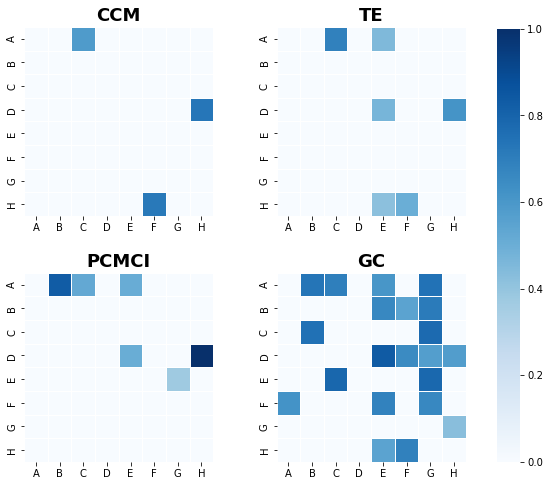

In [19]:
f, axes = plt.subplots(2, 2, figsize=(8,8))

f_1 = sns.heatmap(m_01, 
                  ax=axes[0][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_1.set_title('CCM', fontsize=18, fontweight='bold')

f_2 = sns.heatmap(m_02, 
                  ax=axes[0][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_2.set_title('TE', fontsize=18, fontweight='bold')

f_3 = sns.heatmap(m_03, 
                  ax=axes[1][0], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar=False, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_3.set_title('PCMCI', fontsize=18, fontweight='bold')

cbar_ax = f.add_axes([.95, .125, .04, 0.752])
f_4 = sns.heatmap(m_04, 
                  ax=axes[1][1], 
                  vmin=0, 
                  vmax=1, 
                  cmap='Blues', 
                  cbar_ax=cbar_ax, 
                  linewidths=.5, 
                  xticklabels=feature_names, 
                  yticklabels=feature_names, 
                  square=True)
f_4.set_title('GC', fontsize=18, fontweight='bold')

plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [20]:
score = ce.evaluation()
print('Normalized_score:')
print(score)

Normalized_score:
0.8125


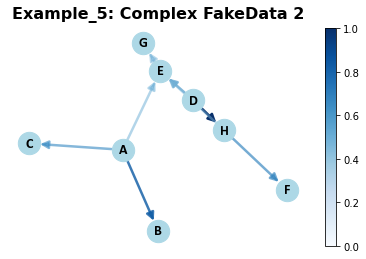

In [21]:
Graphic = causality_plotting(strength=strength_ensemble, 
                             feature_names=feature_names, 
                             title='Example_5: Complex FakeData 2', 
                             name_size='short',
                             node_color="lightblue", 
                             title_size=16,
                             seed=0)
plt.savefig('C:/Users/zhipe/OneDrive/Desktop/Master thesis/codes/examples/results/Example_5.jpg', 
            bbox_inches = 'tight',
            pad_inches=0.2,
            dpi=300)

Text(0.5, 1.0, 'Comprehensive Ensemble')

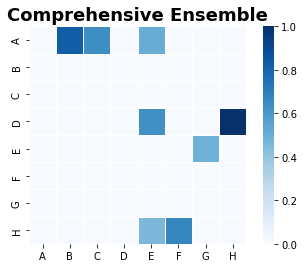

In [22]:
fig_0 = sns.heatmap(strength_ensemble, 
                    vmin=0, 
                    vmax=1, 
                    cmap='Blues', 
                    linewidths=.5, 
                    xticklabels=feature_names, 
                    yticklabels=feature_names, 
                    square=True)
fig_0.set_title('Comprehensive Ensemble', fontsize=18, fontweight='bold')